In [ ]:
!pip install -Uqq ipdb
import ipdb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 13.1 MB/s eta 0:00:00


In [23]:
import numpy as np
import matplotlib.pyplot as plt

# Main libraries used in Bayesian Optimisation Implementation using Gausian Process
import pymc as pm
from scipy.optimize import minimize, dual_annealing
from scipy.stats import norm


class bayes_optimizer():
    def __init__(self, objective_func, x_range, kernel='Matern52', mid_points=9, plot=True, mode="MCMC"):
        self.objective_func = objective_func  #Our blackbox function
        self.cov_func = kernel  #Kernel to be used
        # Parameters bounds to be used assuming the parameters are continuous
        # Can easily be extended to discrete space by using any mapping
        self.x_min = np.array(x_range[0]).reshape(-1,) 
        self.x_max = np.array(x_range[1]).reshape(-1,)
        self.dim = len(self.x_min)

        # Pickup mid_points initially between 0.1 - 0.9 of the parameter range
        # Sampling the objective function uniformly at mid_points
        self.x = self.x_min + np.linspace(0, 1, mid_points + 2) * (self.x_max - self.x_min)
        self.x = np.reshape(self.x, (len(self.x), 1))
        print(self.x)
        self.y = np.array([objective_func(i) for i in self.x]).reshape(-1,)
        self.if_plot = plot
        self.best_values = []
        self.mode = mode

    def Sampling(self, mode="OPT", acquisition="EI"):
        with pm.Model() as model:
            # setting D+3 hyperparameters for Gaussian process by sampling it from Gamma distributions  
            # These parameters govern the prior distriburions
            # How to get the best prior ??
            theta = pm.Gamma("theta", alpha=1, beta=1, shape=(self.dim,))
            theta0 = pm.Gamma("theta0", alpha=1, beta=1)
            # Using ARD Matern52 as covariance function to be used
            # Can experiment with other covariance functions 
            if self.cov_func == "Matern52":
                cov_func = theta0 ** 2 * pm.gp.cov.Matern52(input_dim=self.dim, ls=theta)
            # We will use constant mean for our Gaussian process
            m = pm.gp.mean.Constant(self.y.mean())
            gp = pm.gp.Marginal(mean_func=m, cov_func=cov_func)
            # For nu, using a Half-Cauchy distribution for noise
            nu = pm.HalfCauchy("nu", 1)
            gp.marginal_likelihood("f", X=self.x, y=self.y, noise=nu)

            if mode == "MCMC":
                N_trace = 1000 #Number of samples drawn
                thinning = 4 # Thinning factor
                trace = pm.sample(N_trace,chains=1)
                pm.plot_trace(trace)
                # Create multitrace object to pass after thinning
                theta_list = np.array(trace['posterior']['theta'].sel(draw=slice(0,N_trace-1,int(N_trace/thinning)))[0])
                theta0_list = np.array(trace['posterior']['theta0'].sel(draw=slice(0,N_trace-1,int(N_trace/thinning)))[0])
                nu_list = np.array(trace['posterior']['nu'].sel(draw=slice(0,N_trace-1,int(N_trace/thinning)))[0])
                trace_list = []
                for i in range(len(theta_list)):
                  trace_list.append({'theta': theta_list[i], 'theta0': theta0_list[i], 'nu': nu_list[i]})
                x_next = self.Get_next(params=trace_list,acquisition=acquisition,gp=gp)
                return x_next
            elif mode == "OPT":
                # Optimisation method
                MAP = pm.find_MAP()
                x_next = self.Get_next(params=MAP, acquisition=acquisition, gp=gp)
                return x_next

    def Get_next(self, params, acquisition, gp):
        # define acqusition function
        def acq(x_star):
            # print(f"Debug: {x_star}" , len(x_star))
            x_star = np.array(x_star).reshape(1, -1)
            if self.mode == 'MCMC':
                integrated_acq = 0
                for t in params:
                    mean, var = gp.predict(x_star, point=t, diag=True, pred_noise=False)
                    mean = mean[0]
                    std = np.sqrt(var[0])
                    if acquisition == "EI":
                        #Expected Improvement
                        f_best = self.y.min()
                        gamma = (-f_best + mean) / std
                        integrated_acq = integrated_acq +  (std * (norm.cdf(gamma) * gamma + norm.pdf(gamma)))
                    elif acquisition == "PI":
                        # Probability of improvement
                        f_best = self.y.min()
                        gamma = (-f_best + mean) / std
                        integrated_acq = integrated_acq + (norm.cdf(gamma))
                    elif acquisition == "LCB":
                        # Tunable parameter Kappa in case of Lower Confidence bound
                        kappa = 1
                        integrated_acq = integrated_acq + (mean - (kappa) * std)
                integrated_acq = integrated_acq/len(params)
                return integrated_acq
            else: #OPT mode where there is no integration over various samples
                mean, var = gp.predict(x_star, point=params, diag=True, pred_noise=False)
                mean = mean[0]
                std = np.sqrt(var[0])
                if acquisition == "EI":
                    #Expected Improvement
                    f_best = self.y.min()
                    gamma = (-f_best + mean) / std
                    return std * (norm.cdf(gamma) * gamma + norm.pdf(gamma))
                elif acquisition == "PI":
                    # Probability of improvement
                    f_best = self.y.min()
                    gamma = (-f_best + mean) / std
                    return norm.cdf(gamma)
                elif acquisition == "LCB":
                    # Tunable parameter Kappa in case of Lower Confidence bound
                    kappa = 1
                    return mean - (kappa) * std

        # optimize for the best point from acquisition function
        bounds = [(low, high) for low, high in zip(self.x_min, self.x_max)]
        alpha_temp = np.random.rand(1)[0]
        result = minimize(acq, x0=alpha_temp*self.x_min + (1-alpha_temp)*self.x_max, bounds=bounds)
        # result = dual_annealing(acq, bounds=bounds)
        
        #Debug start
        # debug_x = np.linspace(0, 1, 40)*(self.x_max - self.x_min) + self.x_min
        # debug_y = []
        # for i in debug_x:
        #     debug_y.append(acq(i))
        # plt.figure()
        # plt.plot(debug_x, debug_y)
        # plt.show()
        #Debug end
        x_next = result.x
        print(f"x_next = {x_next}")
        # ipdb.set_trace()
        return x_next

    def find_best(self, mode="MCMC", acquisition="EI", max_iter=10):
        for i in range(max_iter):
            print(f'----Iteration{i} started')
            self.best_values.append(np.min(self.y))
            x_new = self.Sampling(acquisition=acquisition, mode=mode)
            # if x_new in self.x:
            #     break
            y_new = self.objective_func(x_new)
            def plot_objective(self, func, point):
                x = np.linspace(self.x_min, self.x_max, 25)
                y = []
                for x_temp in x:
                    y.append(func(x_temp))
                plt.figure()
                plt.plot(x, y, 'g--', label="Blackbox function")
                plt.scatter(self.x, self.y, marker='o', color="b", label="Existing pts")
                plt.plot([point], [func(point)], marker='o', markersize=10, color="red", label="Next pt")
                plt.legend(loc="best")
                plt.show()
            if self.if_plot:
                # Plot the objective/blackbox function with current values and next value
                # Can be used only in case of 1-D plots
                plot_objective(self, self.objective_func, x_new)
            self.x = np.vstack((self.x, x_new))
            self.y = np.hstack((self.y, y_new))
        return self.x[np.argmin(self.y)], self.best_values

    

[[ 0.        ]
 [ 1.25663706]
 [ 2.51327412]
 [ 3.76991118]
 [ 5.02654825]
 [ 6.28318531]
 [ 7.53982237]
 [ 8.79645943]
 [10.05309649]
 [11.30973355]
 [12.56637061]]
----Iteration0 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.21210109]


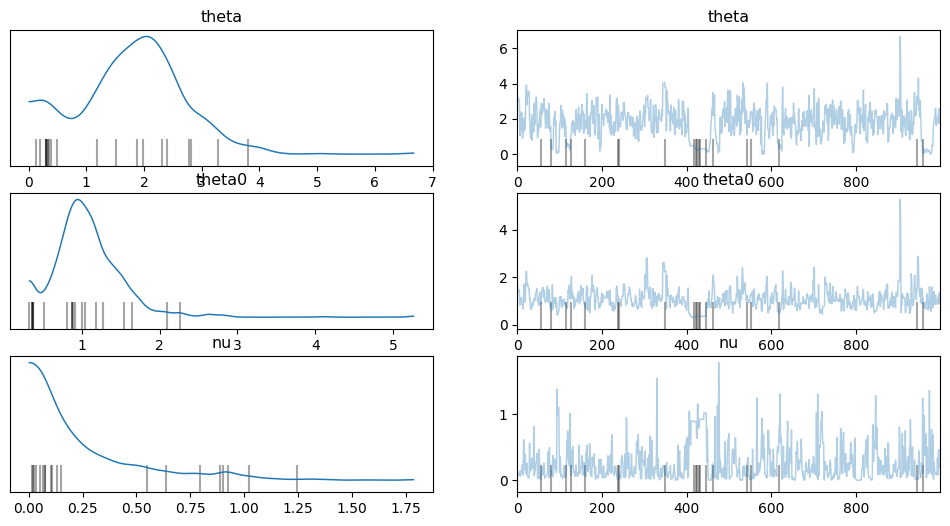

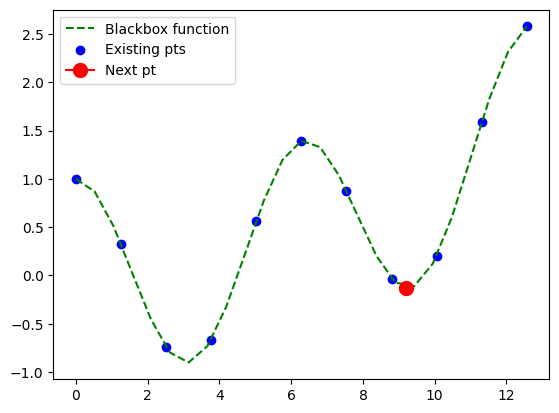

----Iteration1 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [2.8423314]


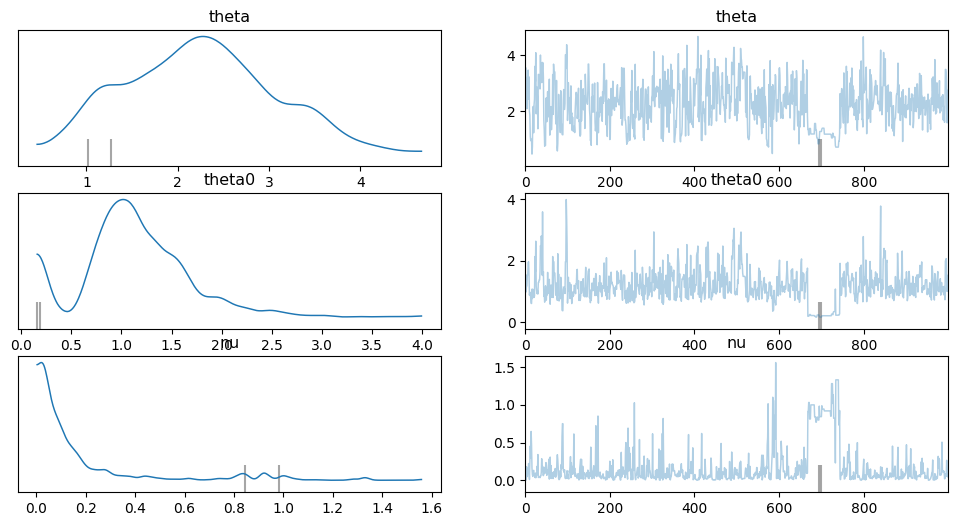

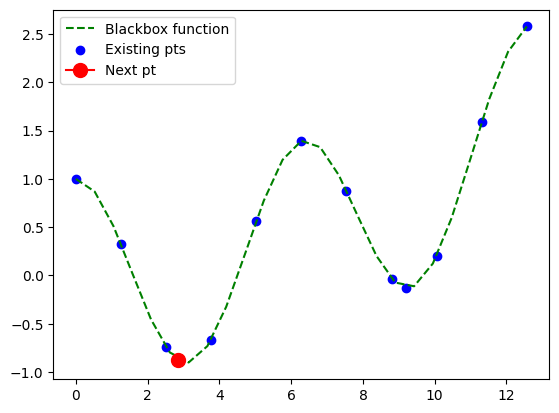

----Iteration2 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [2.97764592]


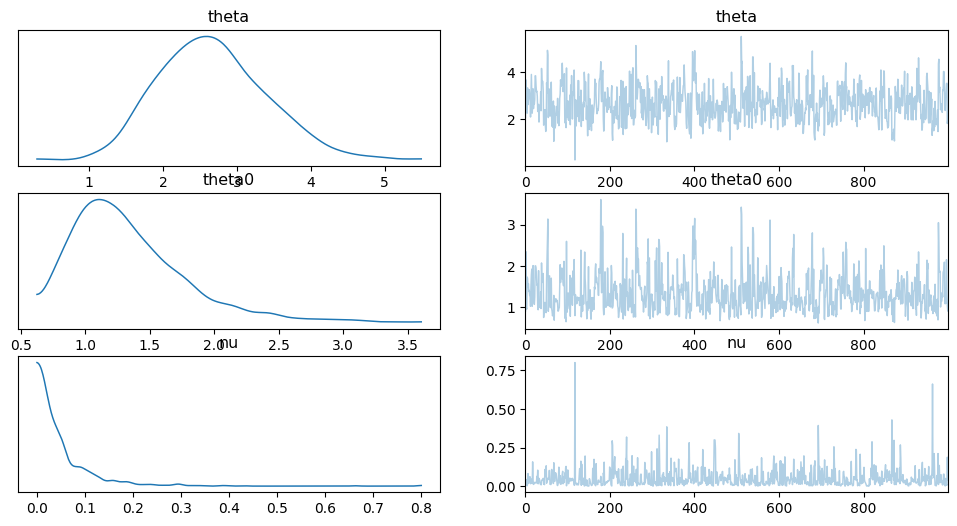

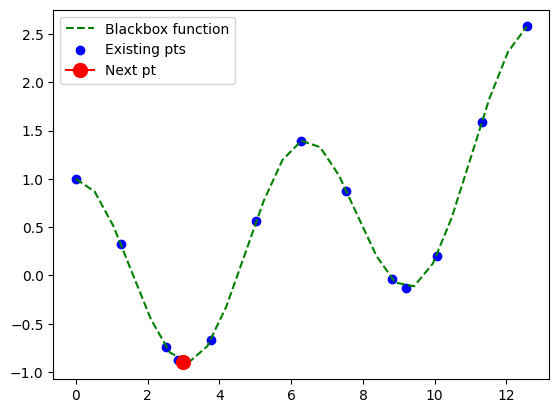

----Iteration3 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.02558917]


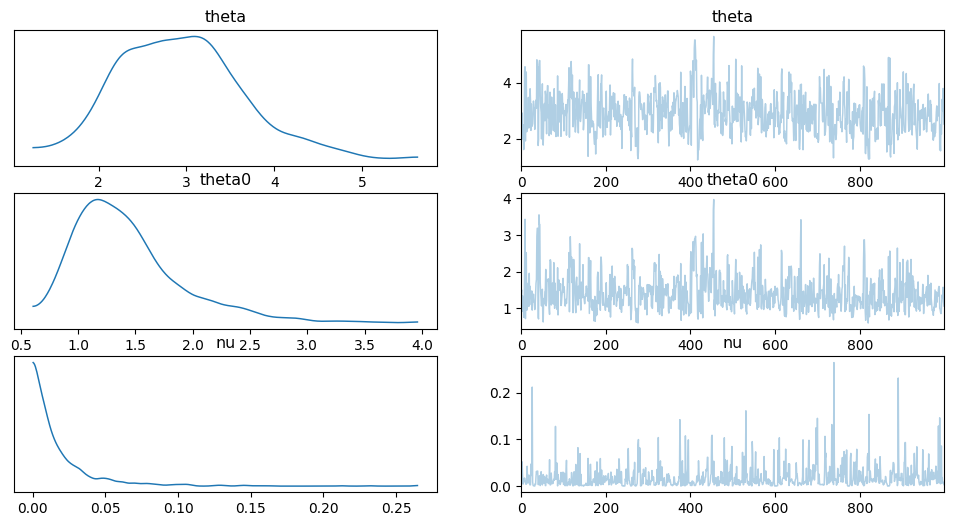

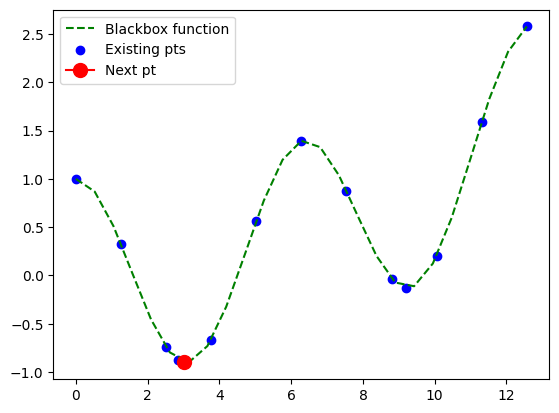

----Iteration4 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.23895573]


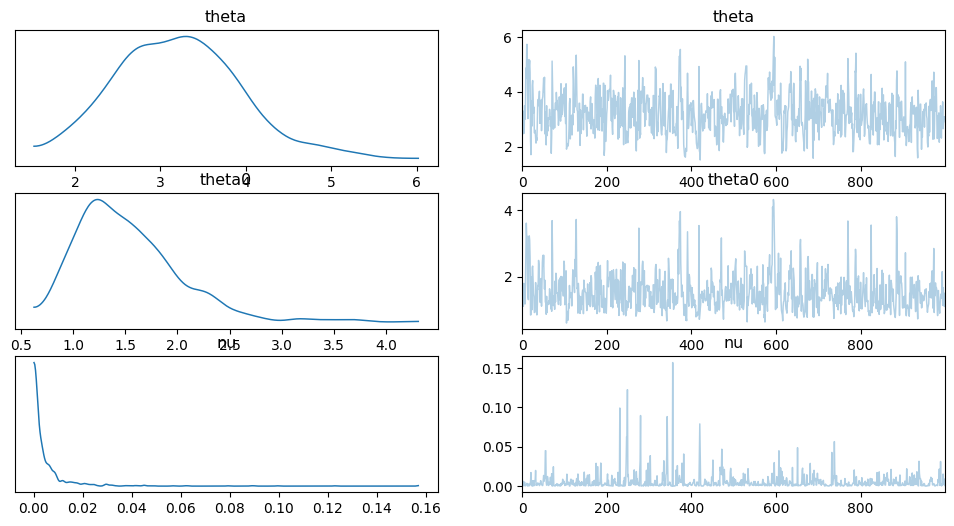

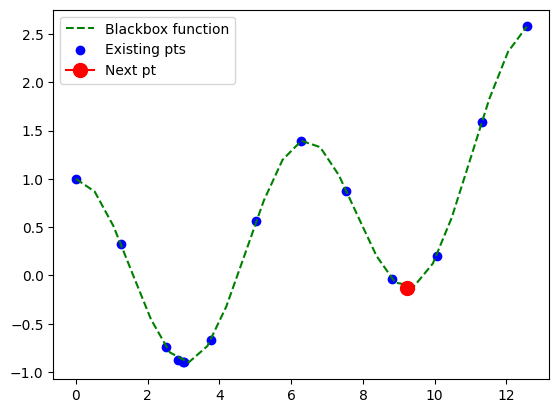

----Iteration5 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.23964603]


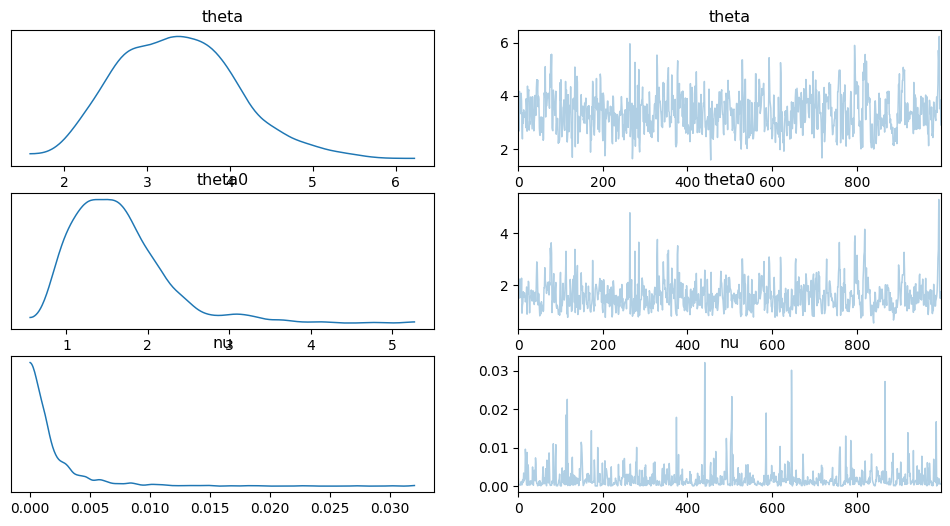

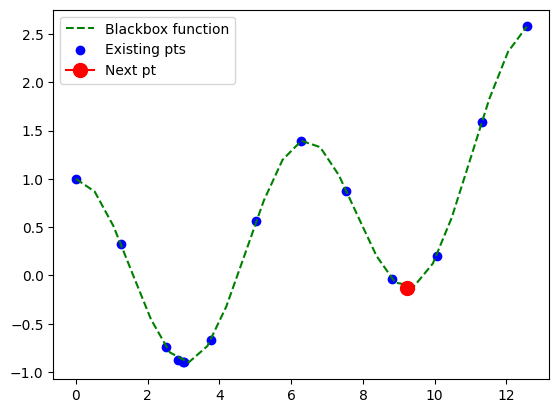

----Iteration6 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.2403231]


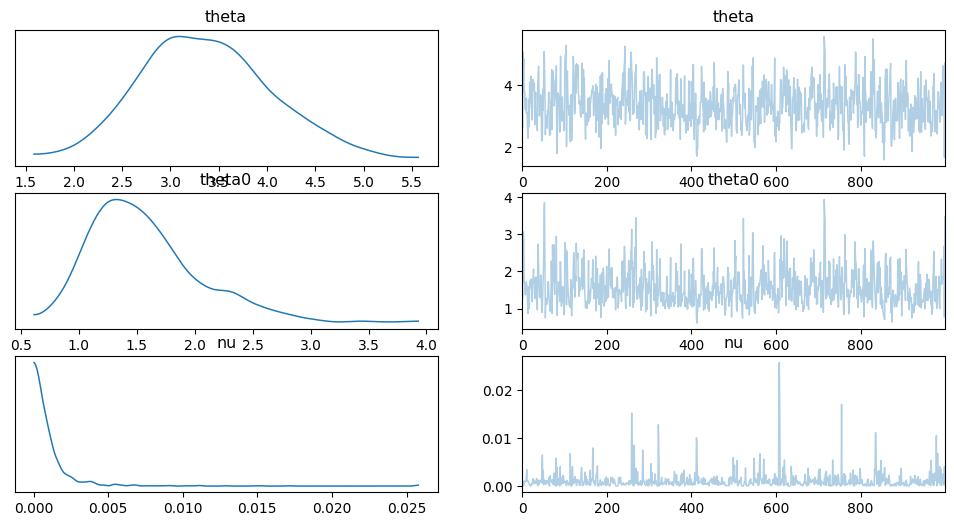

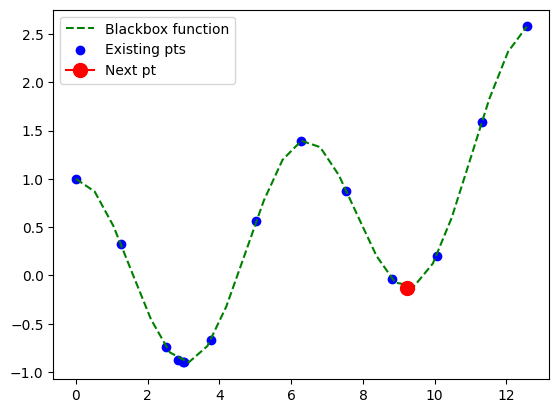

----Iteration7 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.04996386]


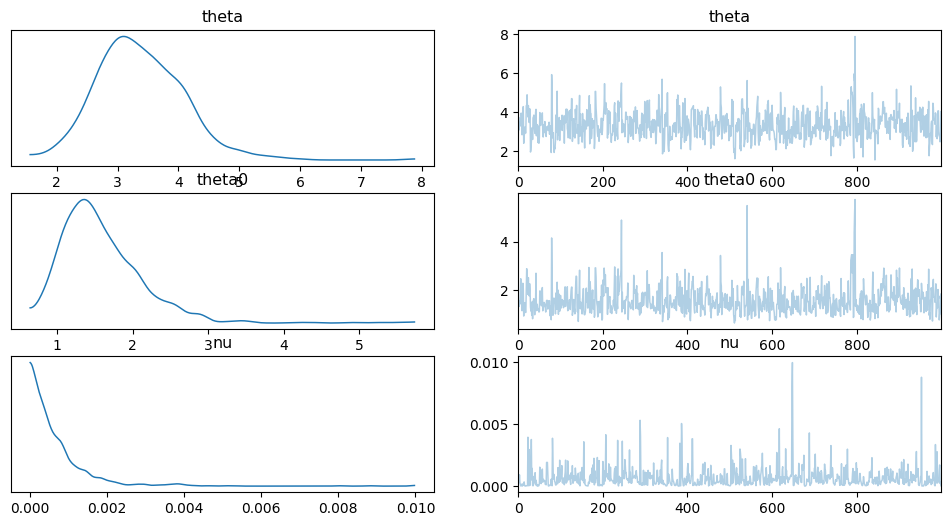

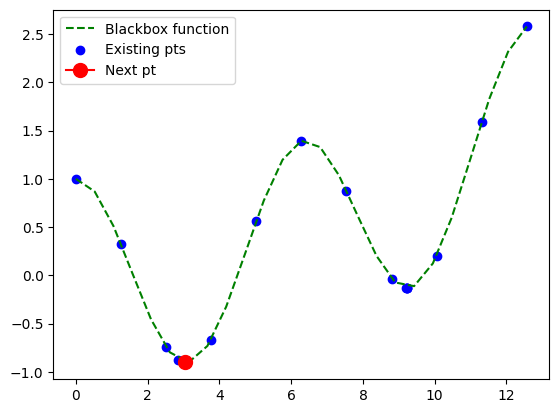

----Iteration8 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.23967809]


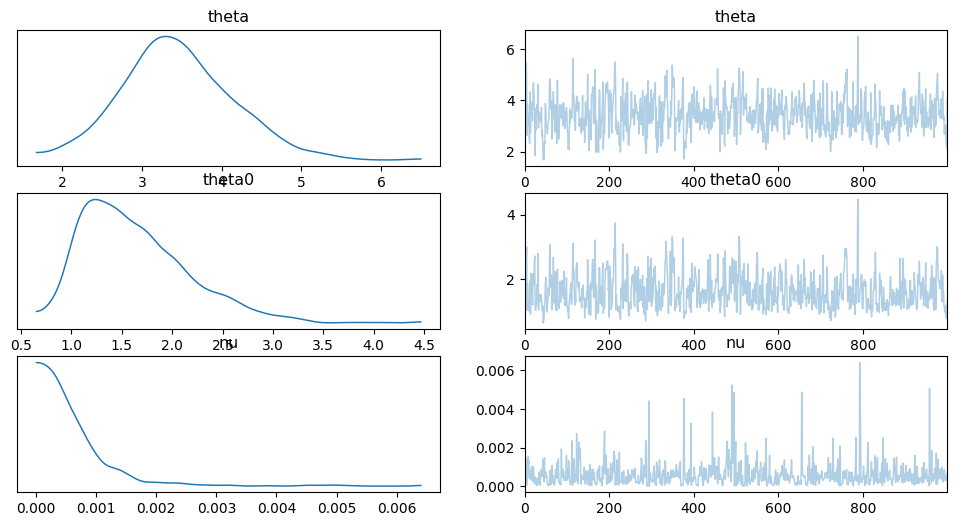

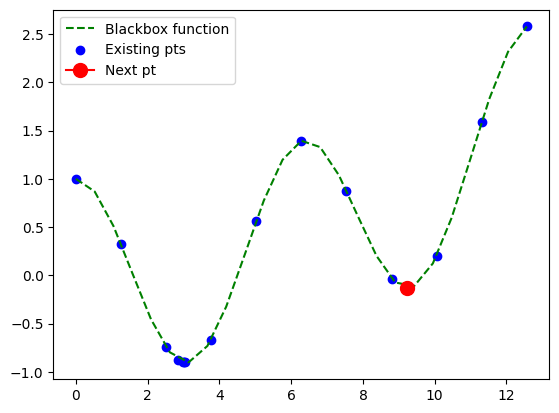

----Iteration9 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.06517938]


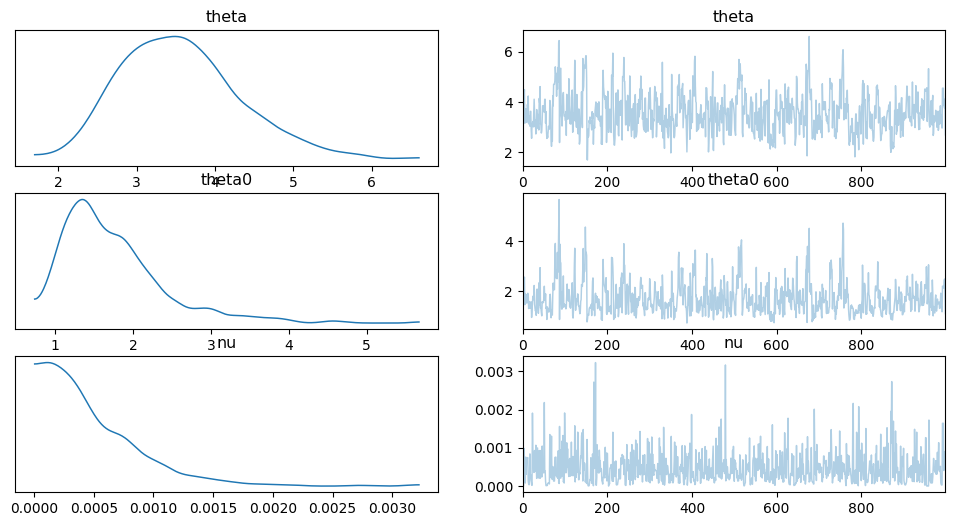

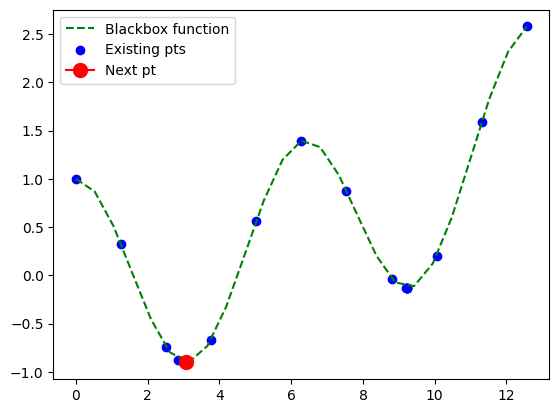

----Iteration10 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.23976078]


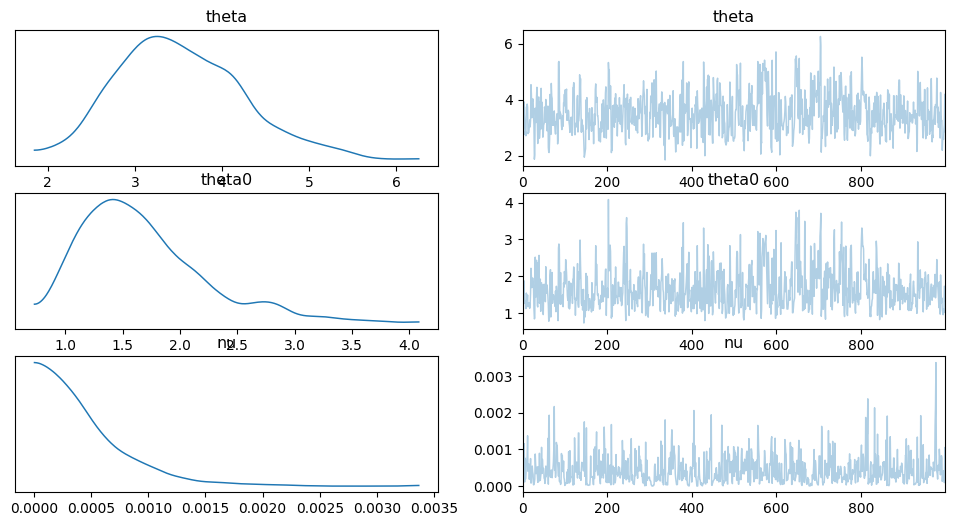

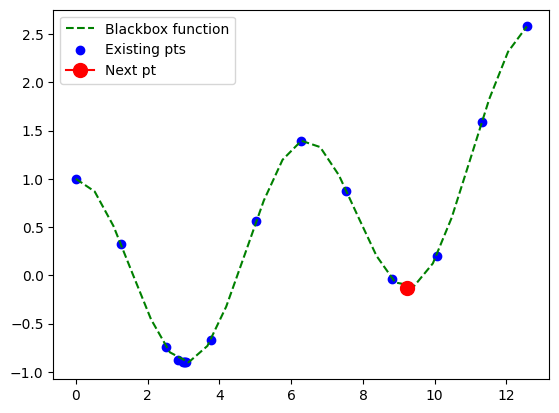

----Iteration11 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.07036273]


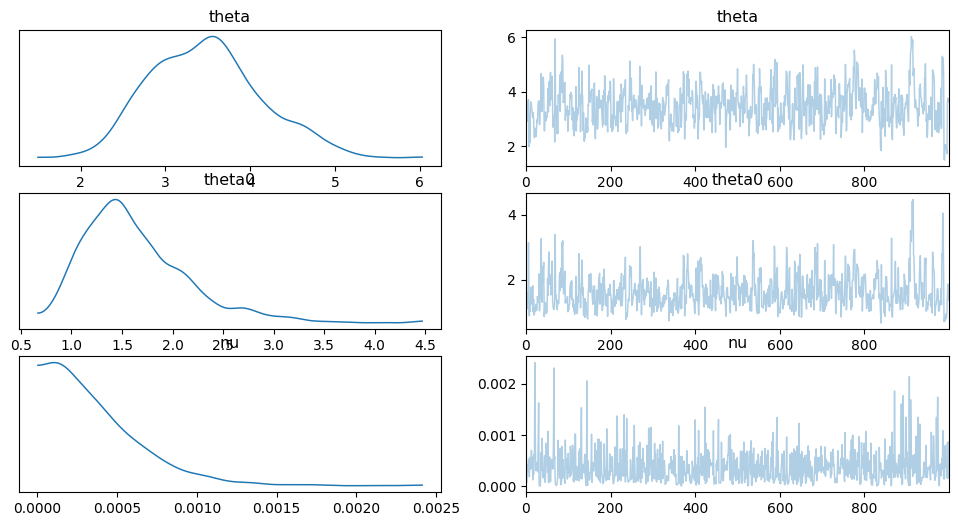

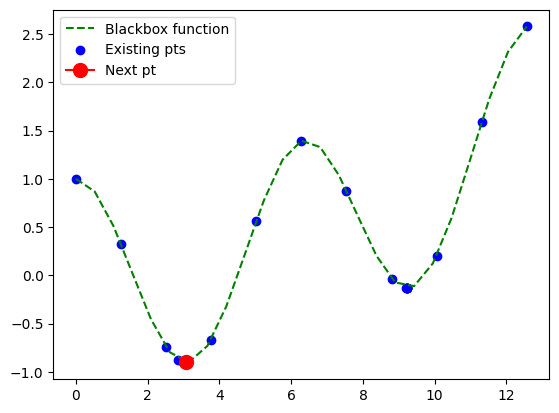

----Iteration12 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.07039438]


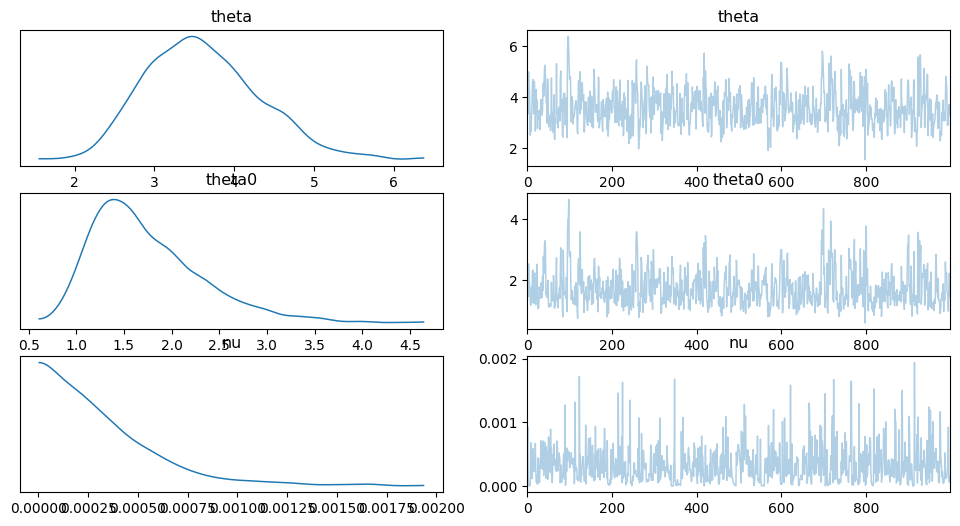

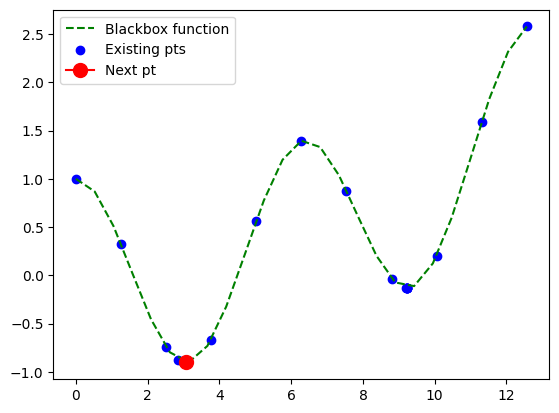

----Iteration13 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.07257894]


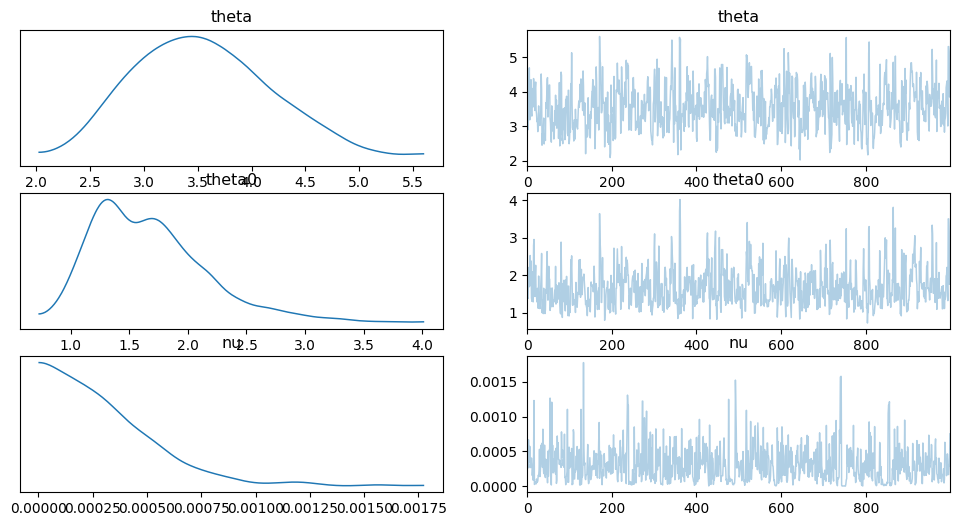

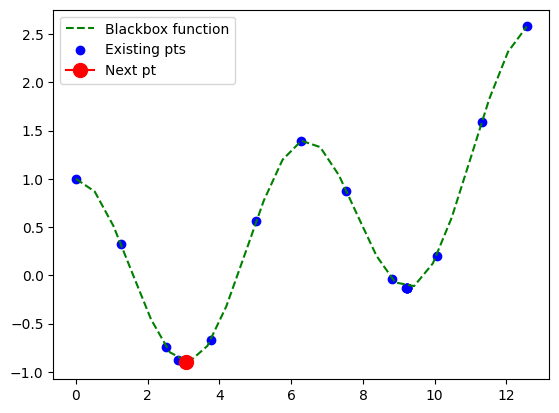

----Iteration14 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.24009174]


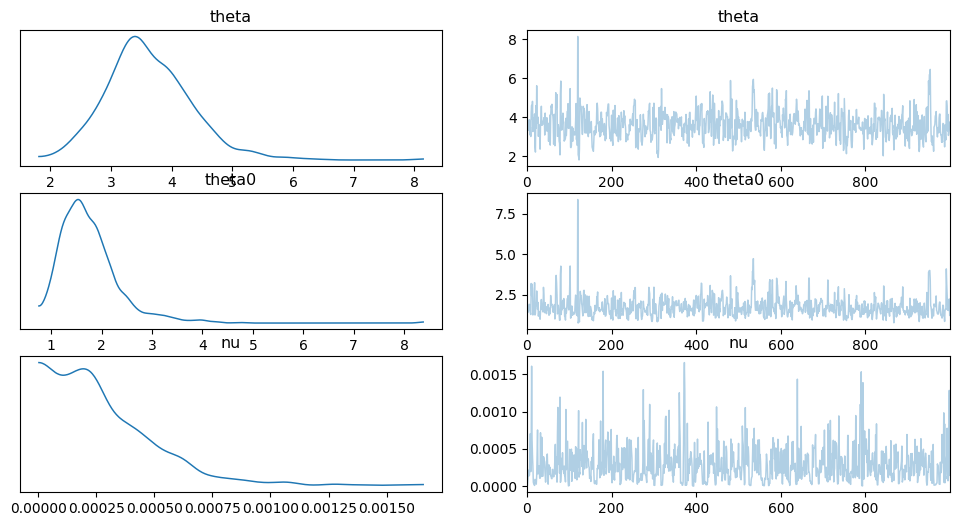

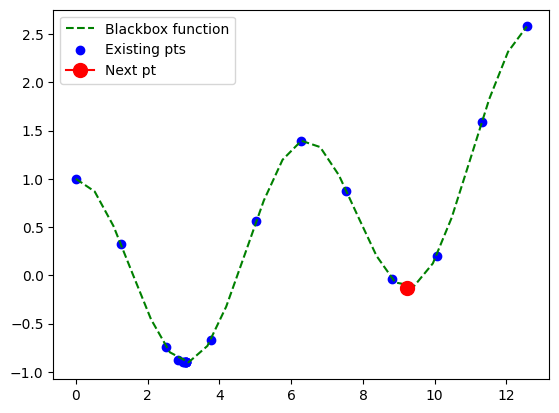

----Iteration15 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.07331808]


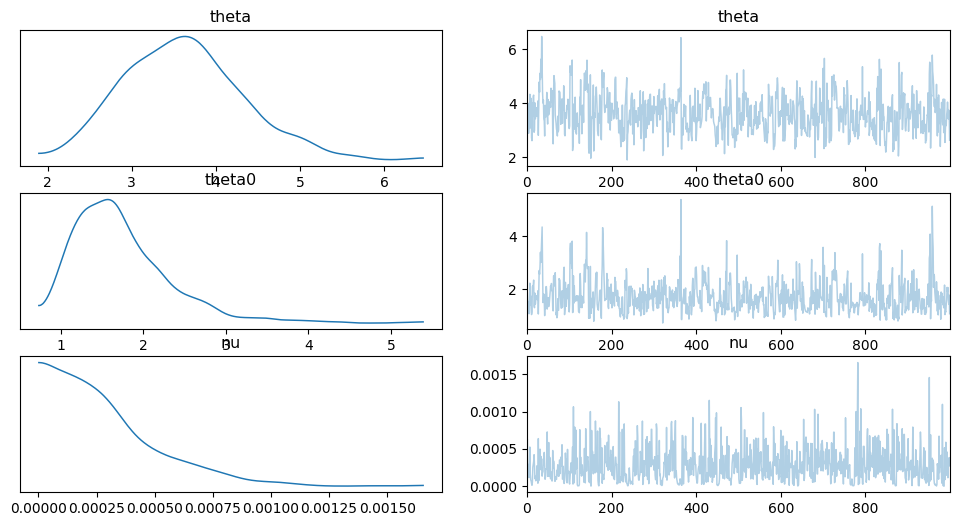

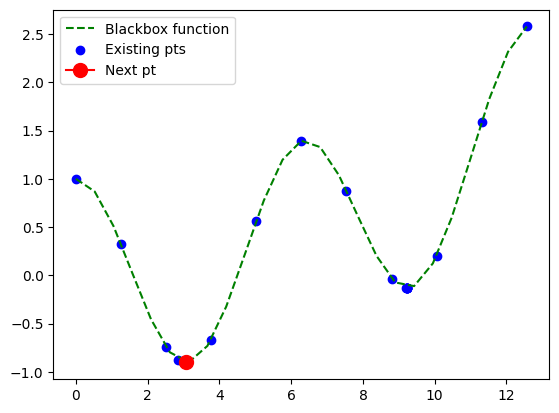

----Iteration16 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.0743046]


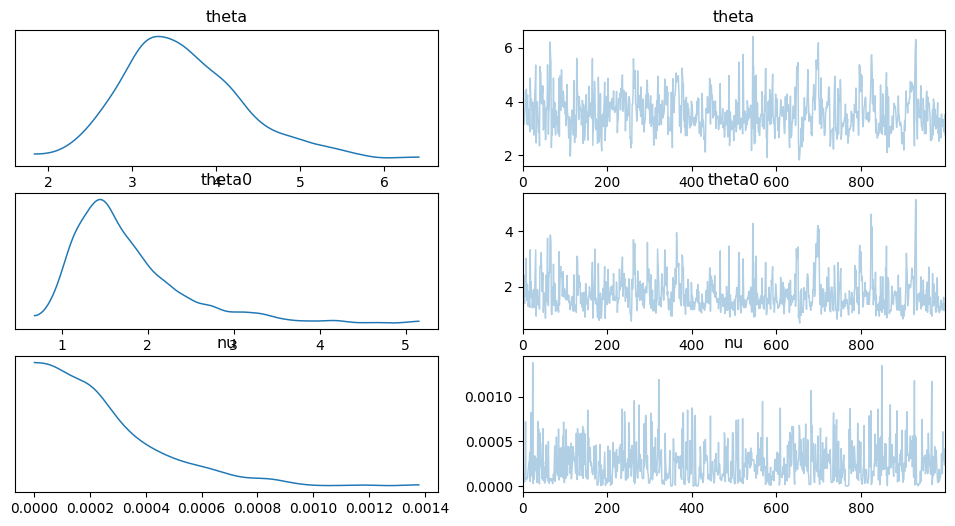

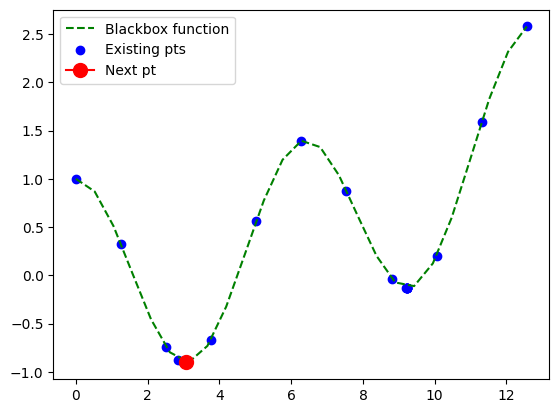

----Iteration17 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.23972627]


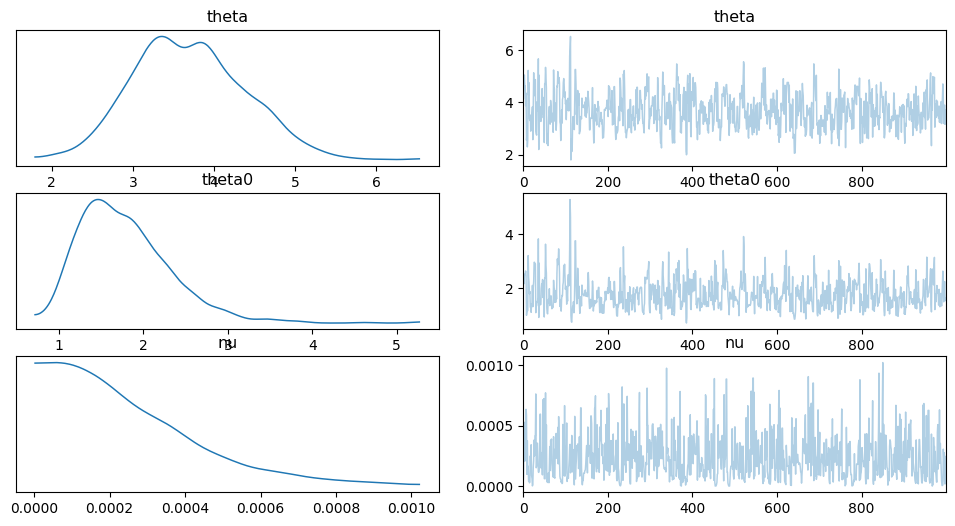

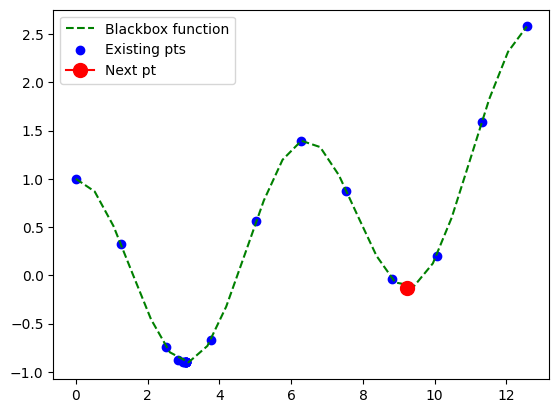

----Iteration18 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.2397452]


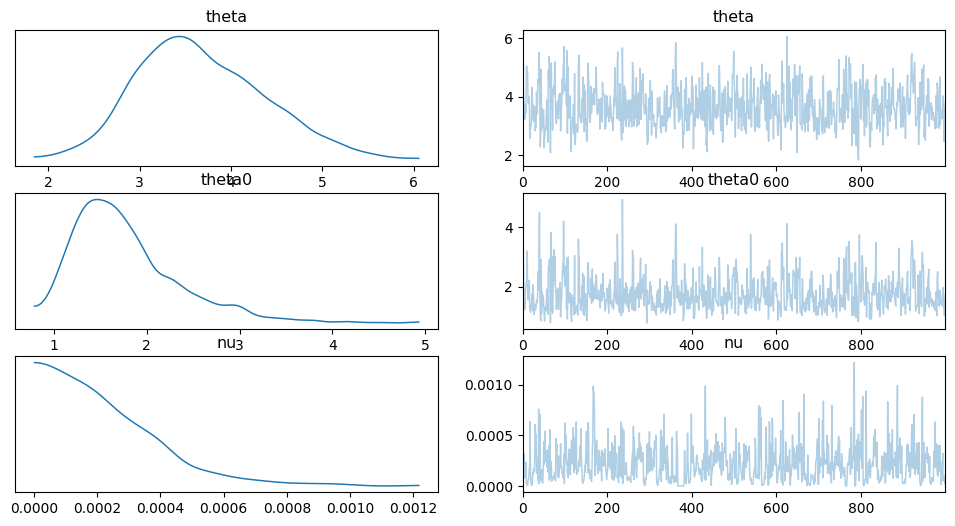

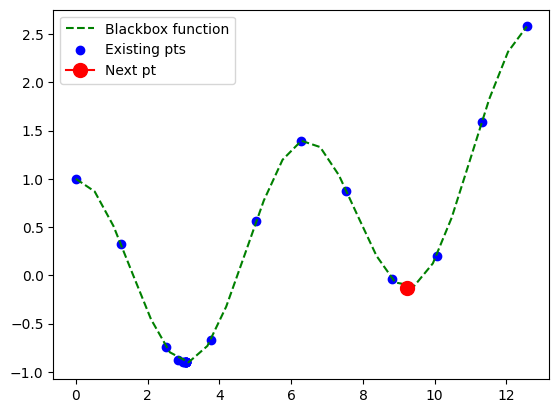

----Iteration19 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.07455038]


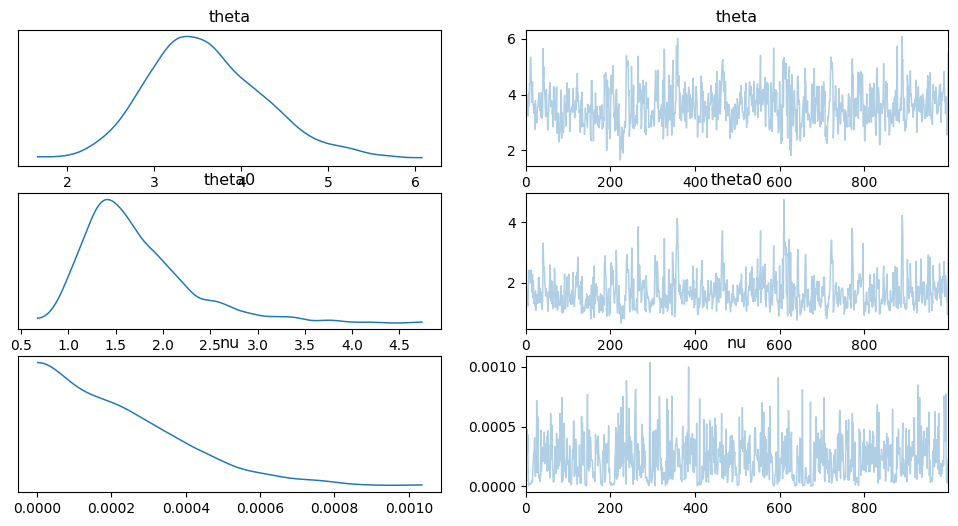

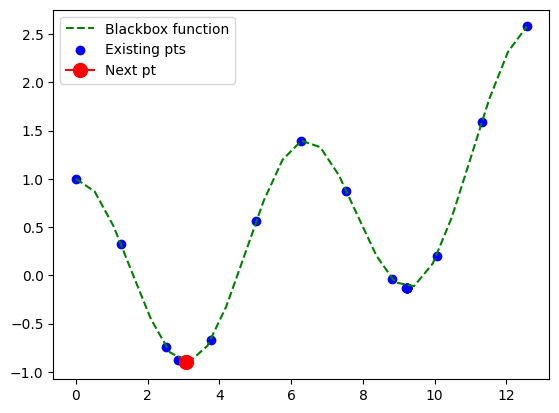

[[ 0.        ]
 [ 1.25663706]
 [ 2.51327412]
 [ 3.76991118]
 [ 5.02654825]
 [ 6.28318531]
 [ 7.53982237]
 [ 8.79645943]
 [10.05309649]
 [11.30973355]
 [12.56637061]]
----Iteration0 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [8.93456397]


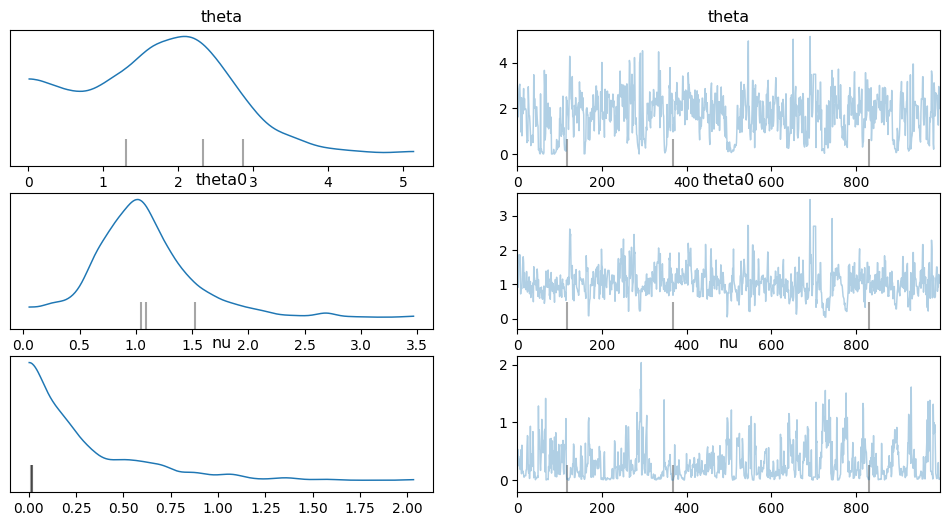

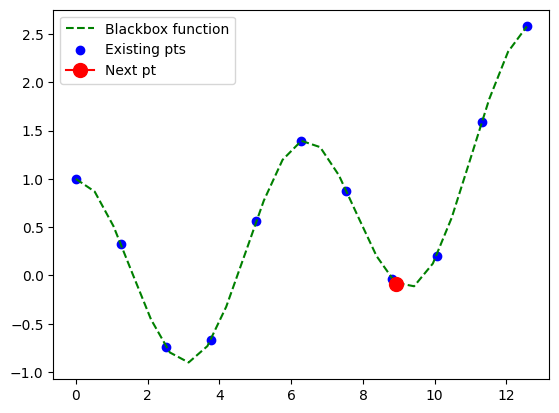

----Iteration1 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [7.41890396]


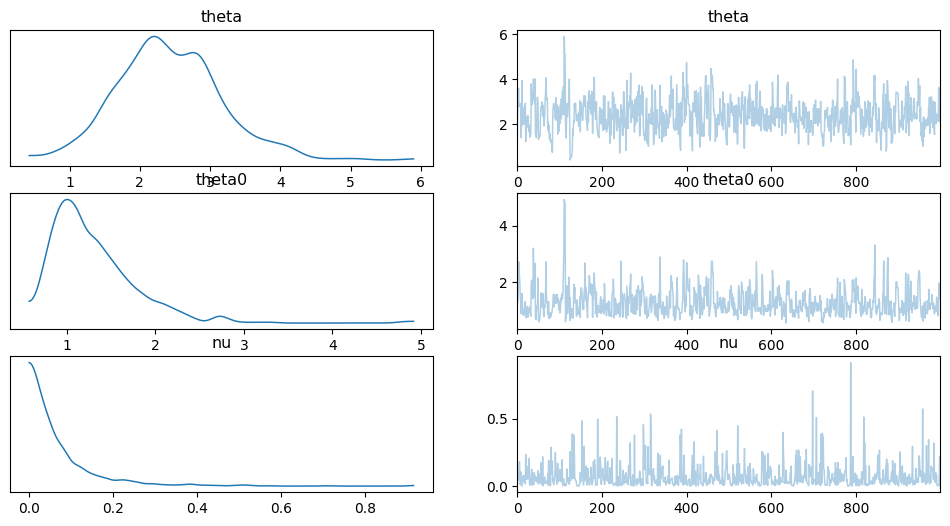

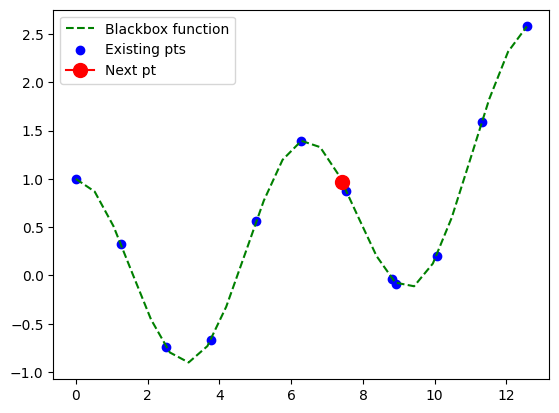

----Iteration2 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [7.31269457]


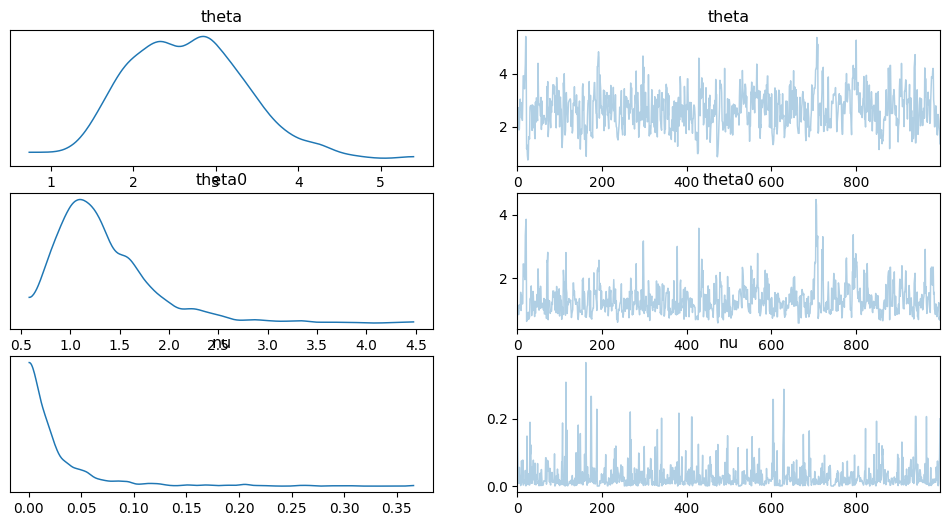

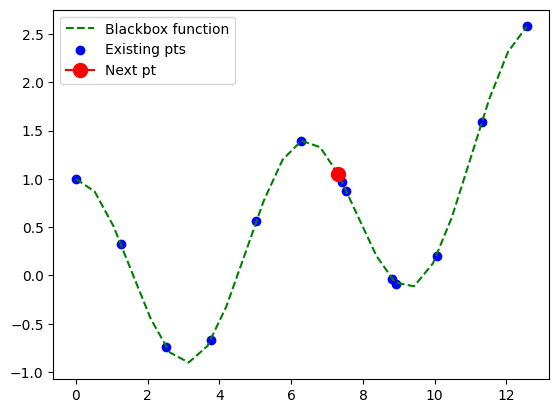

----Iteration3 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [0.68429831]


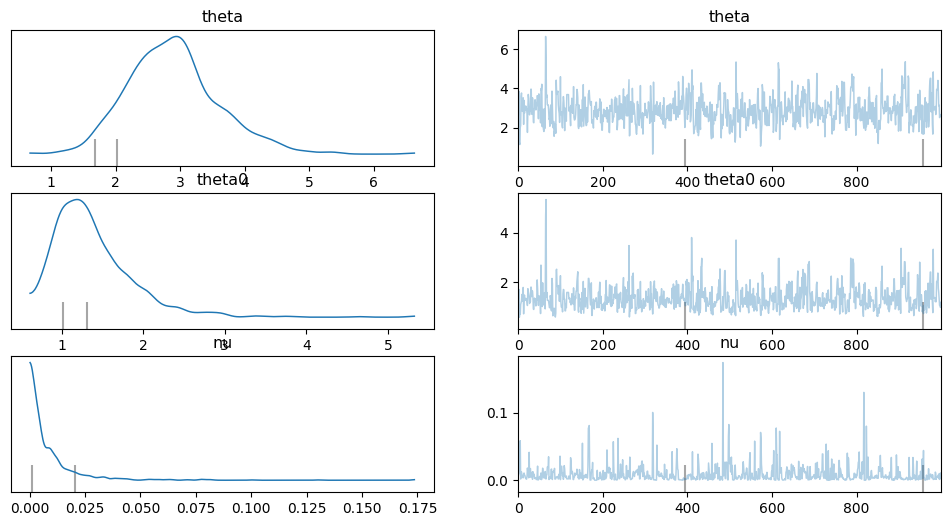

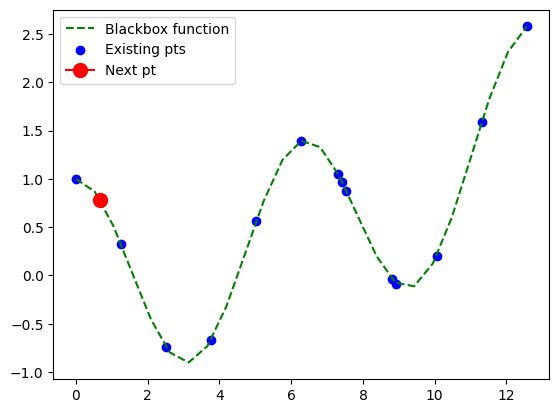

----Iteration4 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [8.76775029]


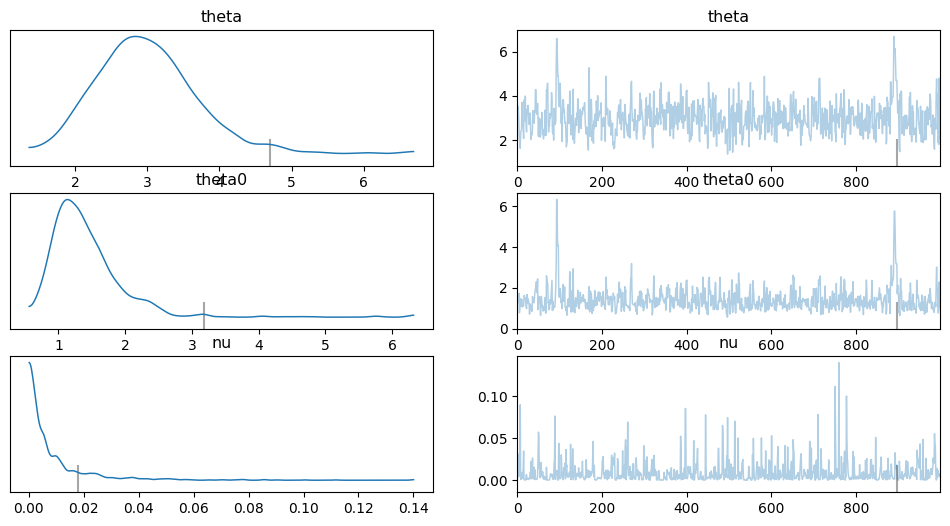

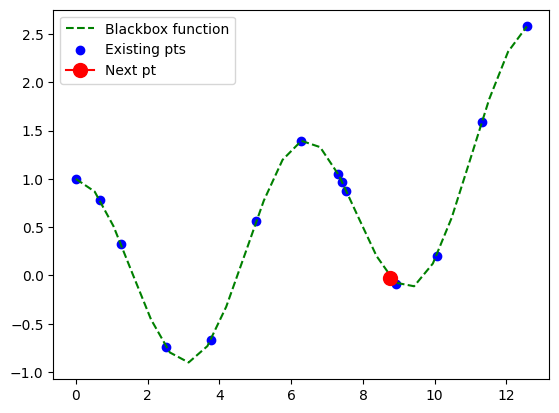

----Iteration5 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [8.81382844]


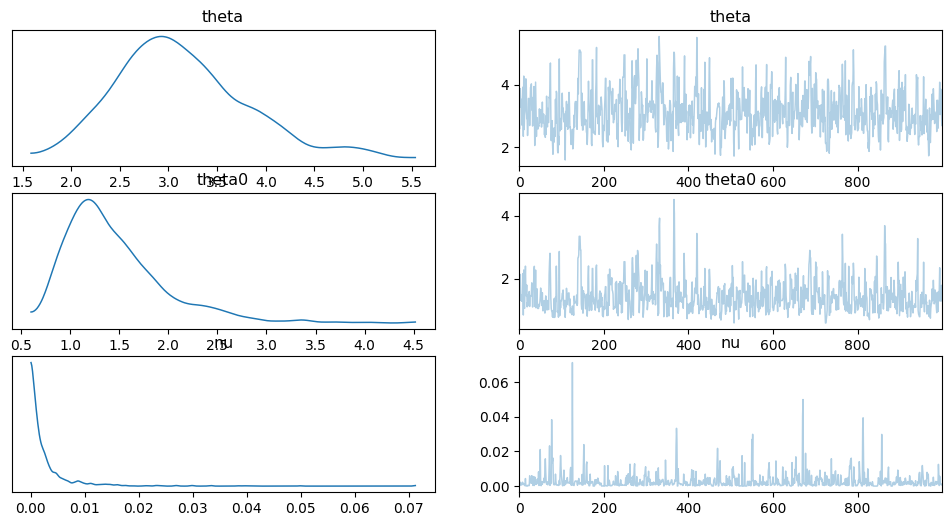

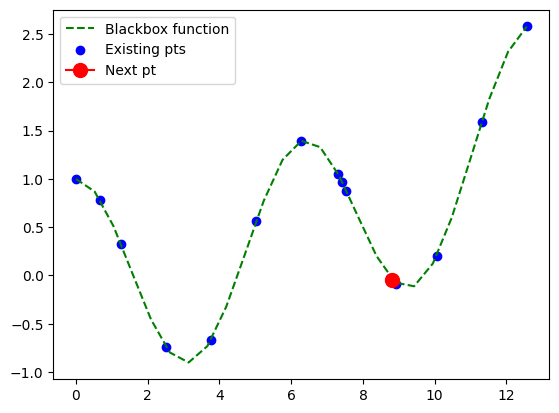

----Iteration6 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [1.41943824]


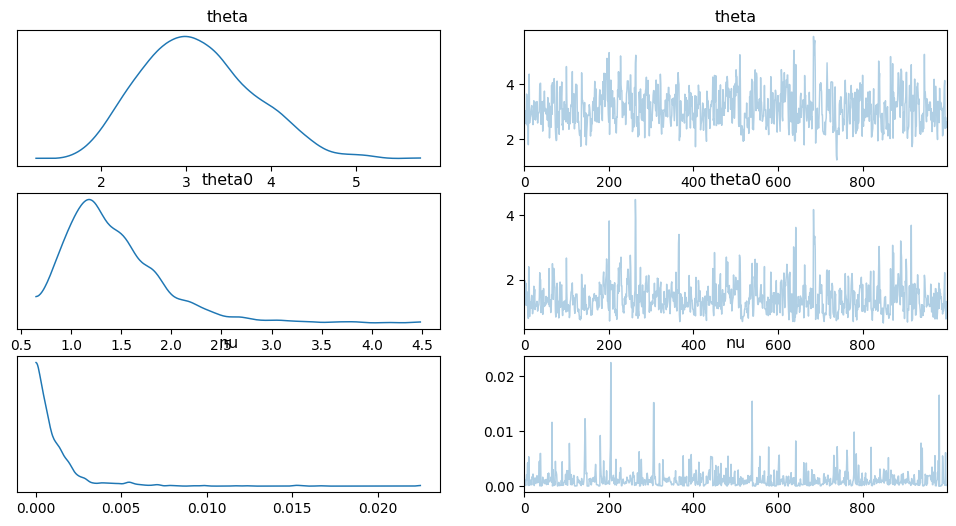

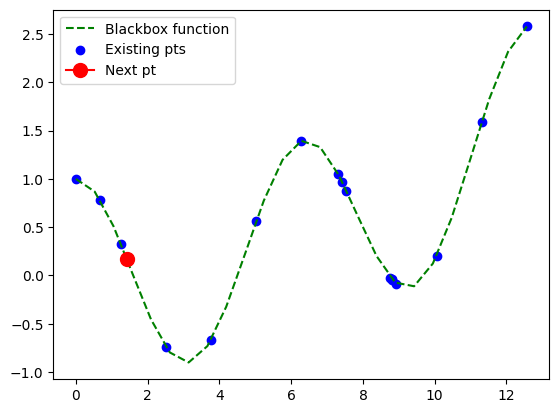

----Iteration7 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [6.35904288]


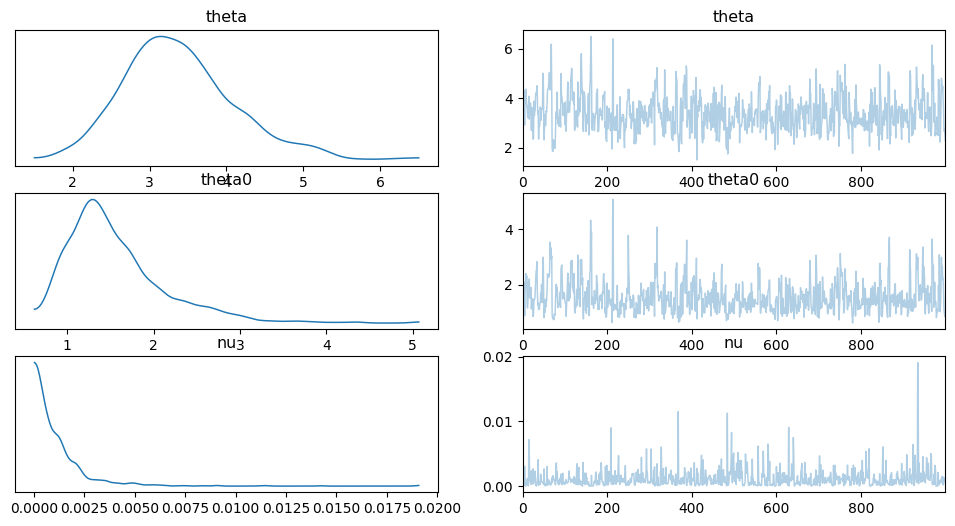

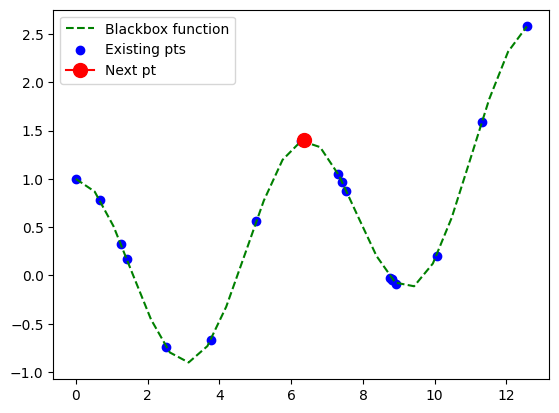

----Iteration8 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [4.7685302]


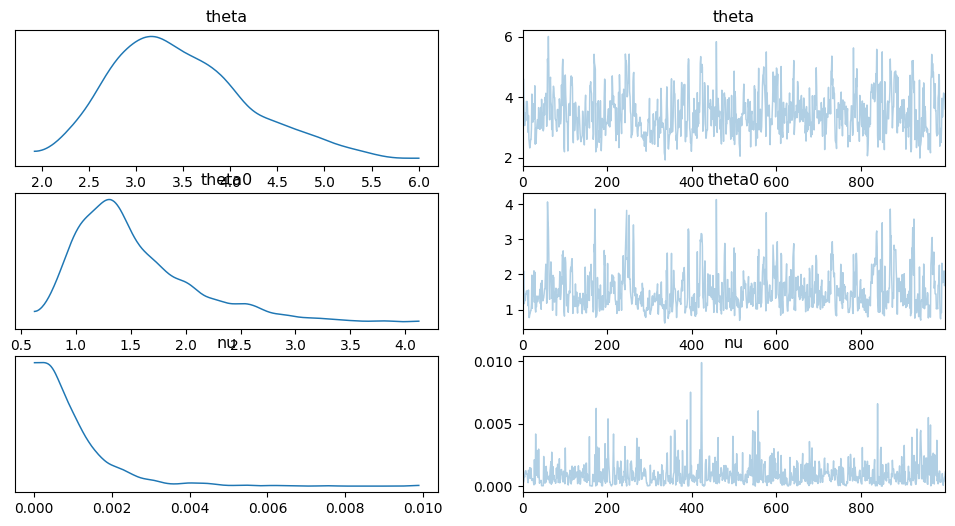

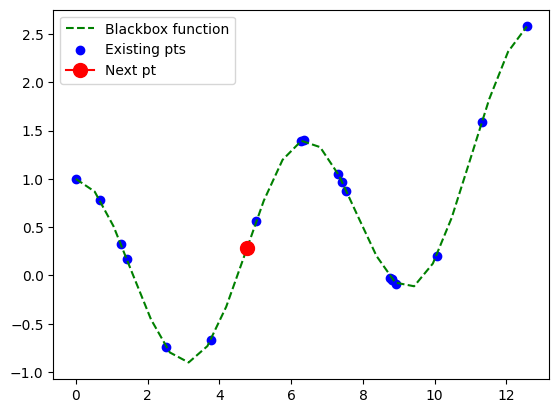

----Iteration9 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [12.50004659]


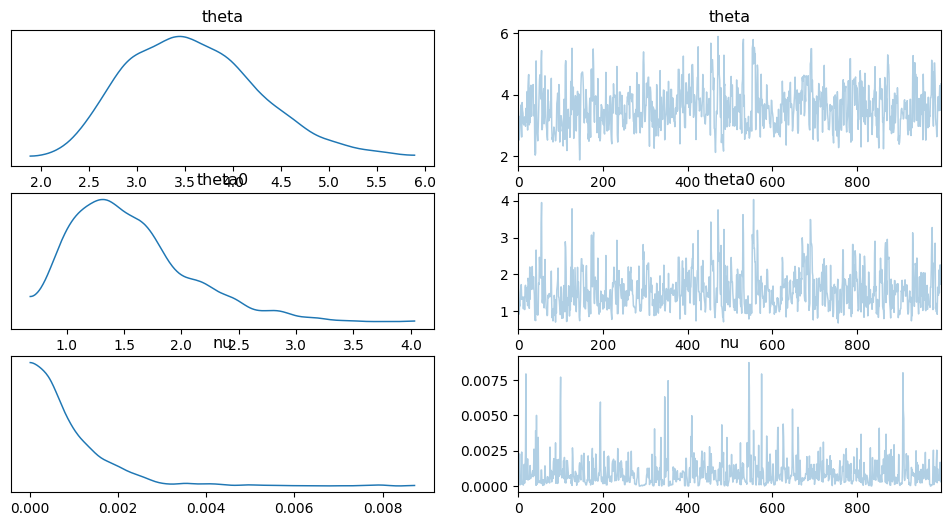

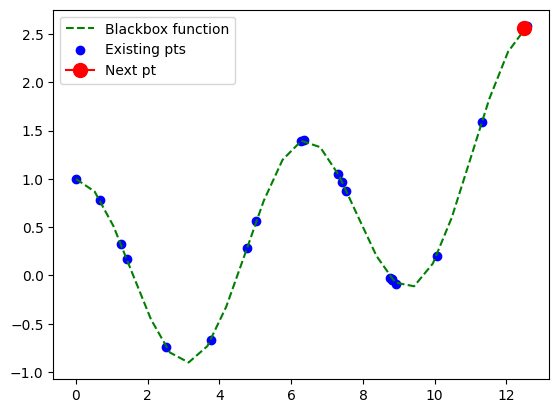

----Iteration10 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [6.18571055]


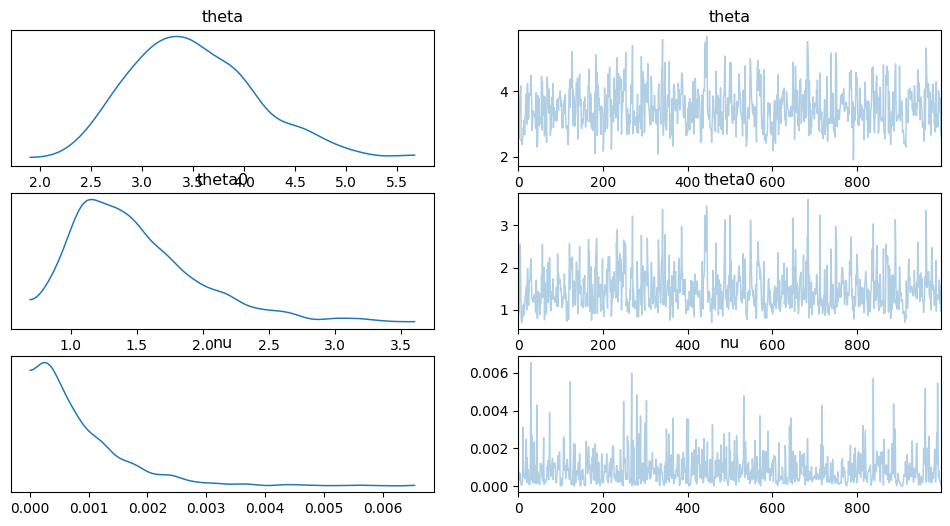

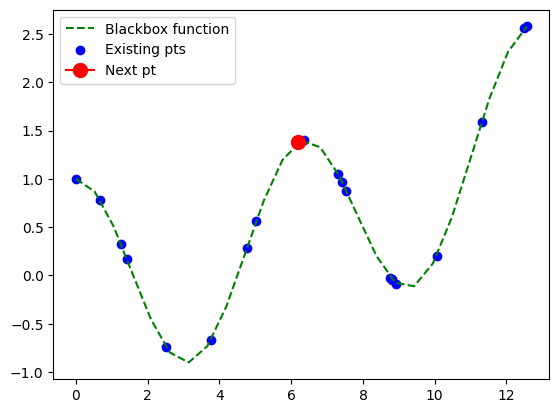

----Iteration11 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [6.52221687]


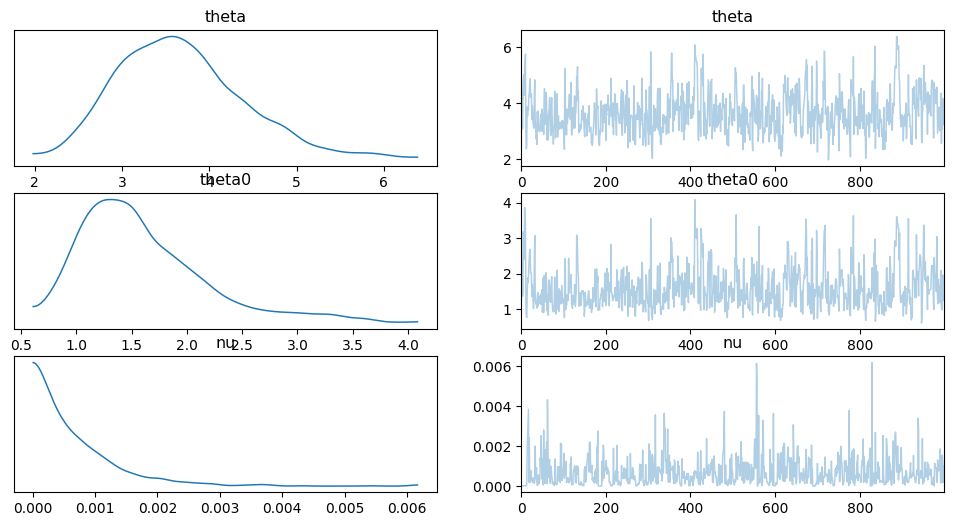

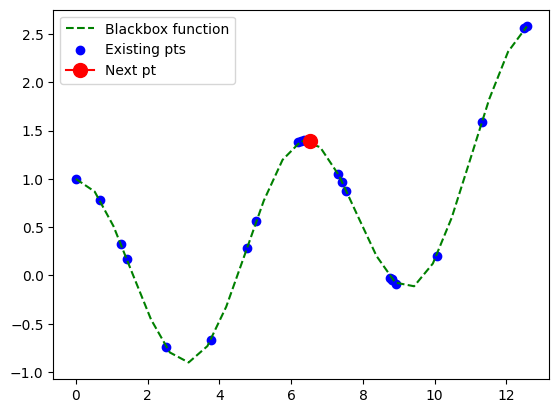

----Iteration12 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [5.86111799]


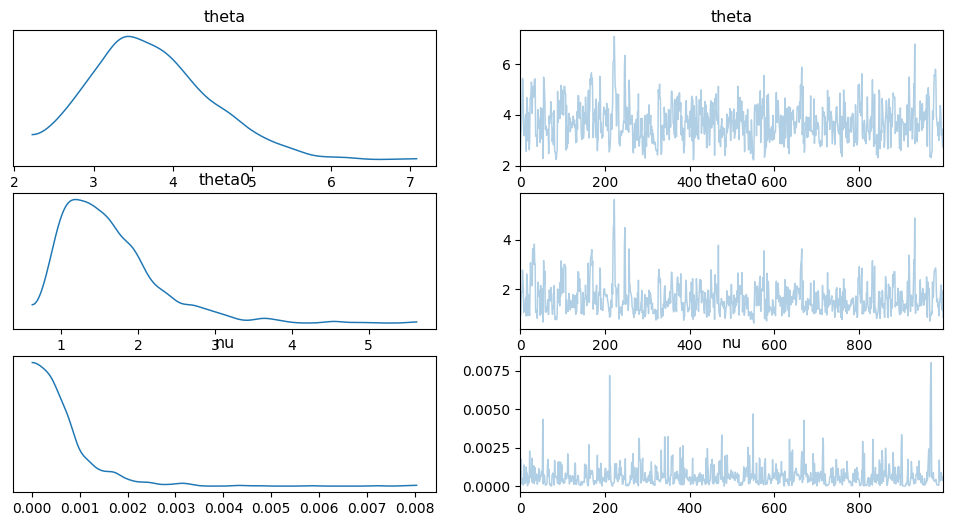

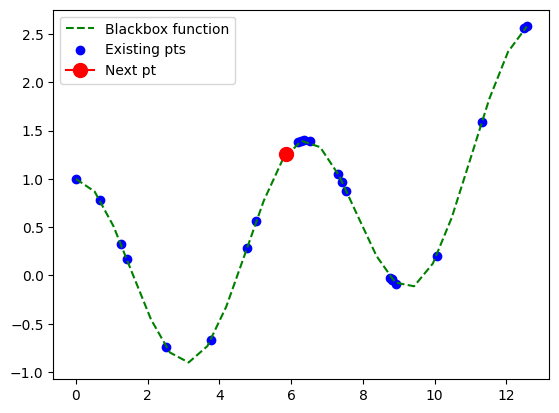

----Iteration13 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [5.71736128]


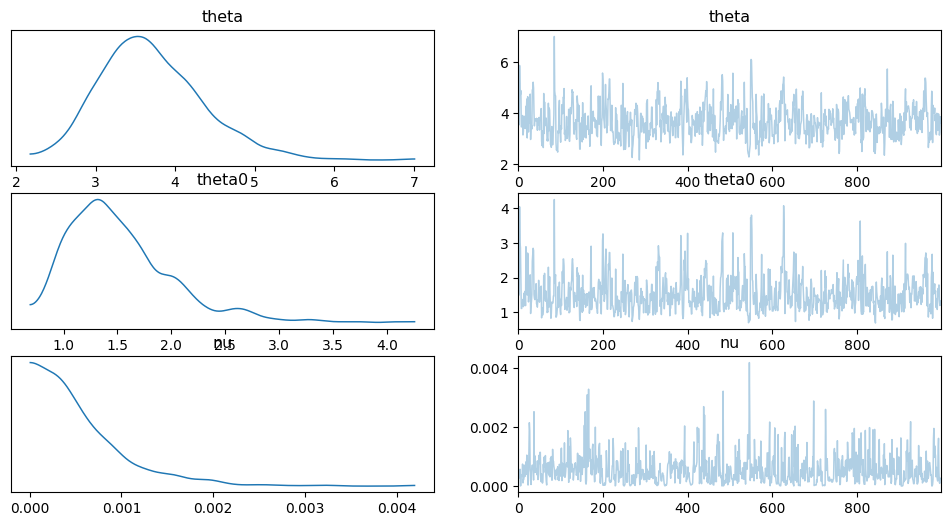

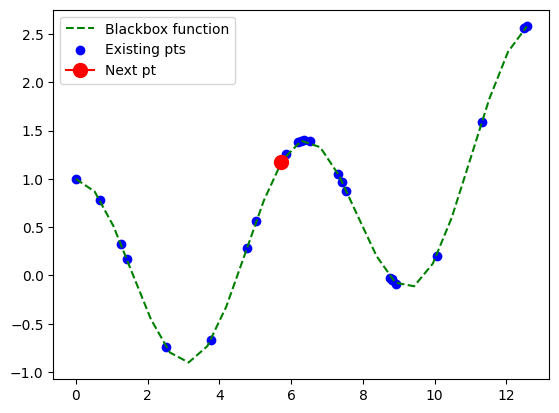

----Iteration14 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [6.00993858]


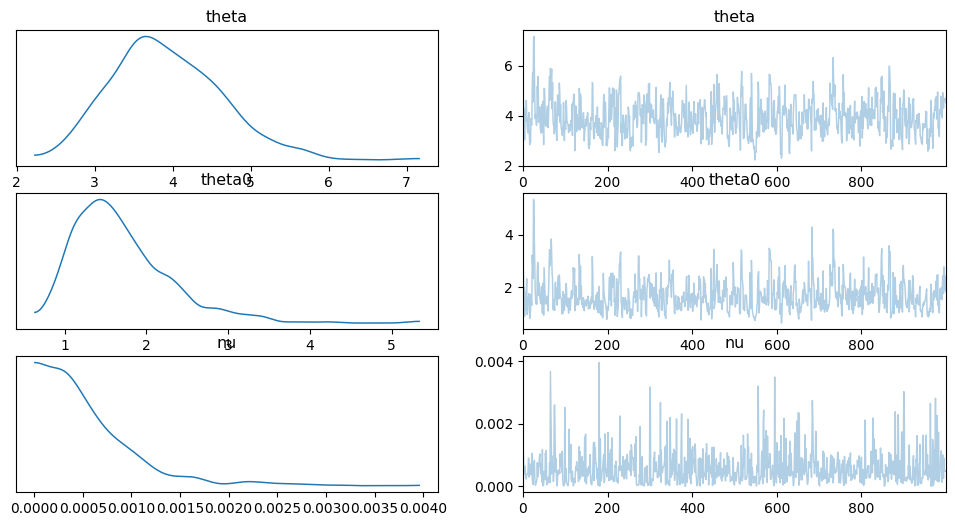

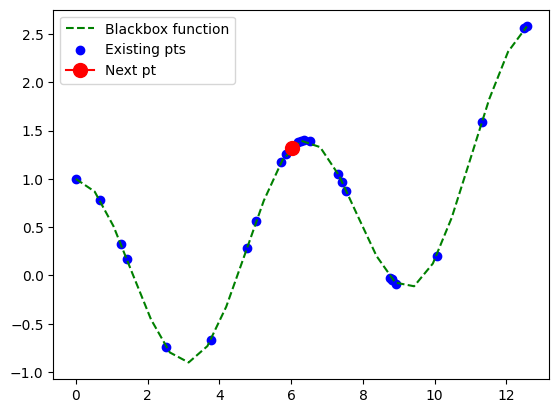

----Iteration15 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [5.48468175]


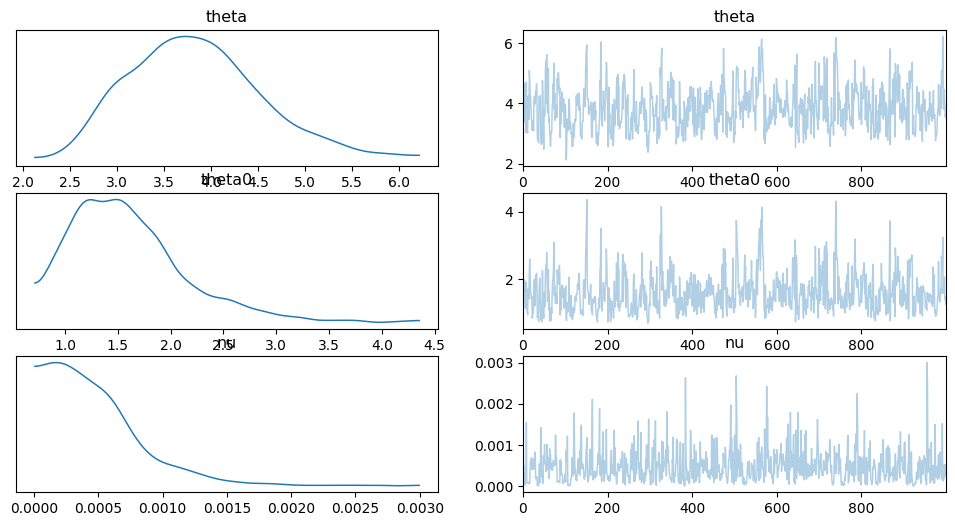

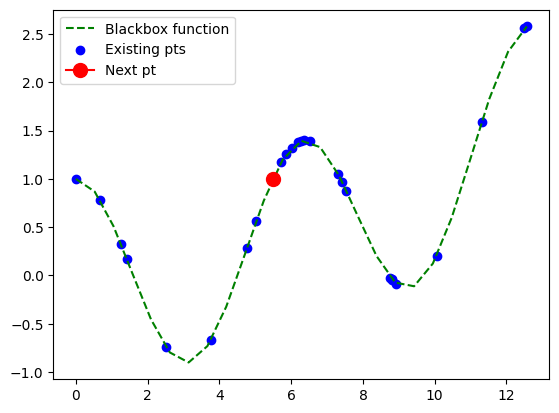

----Iteration16 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [2.55600072]


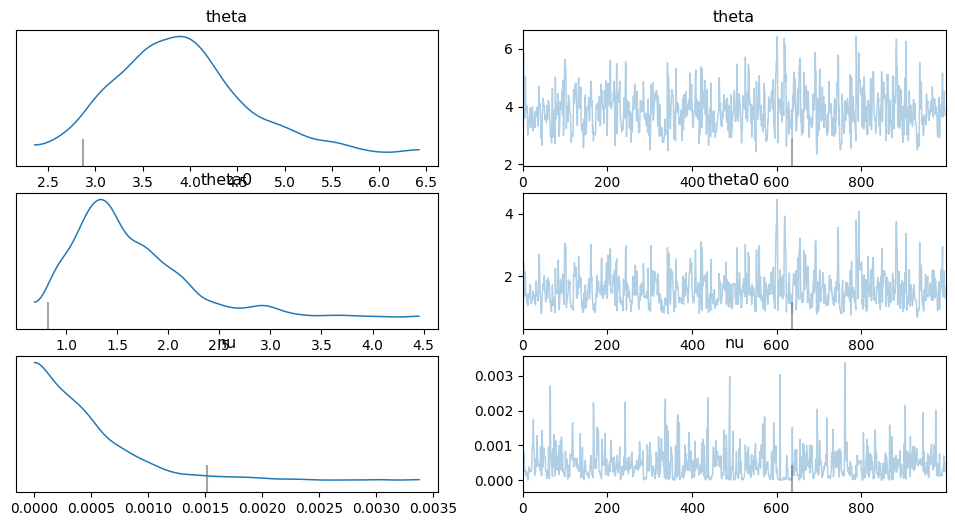

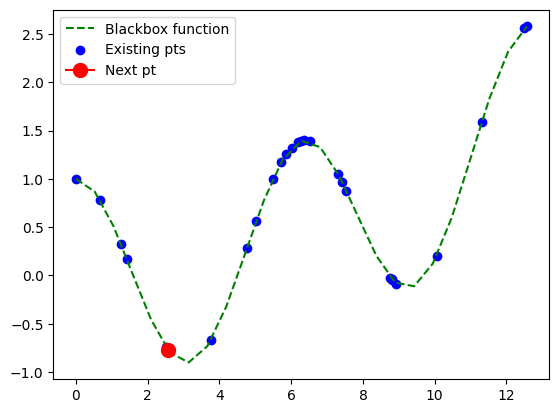

----Iteration17 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [0.34424295]


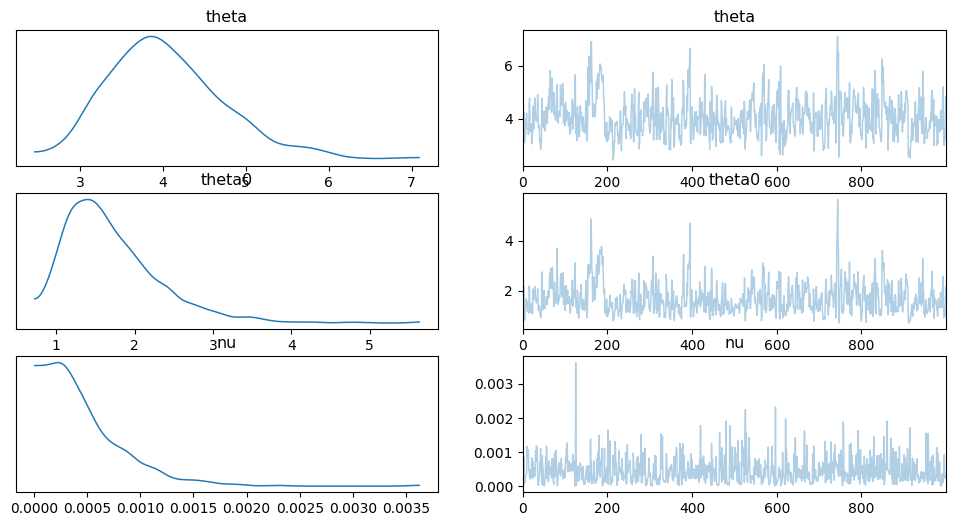

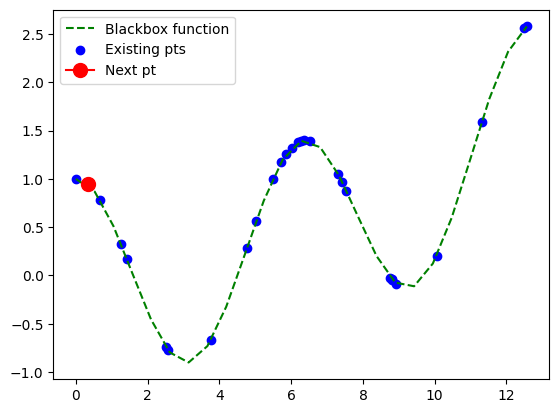

----Iteration18 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [8.93630826]


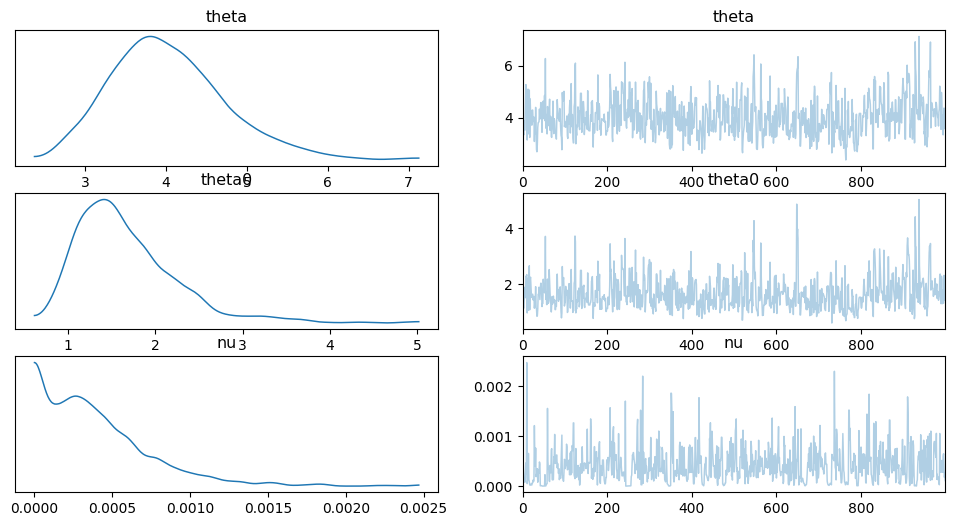

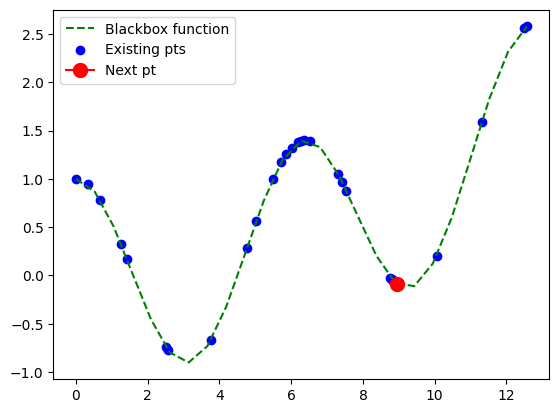

----Iteration19 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [12.07869219]


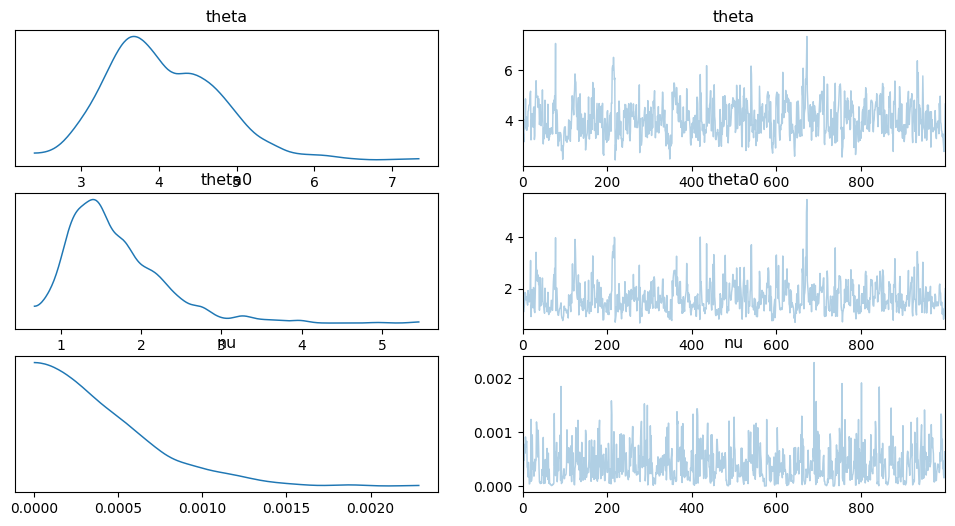

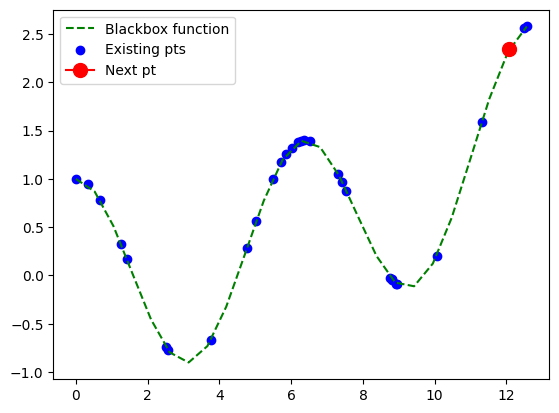

[[ 0.        ]
 [ 1.25663706]
 [ 2.51327412]
 [ 3.76991118]
 [ 5.02654825]
 [ 6.28318531]
 [ 7.53982237]
 [ 8.79645943]
 [10.05309649]
 [11.30973355]
 [12.56637061]]
----Iteration0 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [7.17967245]


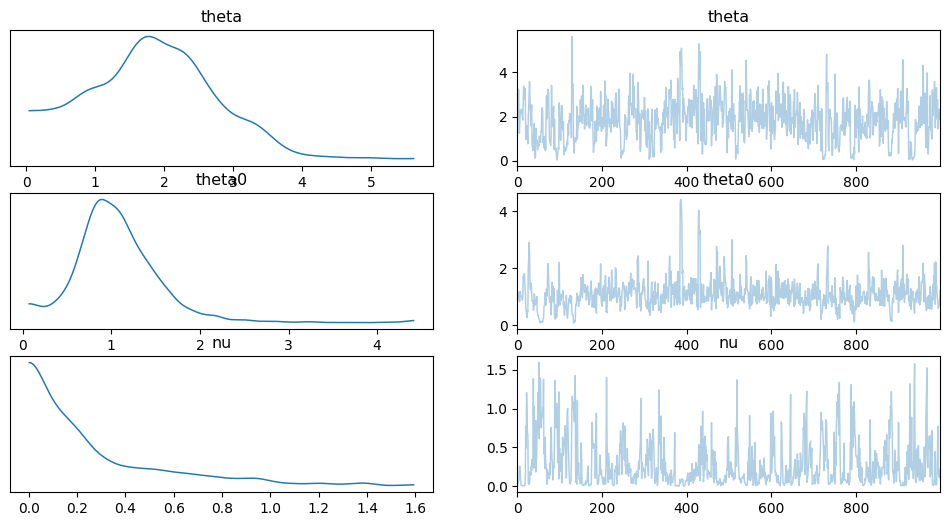

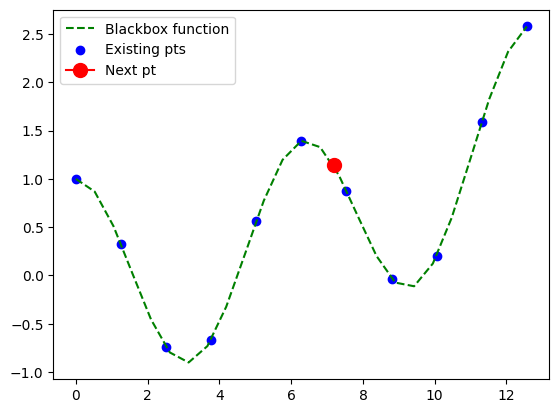

----Iteration1 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.09630908]


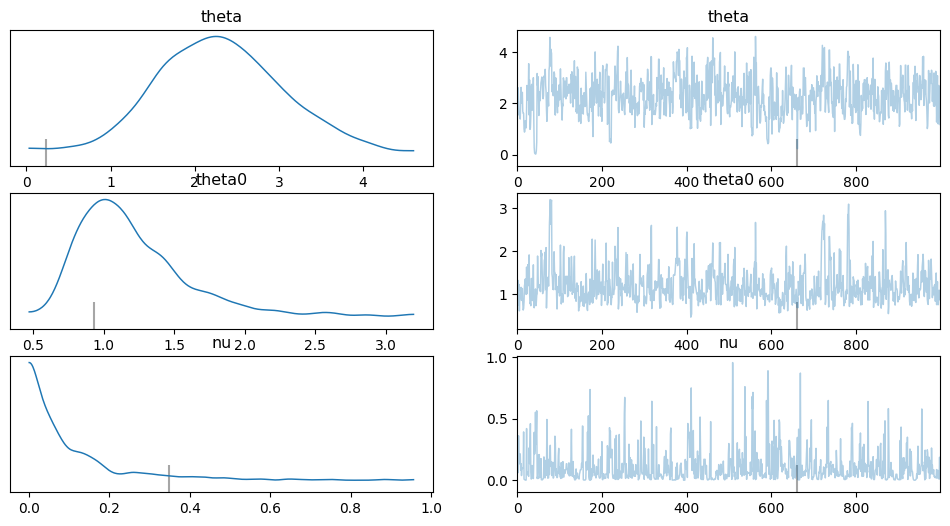

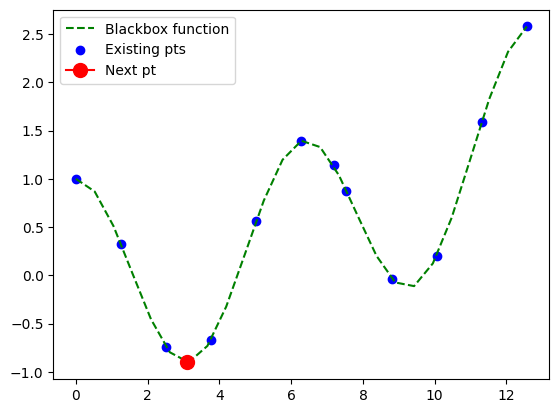

----Iteration2 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.28656225]


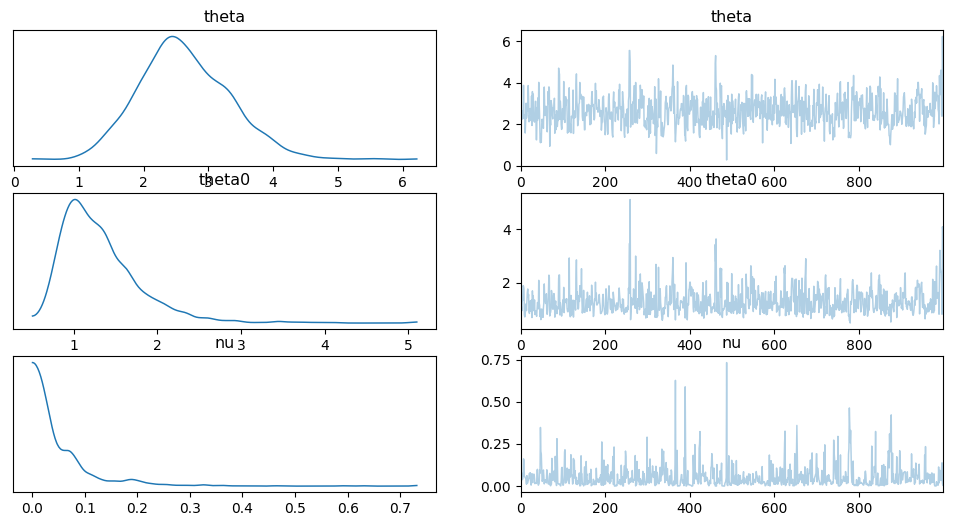

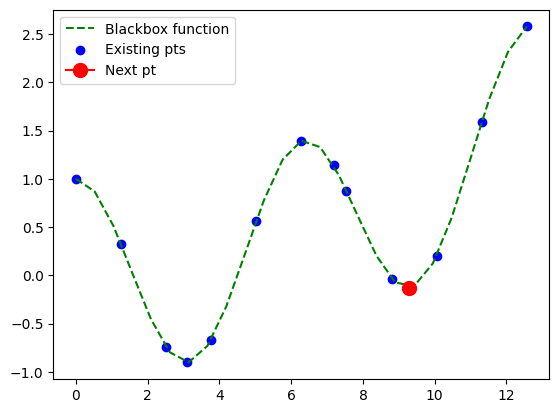

----Iteration3 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.02294096]


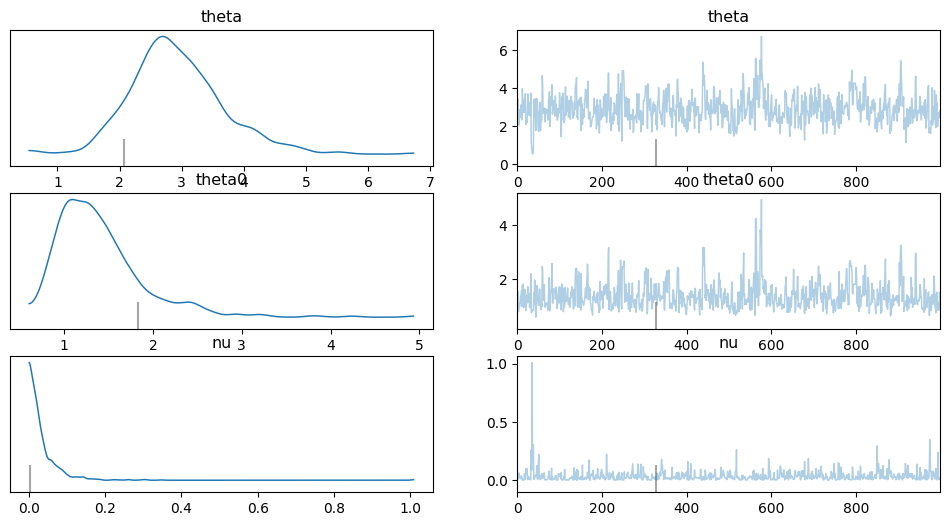

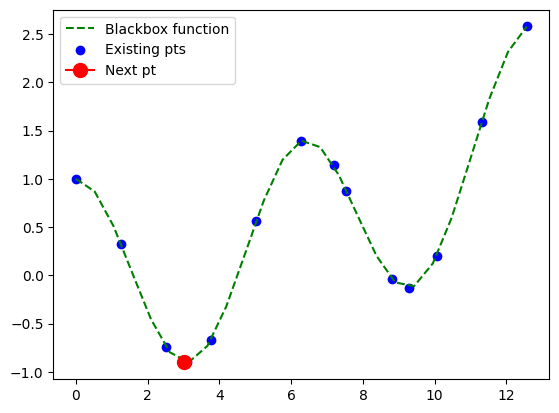

----Iteration4 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.10612956]


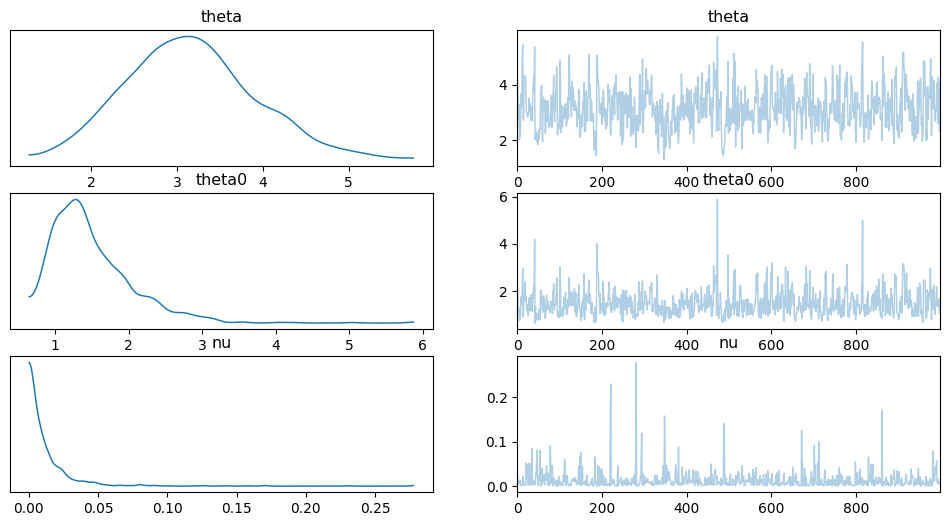

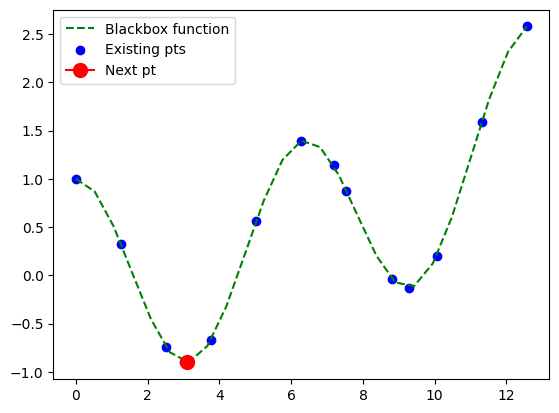

----Iteration5 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.08194456]


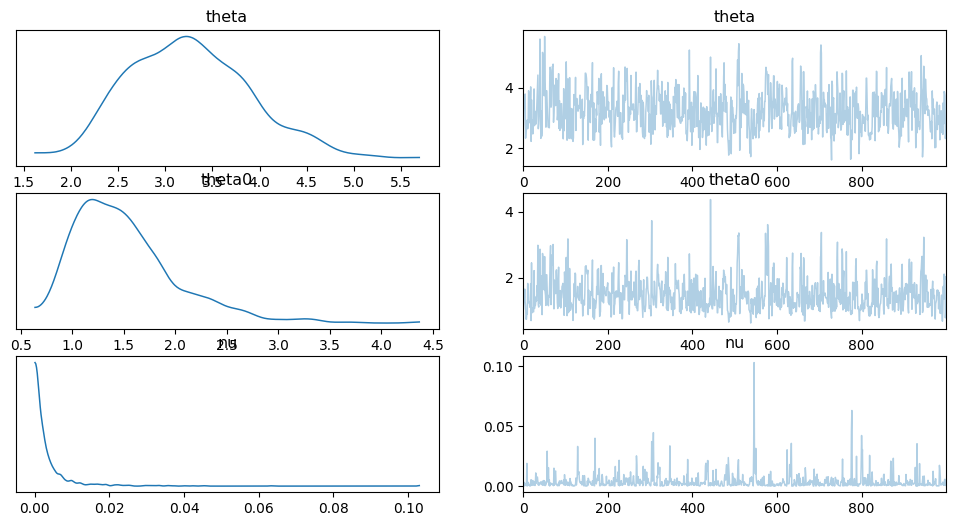

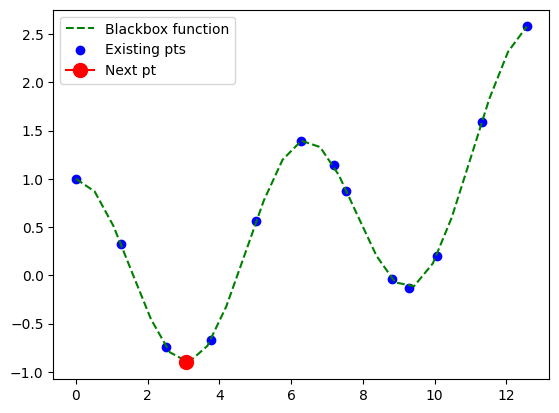

----Iteration6 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.07940693]


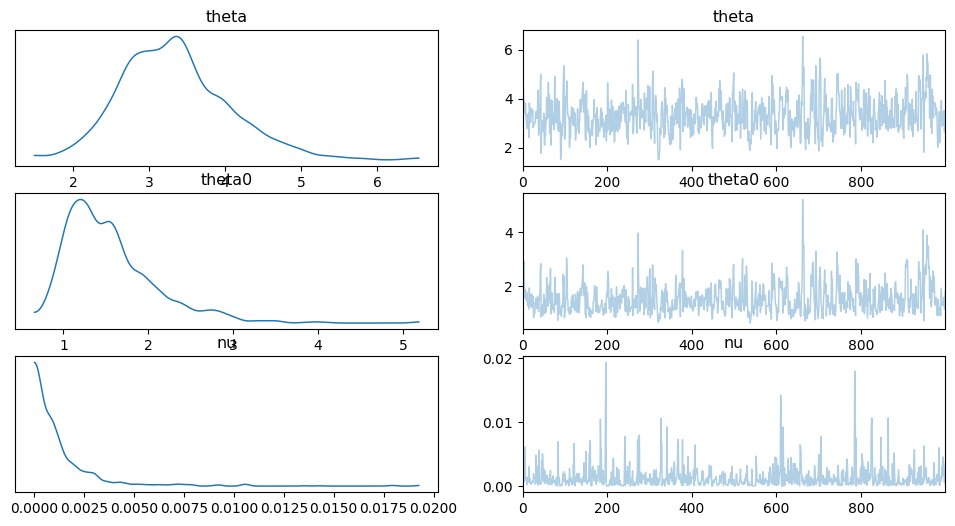

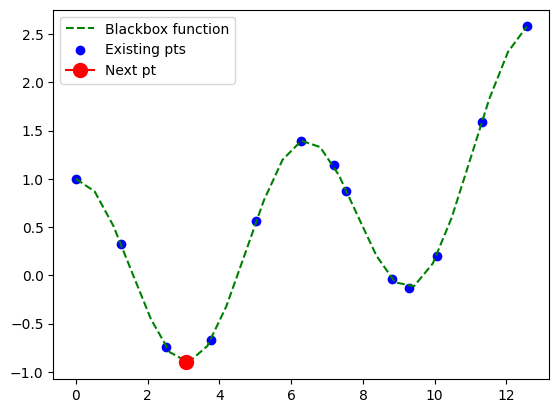

----Iteration7 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.08046692]


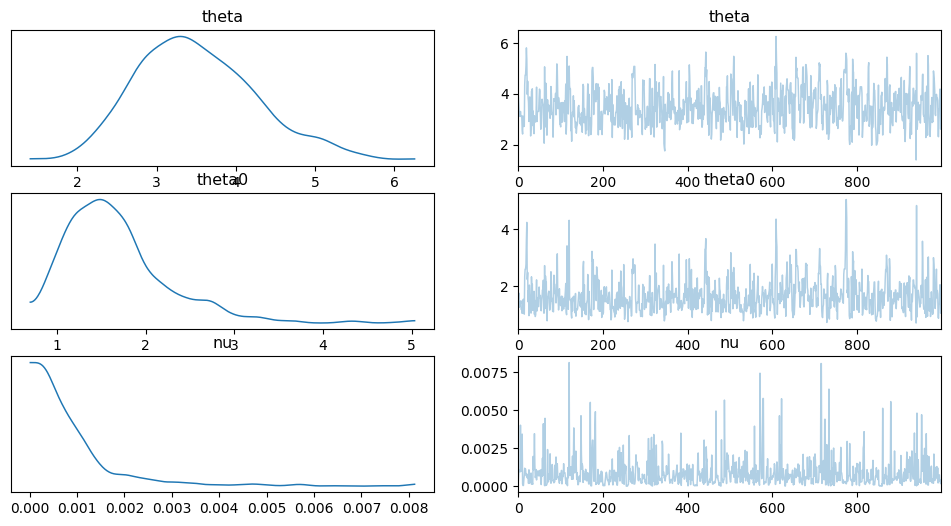

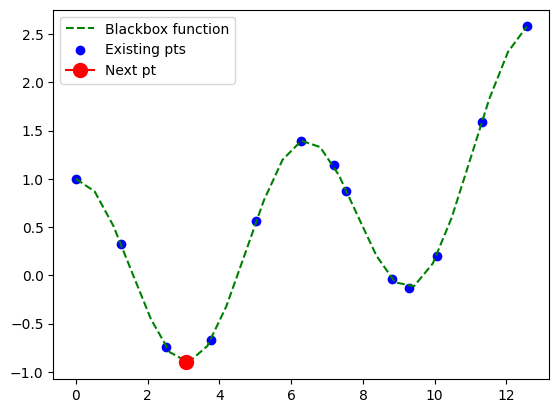

----Iteration8 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.31274234]


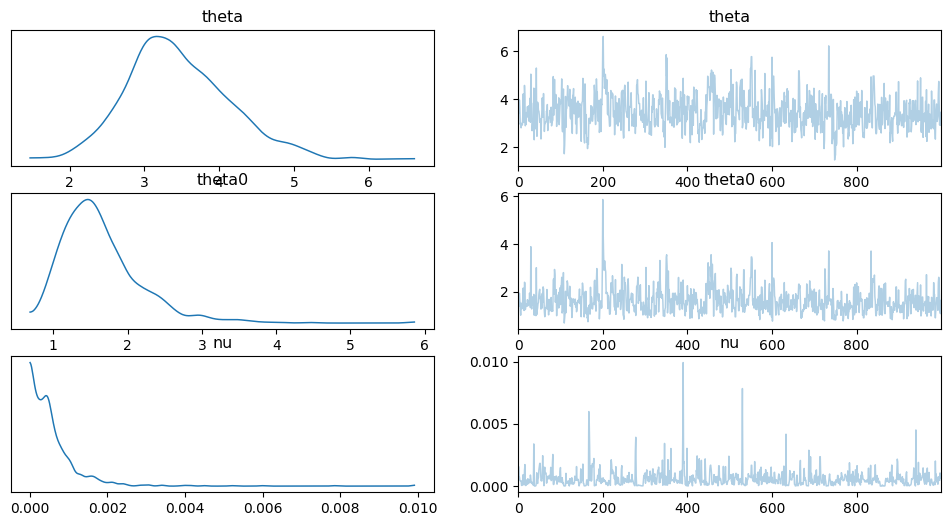

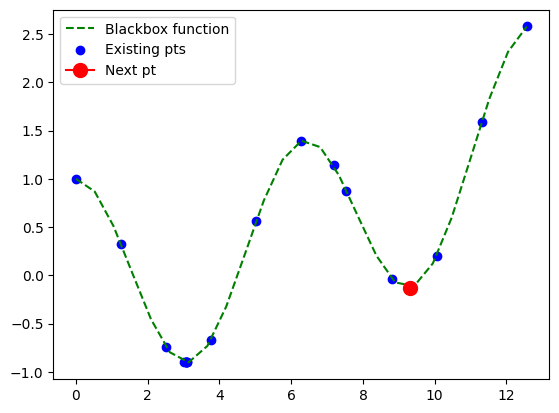

----Iteration9 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.08000241]


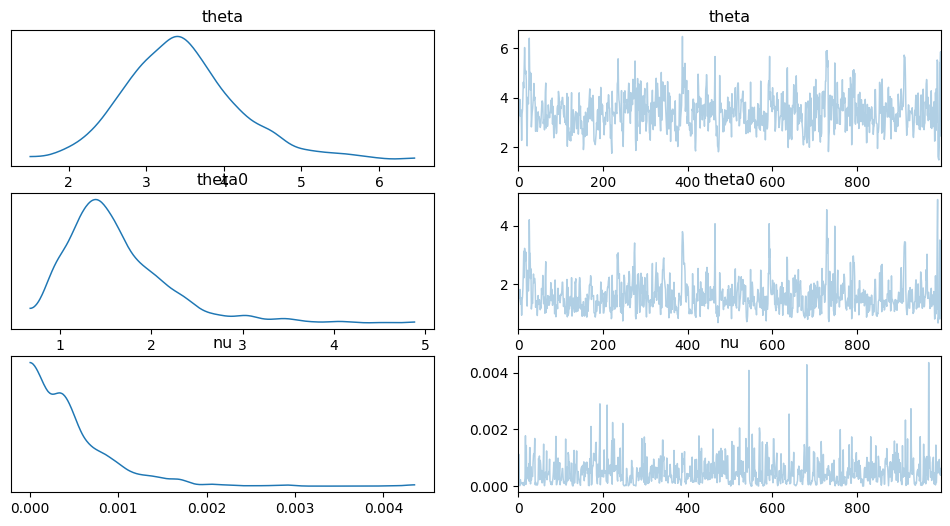

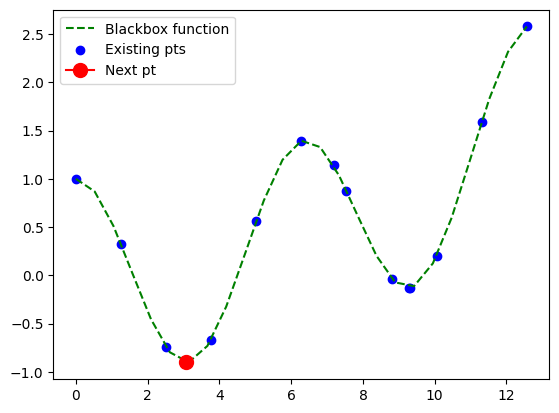

----Iteration10 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.20733548]


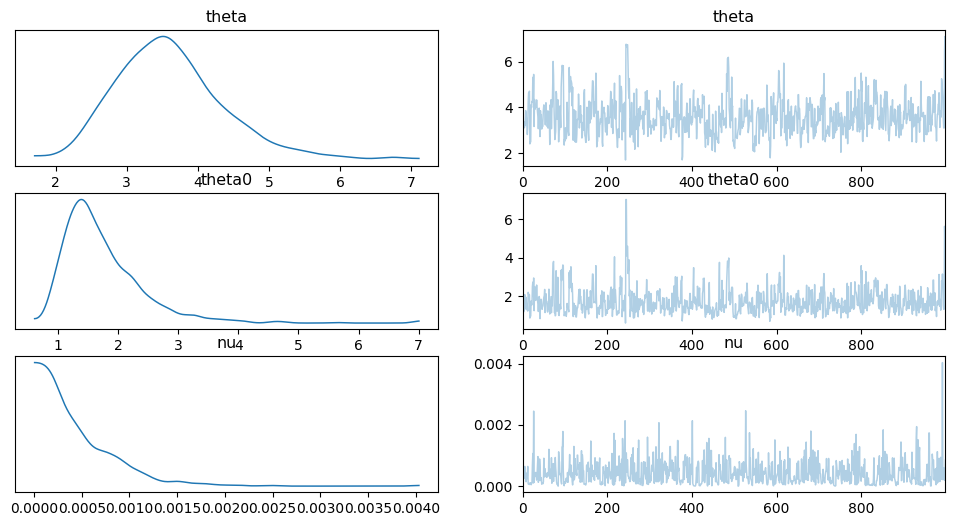

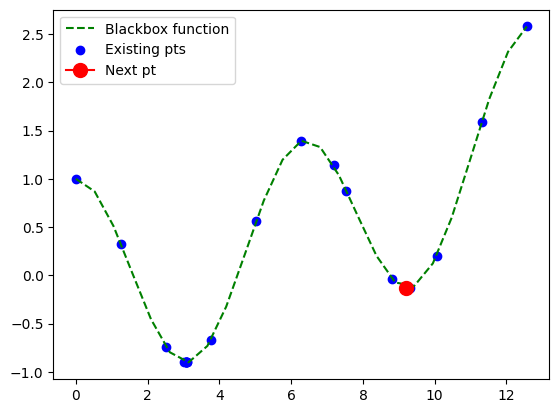

----Iteration11 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.07980056]


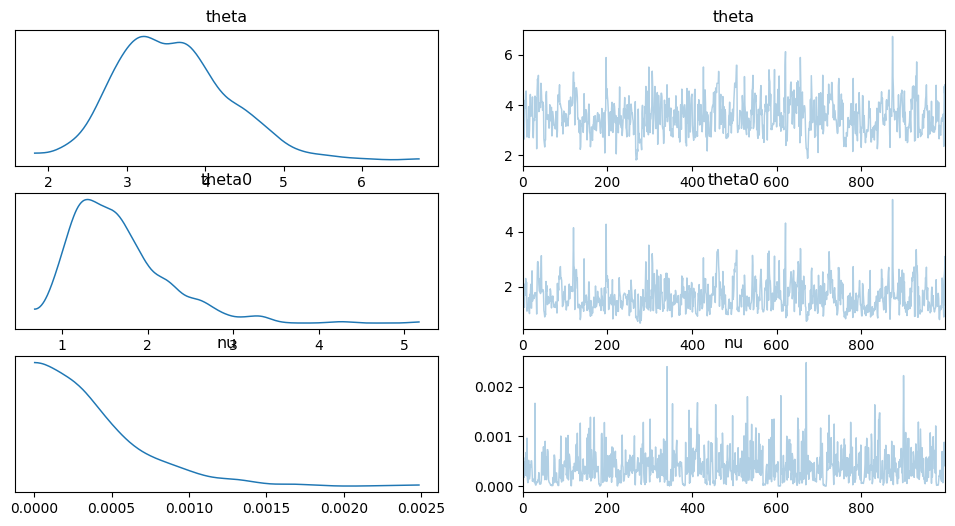

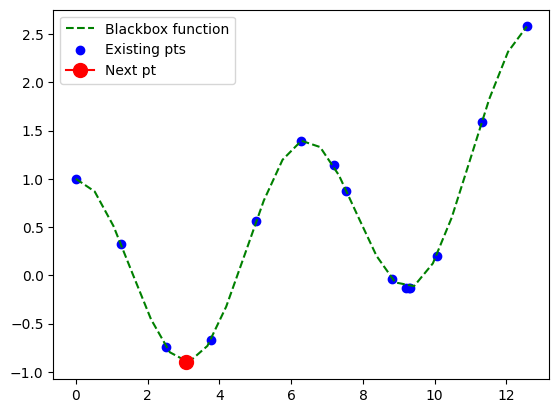

----Iteration12 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.23261487]


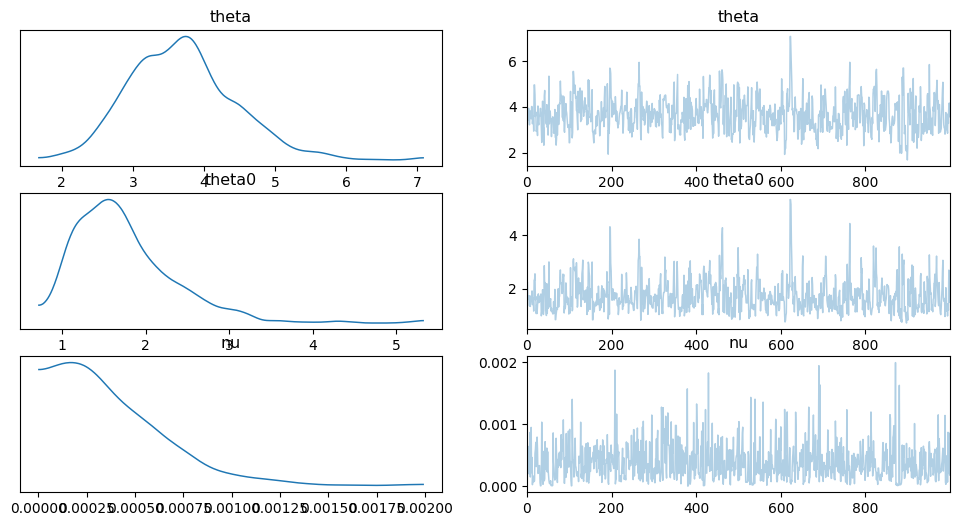

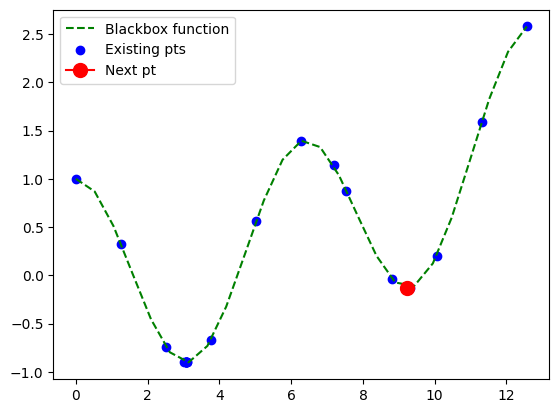

----Iteration13 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.07956169]


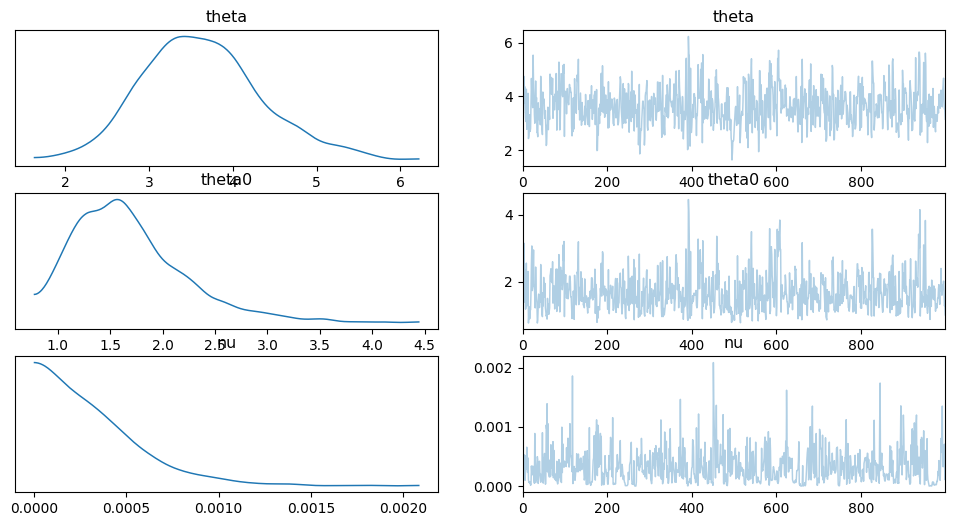

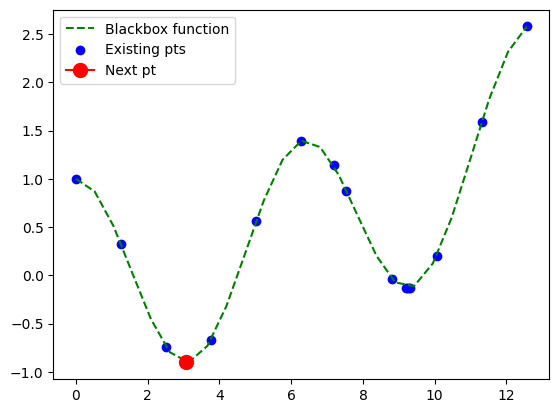

----Iteration14 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.23443252]


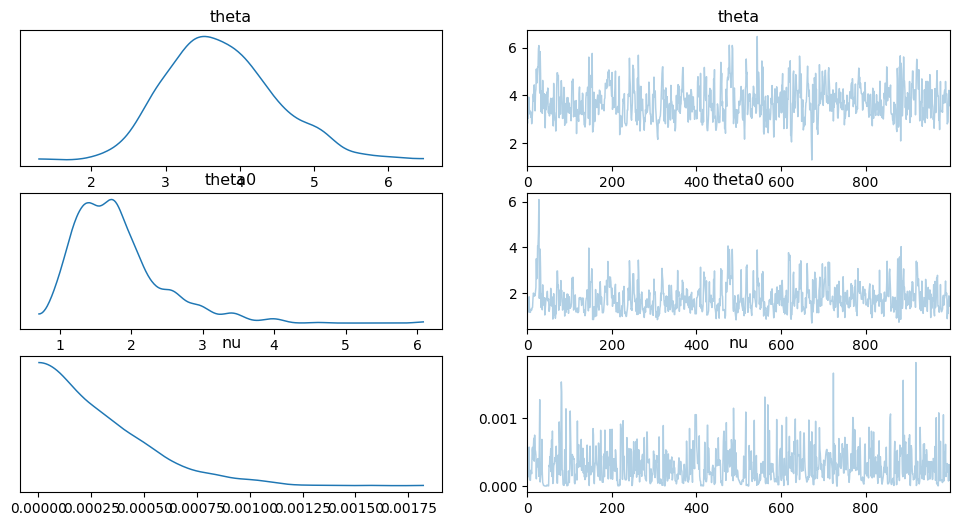

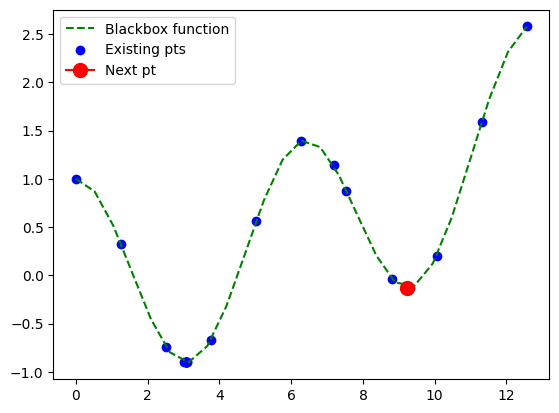

----Iteration15 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.0805135]


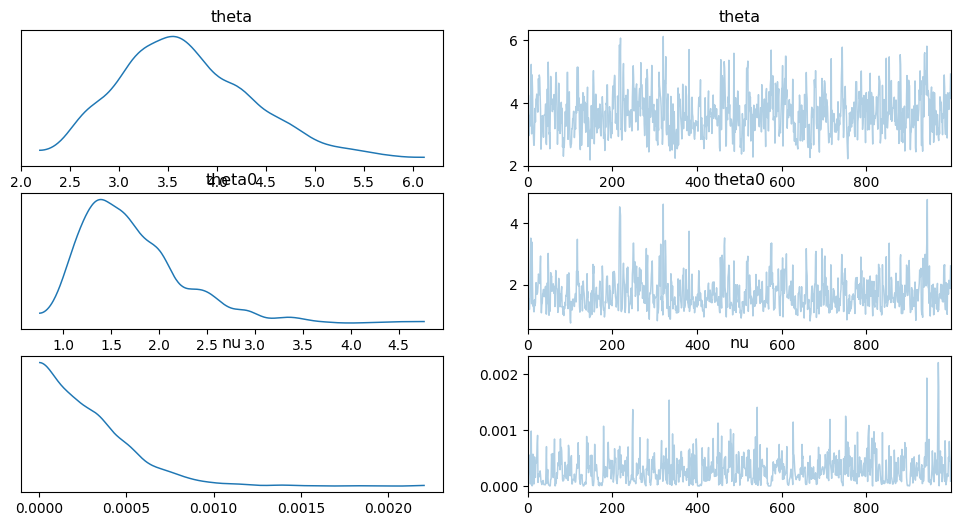

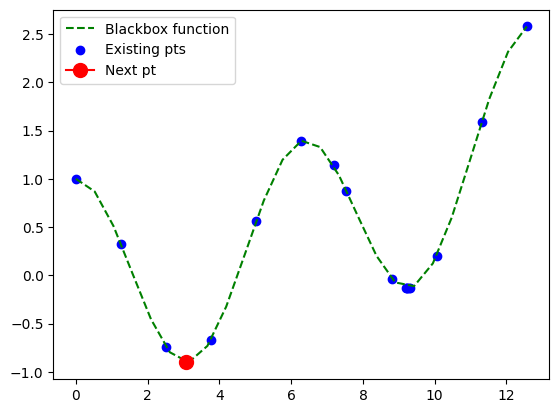

----Iteration16 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.08008701]


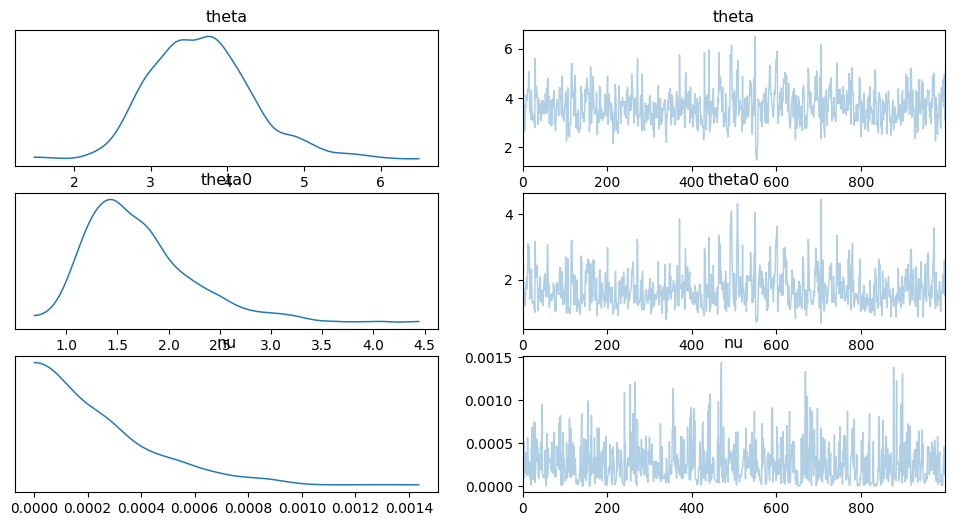

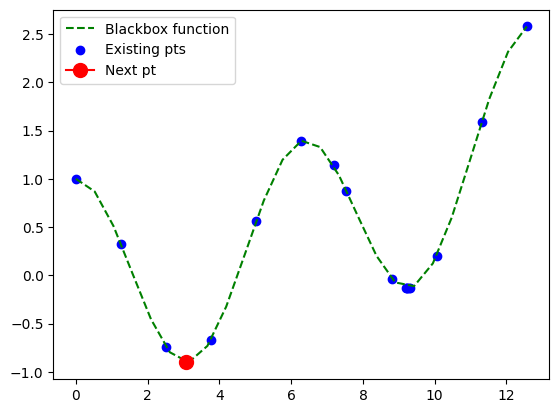

----Iteration17 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.23568287]


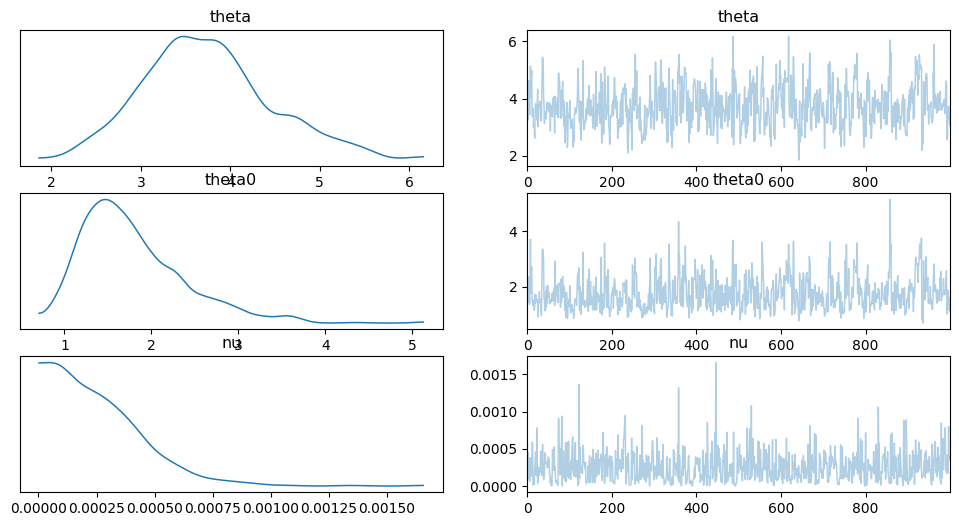

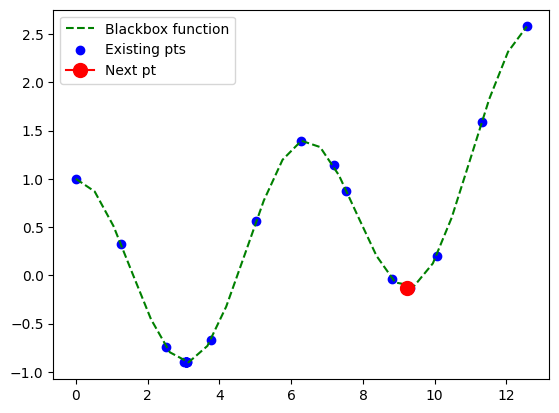

----Iteration18 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [3.07946066]


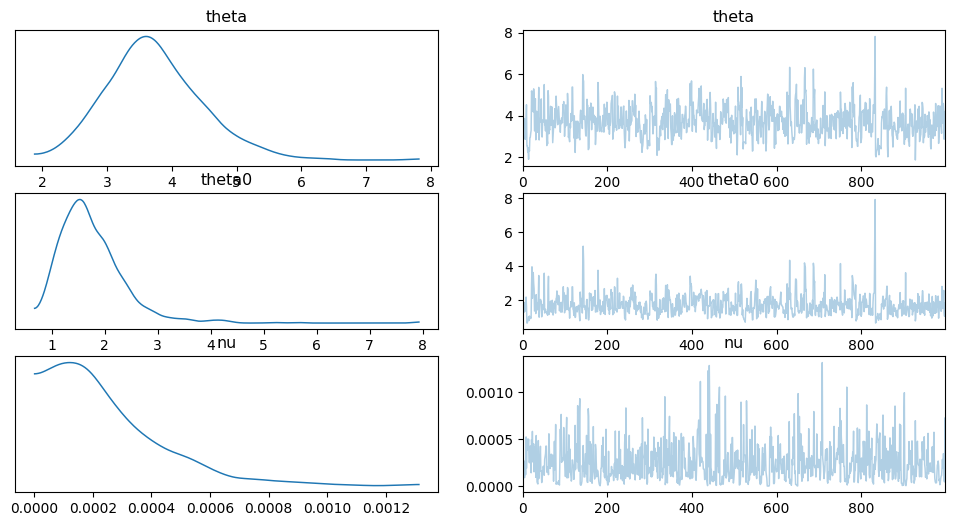

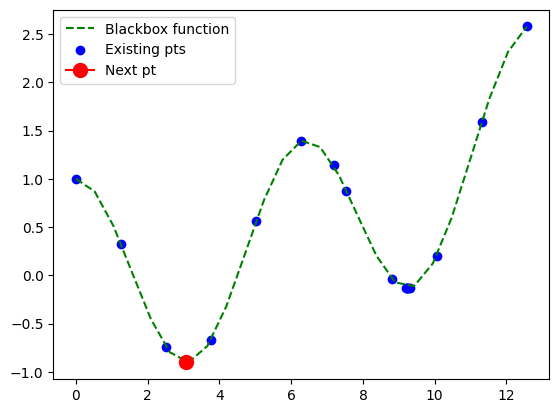

----Iteration19 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [9.23598427]


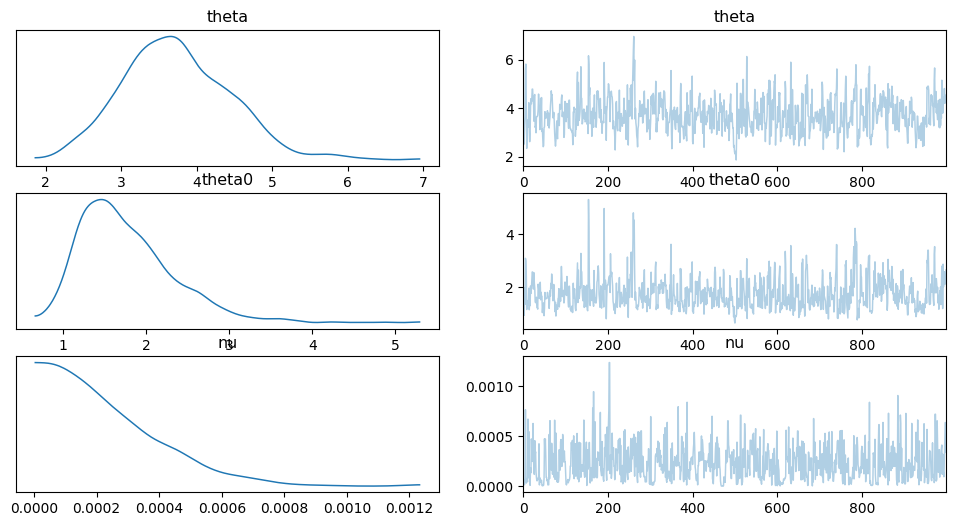

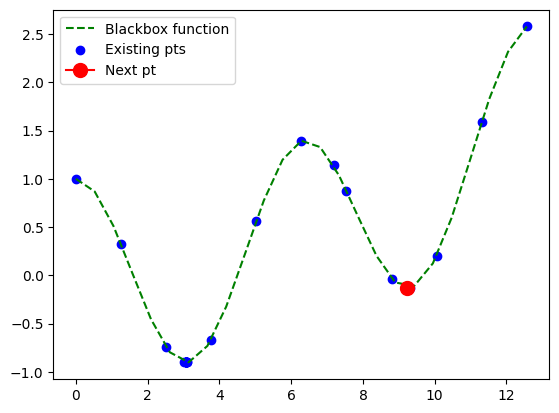

[[ 0.        ]
 [ 1.25663706]
 [ 2.51327412]
 [ 3.76991118]
 [ 5.02654825]
 [ 6.28318531]
 [ 7.53982237]
 [ 8.79645943]
 [10.05309649]
 [11.30973355]
 [12.56637061]]
----Iteration0 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.2316216]


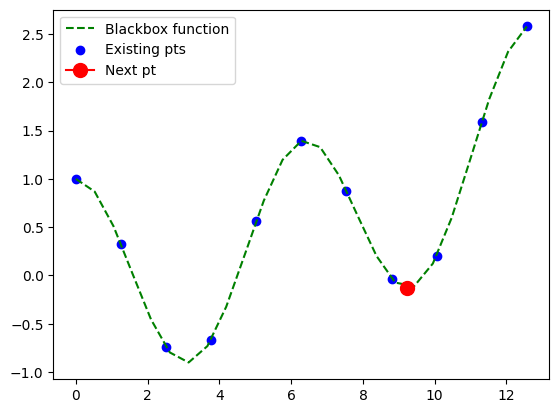

----Iteration1 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [2.52625705]


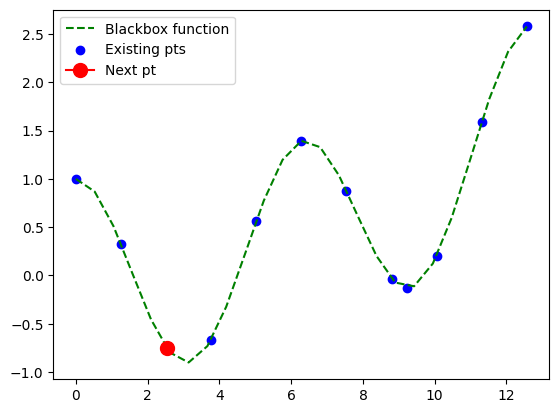

----Iteration2 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [2.82971725]


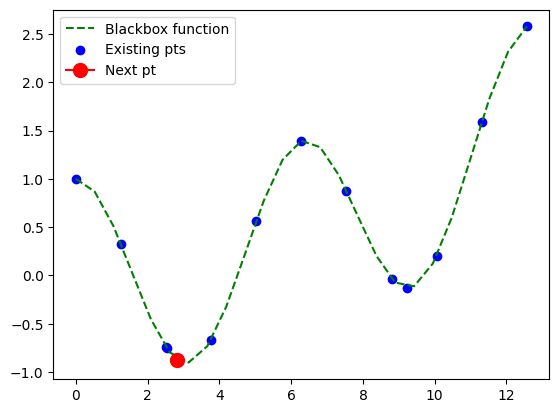

----Iteration3 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [2.87844122]


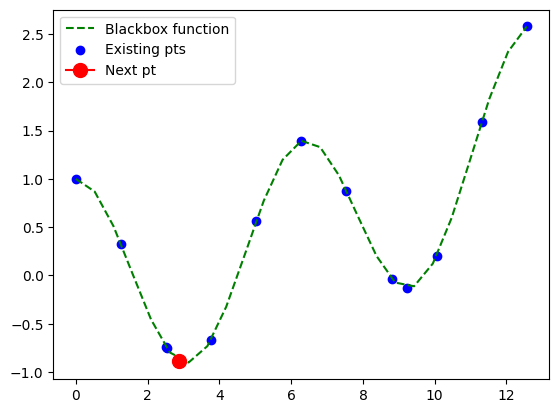

----Iteration4 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


/usr/local/lib/python3.10/dist-packages/pytensor/link/vm.py:1172: UserWarning: Detected reference count inconsistency after CVM construction
  warnings.warn(


x_next = [2.9795771]


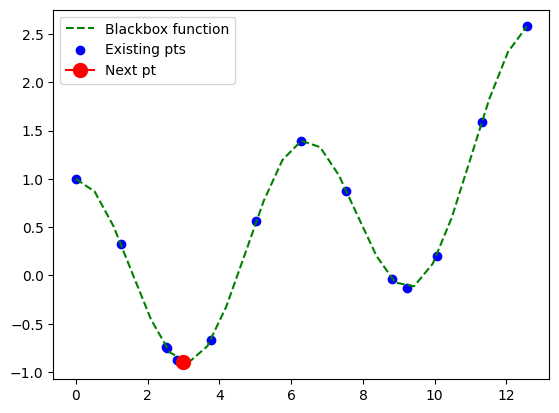

----Iteration5 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.02454744]


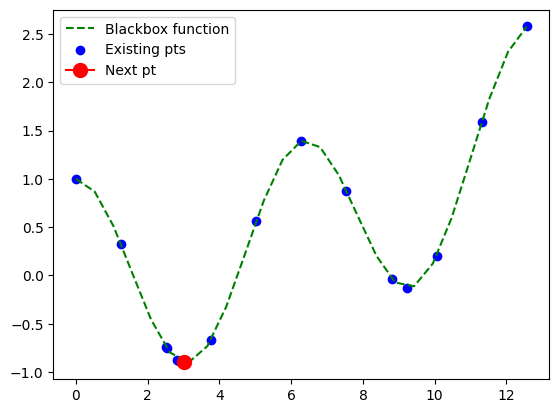

----Iteration6 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.05177989]


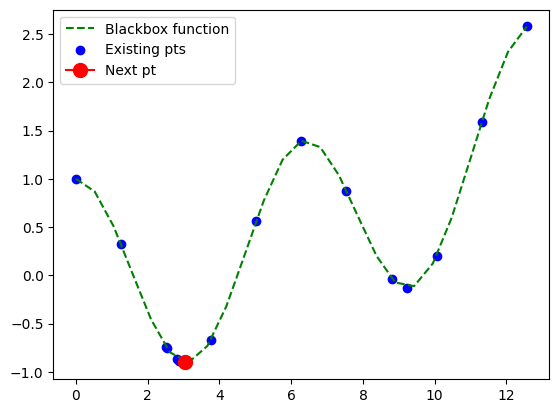

----Iteration7 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.06451676]


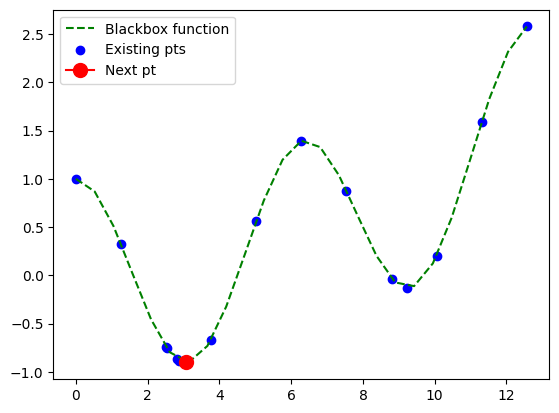

----Iteration8 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.24008899]


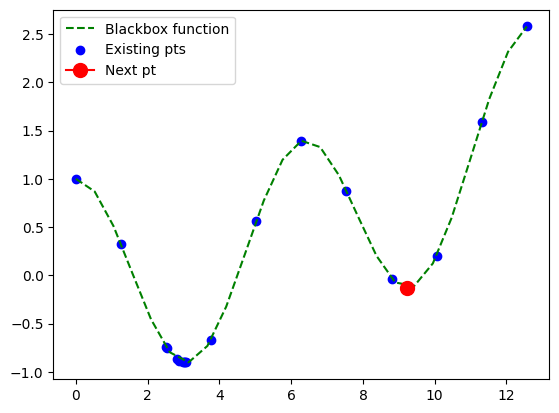

----Iteration9 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.2399932]


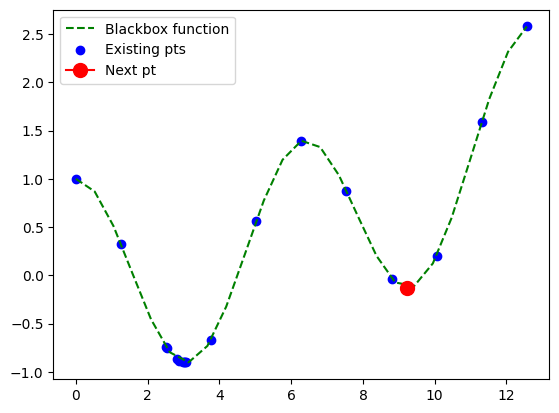

----Iteration10 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.06936932]


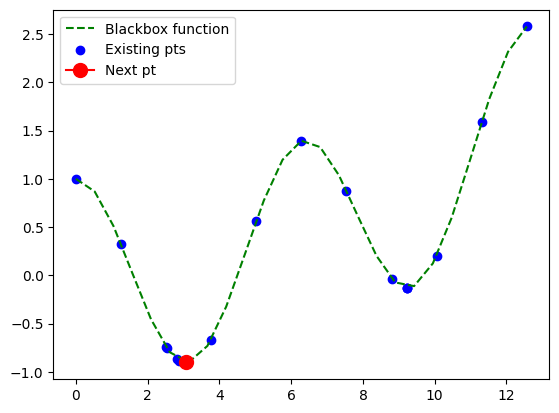

----Iteration11 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.07135467]


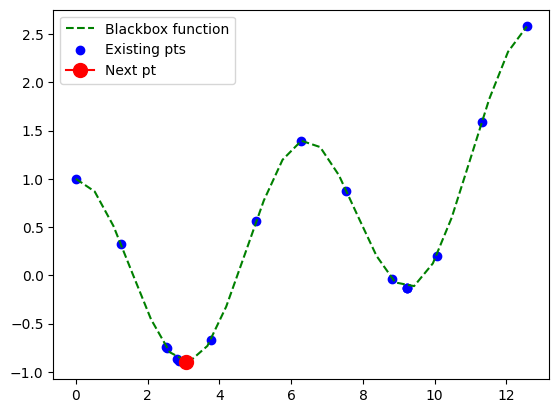

----Iteration12 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.07241827]


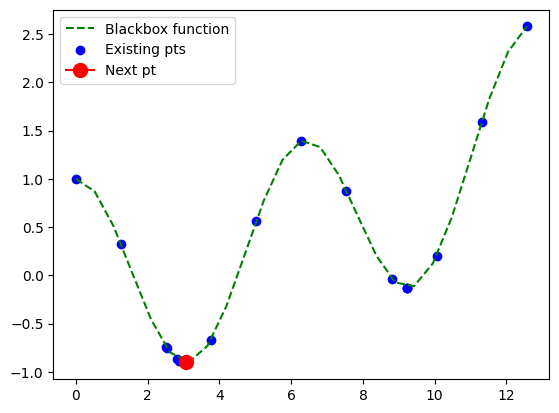

----Iteration13 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.24003968]


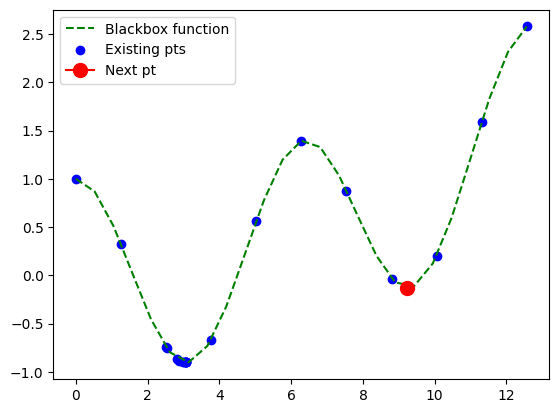

----Iteration14 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.07317396]


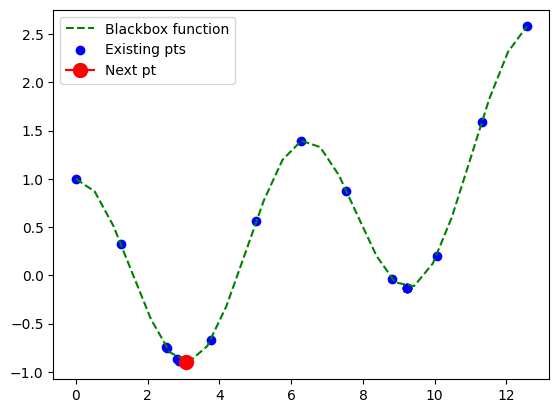

----Iteration15 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.24003647]


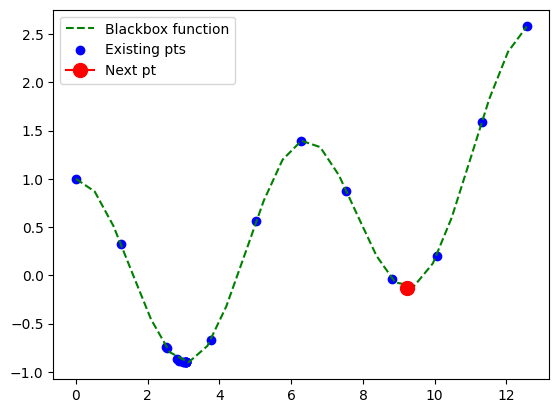

----Iteration16 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.2400293]


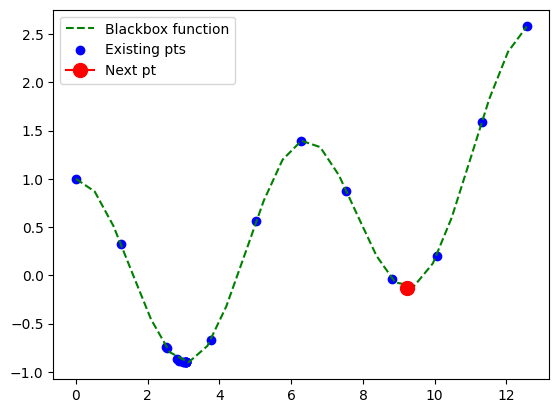

----Iteration17 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.24002793]


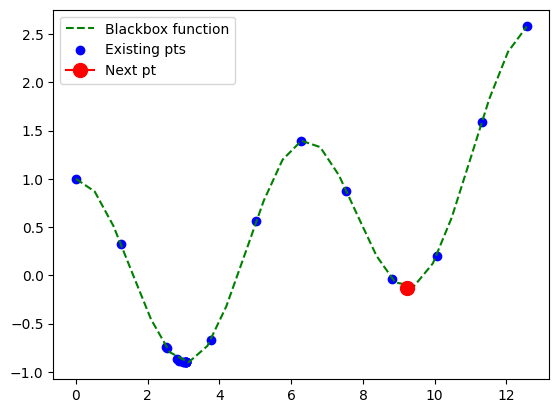

----Iteration18 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.2400182]


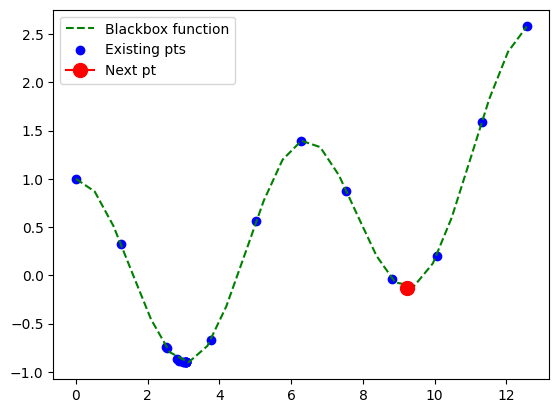

----Iteration19 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.07367331]


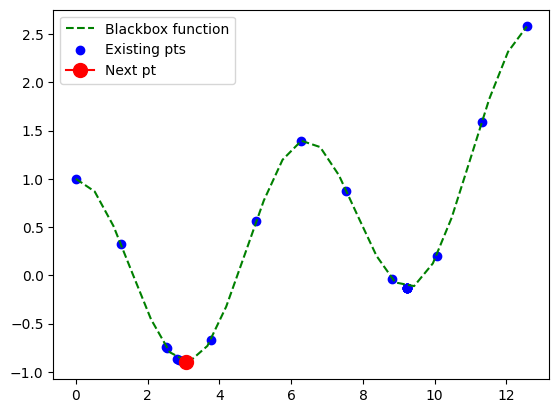

[[ 0.        ]
 [ 1.25663706]
 [ 2.51327412]
 [ 3.76991118]
 [ 5.02654825]
 [ 6.28318531]
 [ 7.53982237]
 [ 8.79645943]
 [10.05309649]
 [11.30973355]
 [12.56637061]]
----Iteration0 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [0.94822958]


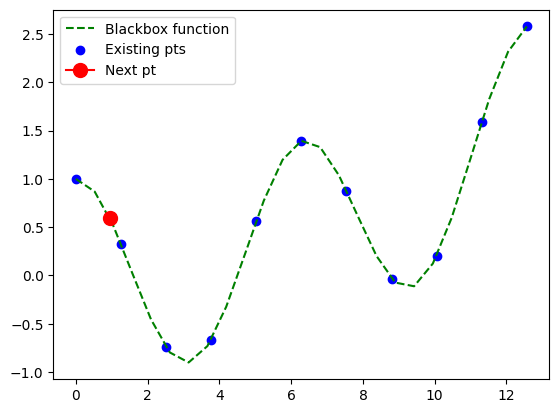

----Iteration1 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [7.61567868]


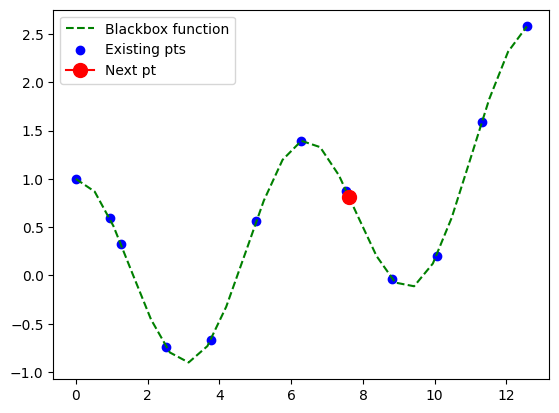

----Iteration2 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [5.69501343]


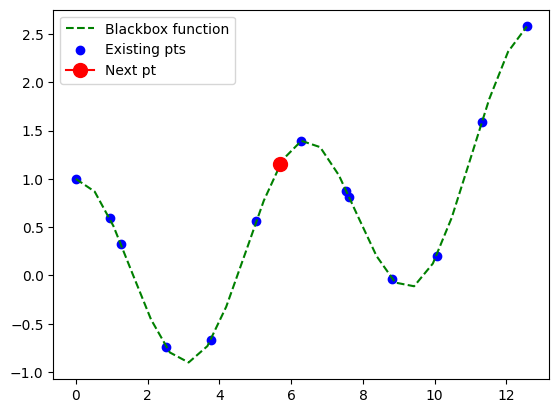

----Iteration3 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [0.21803141]


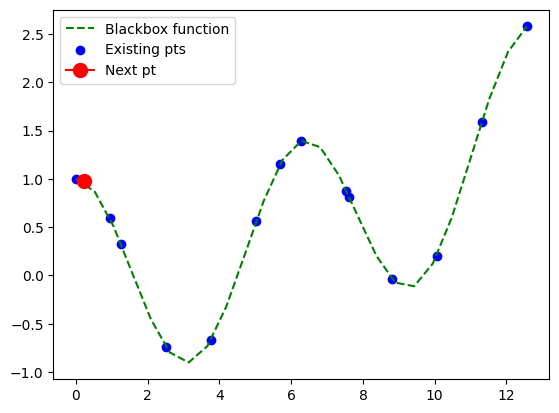

----Iteration4 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [0.76310587]


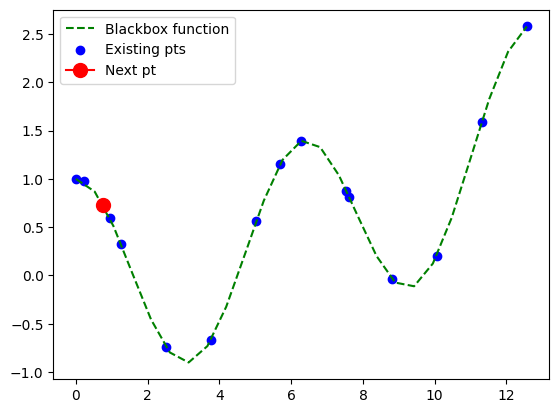

----Iteration5 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [8.29339997]


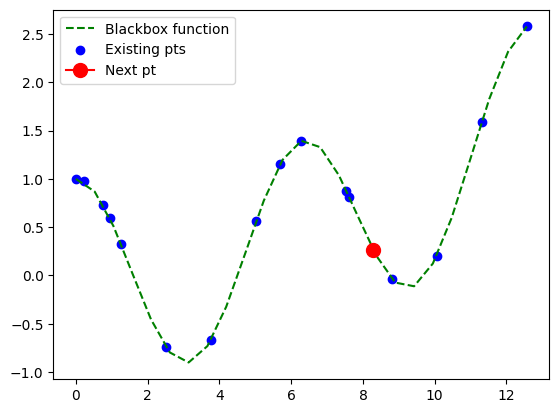

----Iteration6 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [8.40260854]


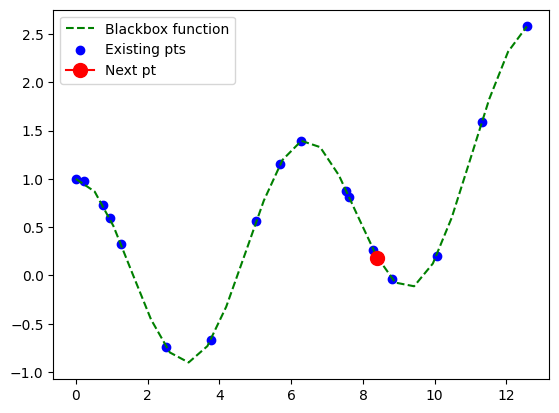

----Iteration7 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [2.0852499]


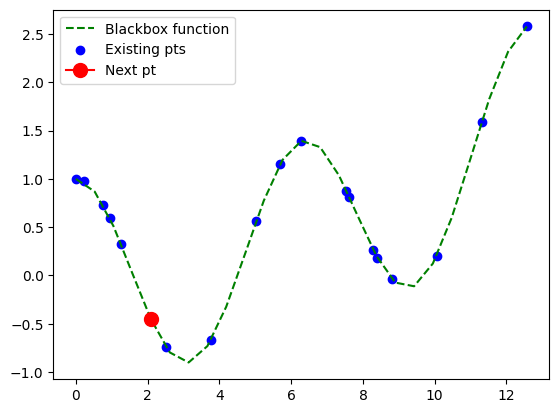

----Iteration8 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [2.4828892]


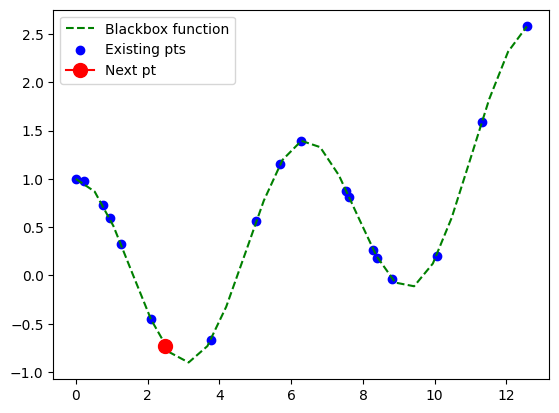

----Iteration9 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [6.27951624]


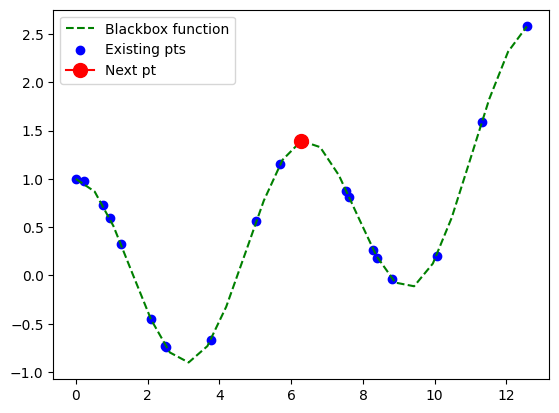

----Iteration10 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [1.52731957]


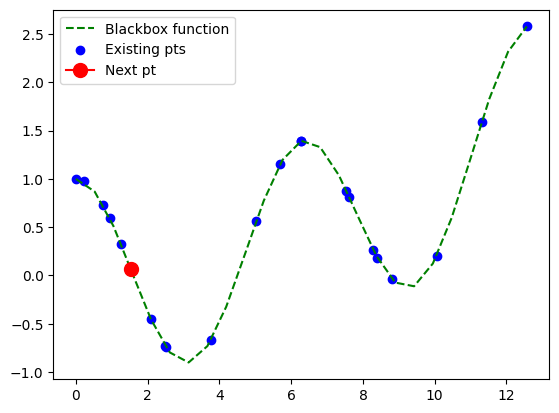

----Iteration11 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [1.69400182]


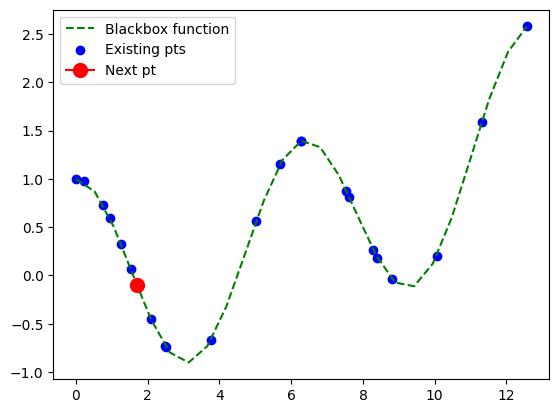

----Iteration12 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [5.89562798]


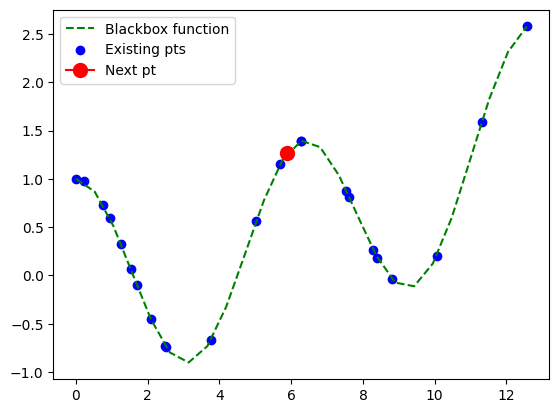

----Iteration13 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [7.44675297]


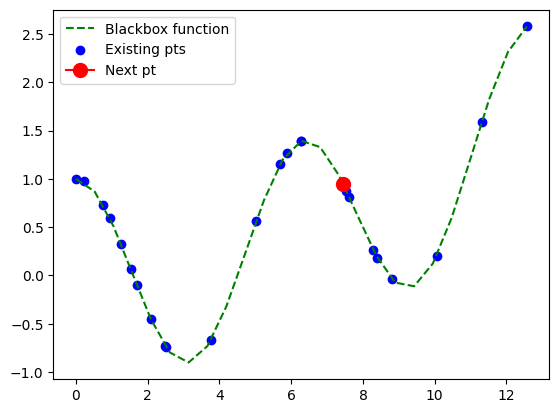

----Iteration14 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [7.95397548]


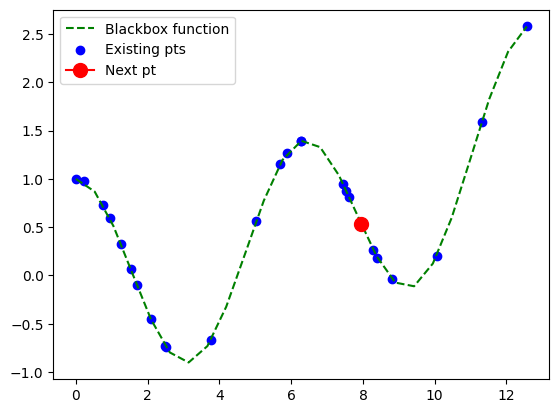

----Iteration15 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [1.05266235]


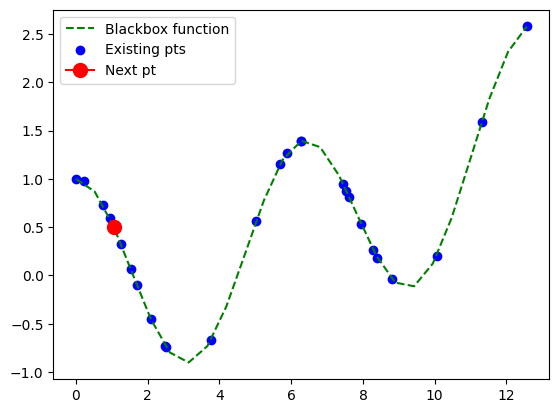

----Iteration16 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [0.72104969]


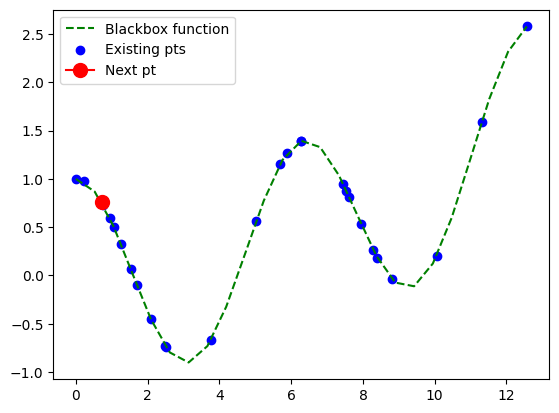

----Iteration17 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [5.63412671]


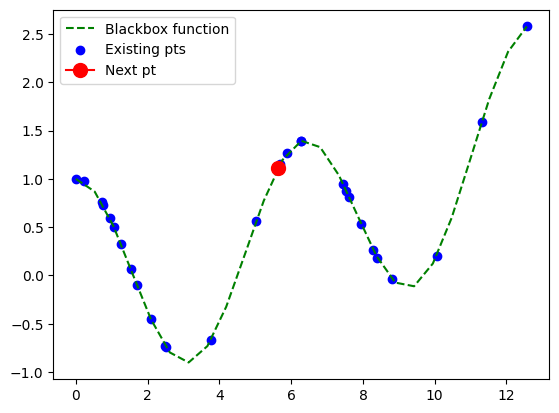

----Iteration18 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [8.50149966]


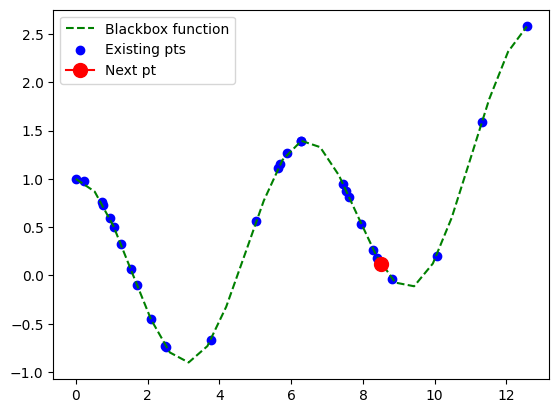

----Iteration19 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [10.53057681]


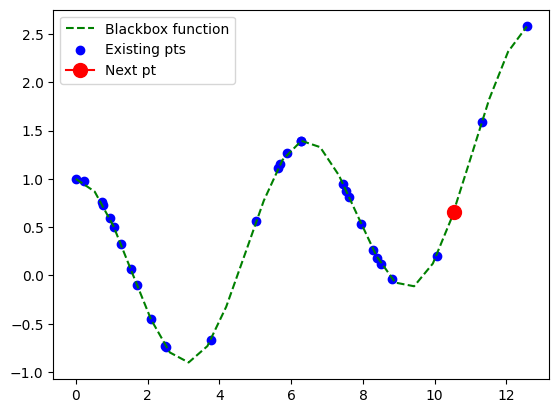

[[ 0.        ]
 [ 1.25663706]
 [ 2.51327412]
 [ 3.76991118]
 [ 5.02654825]
 [ 6.28318531]
 [ 7.53982237]
 [ 8.79645943]
 [10.05309649]
 [11.30973355]
 [12.56637061]]
----Iteration0 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.30677496]


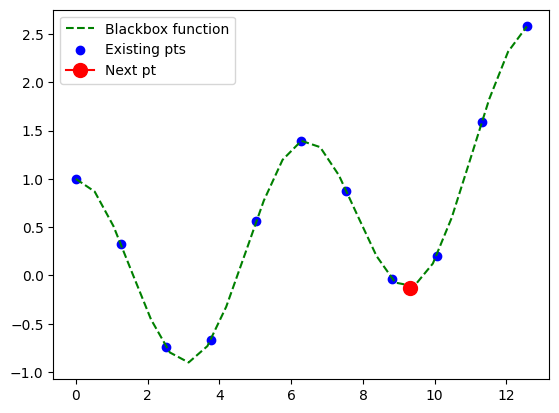

----Iteration1 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.09703427]


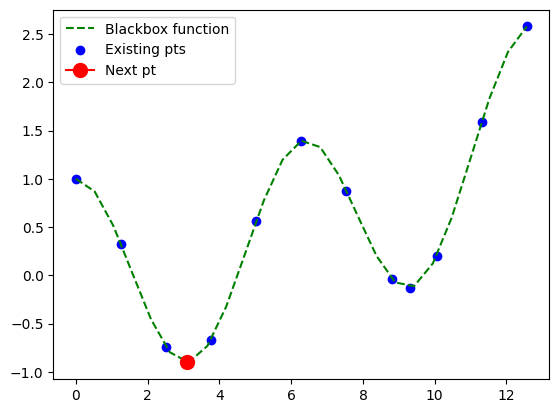

----Iteration2 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.00820443]


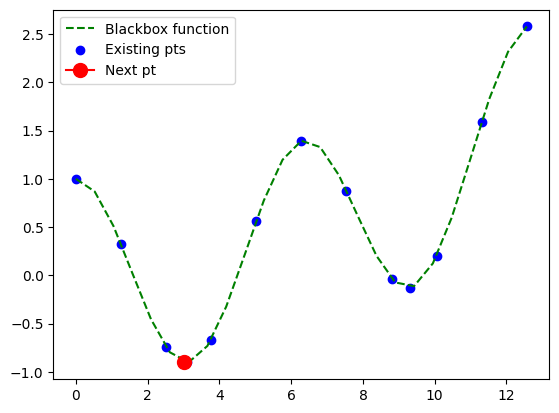

----Iteration3 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.19332745]


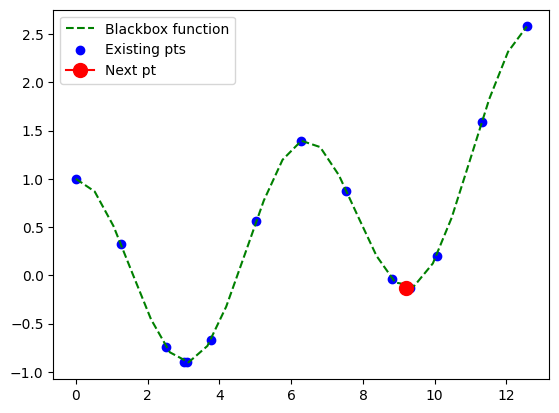

----Iteration4 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.08837013]


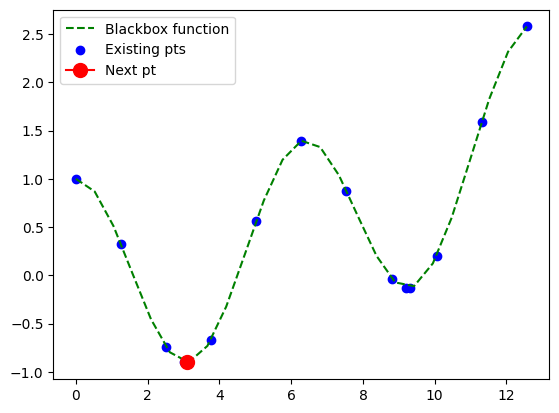

----Iteration5 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.23789575]


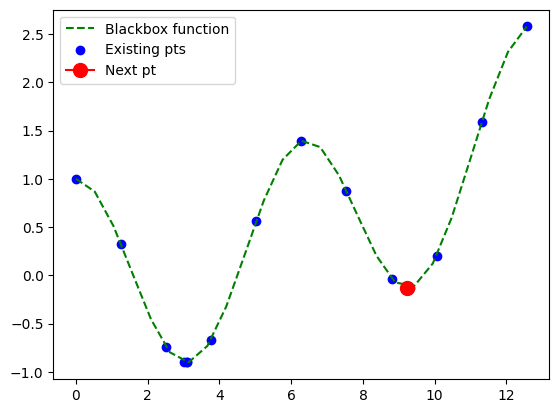

----Iteration6 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.08510216]


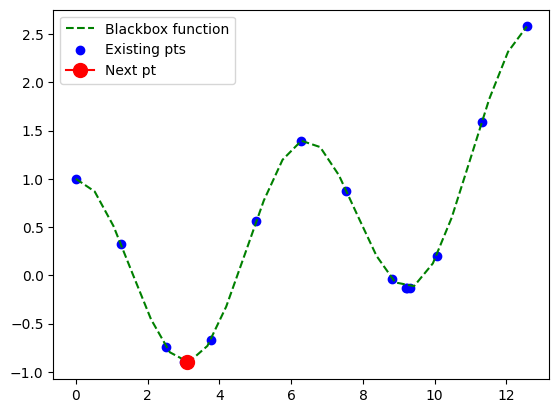

----Iteration7 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.08370401]


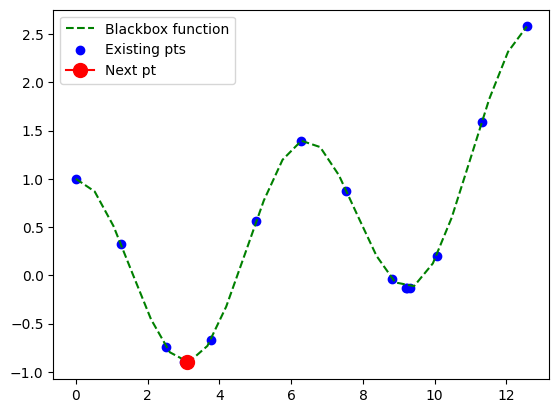

----Iteration8 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.08280886]


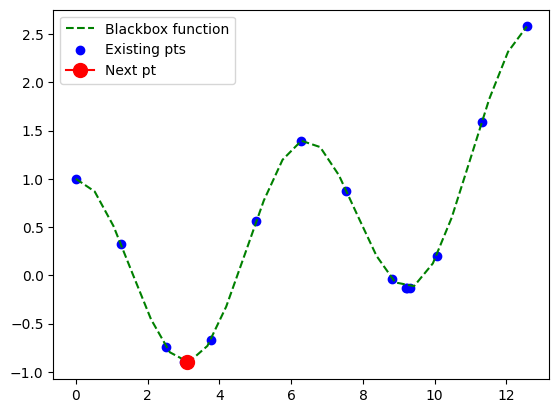

----Iteration9 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.23779309]


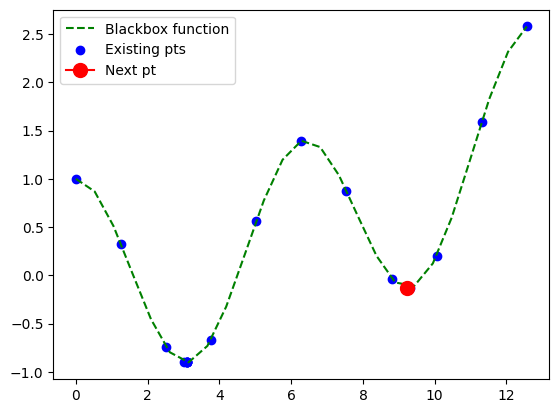

----Iteration10 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.082208]


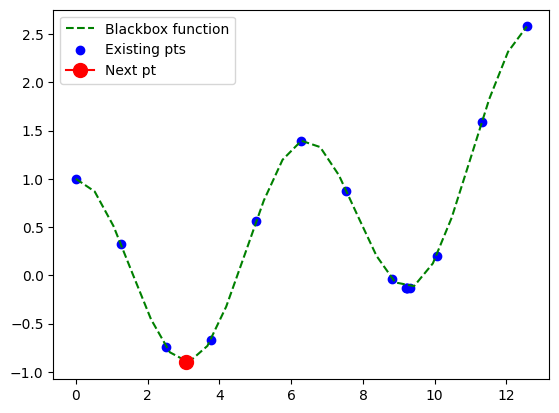

----Iteration11 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.23811201]


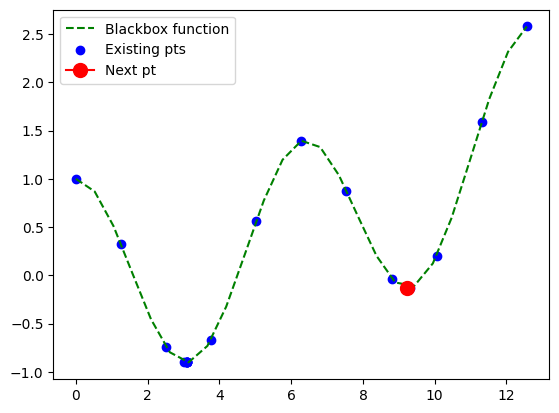

----Iteration12 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.08199528]


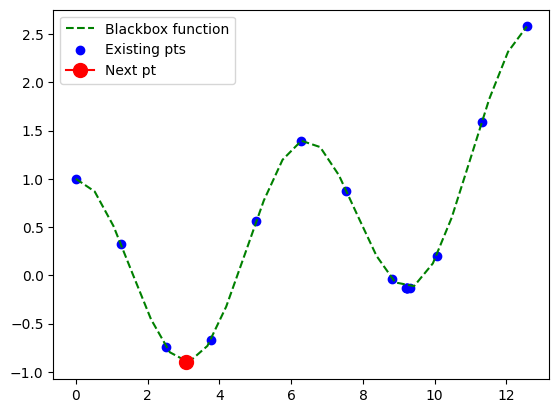

----Iteration13 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.23837561]


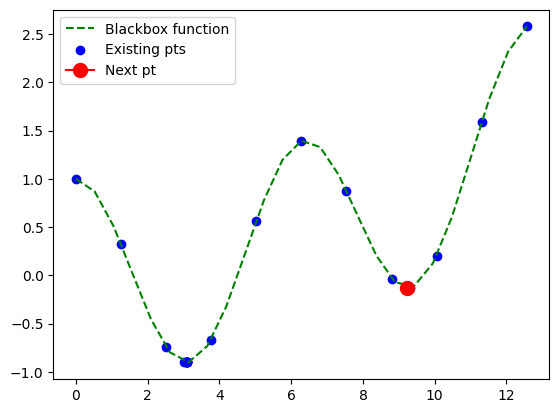

----Iteration14 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.23829688]


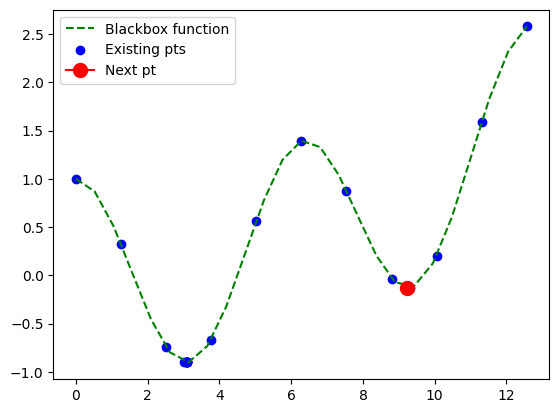

----Iteration15 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.08143744]


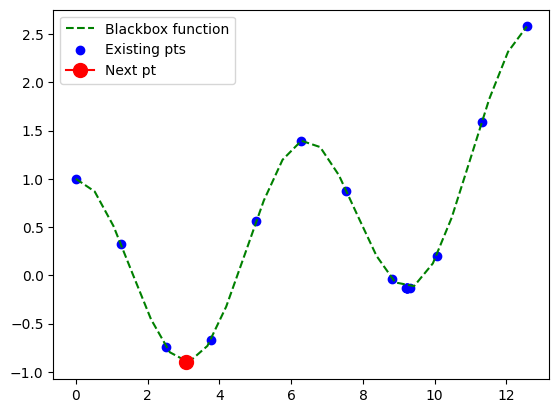

----Iteration16 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [3.08125905]


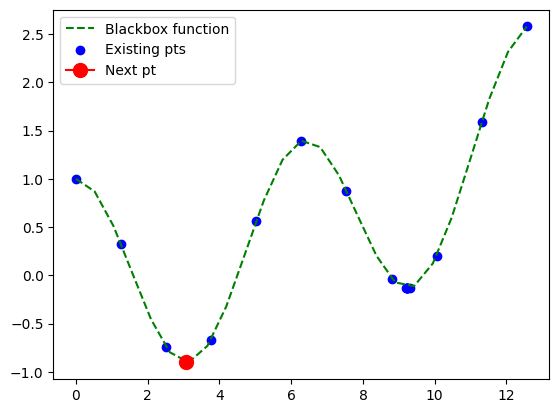

----Iteration17 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.23836702]


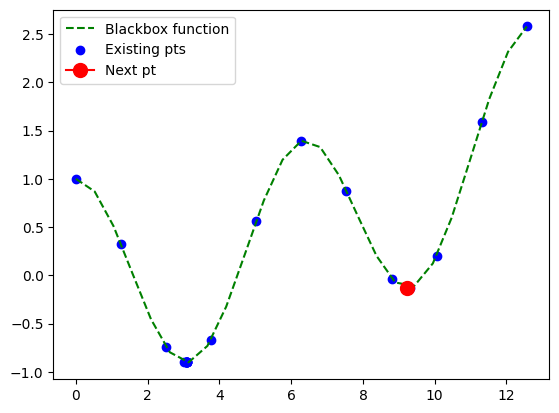

----Iteration18 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.23840966]


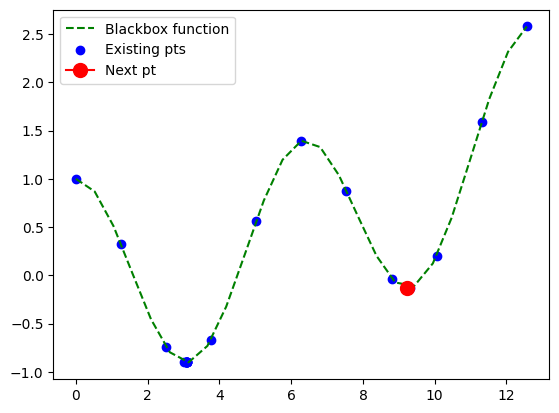

----Iteration19 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)



x_next = [9.23839793]


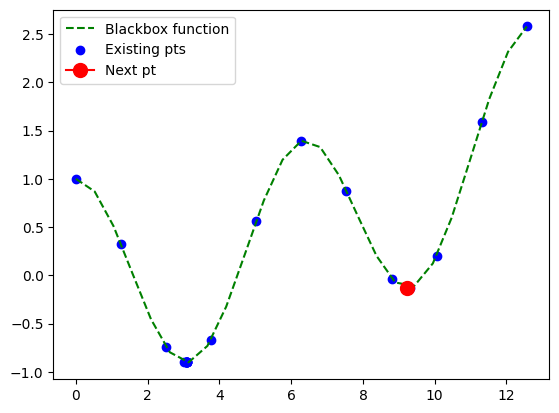

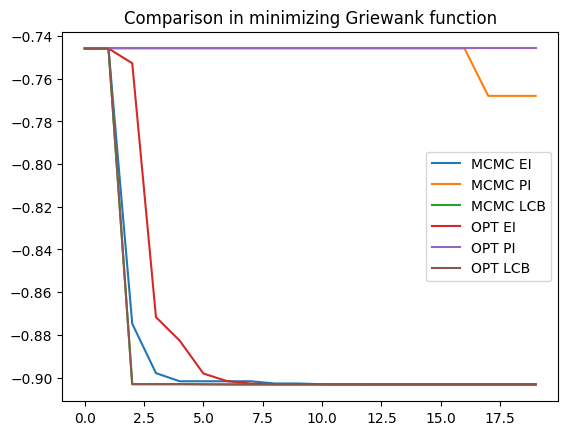

In [ ]:
# Minimizing Griewank function of 1 dimension
g = lambda x:(x**2)/100 + (np.cos(x))
g_range = [0, 4*np.pi]
mid_points = 9
max_iter = 20
baye_1d_GP_OPT = bayes_optimizer(objective_func=g,x_range=g_range,mid_points=mid_points, mode="MCMC")
best_result, best_val_mcmc_ei = baye_1d_GP_OPT.find_best(mode = "MCMC",acquisition = "EI",max_iter = max_iter)

baye_1d_GP_OPT = bayes_optimizer(objective_func=g,x_range=g_range,mid_points=mid_points, mode="MCMC")
best_result, best_val_mcmc_pi = baye_1d_GP_OPT.find_best(mode = "MCMC",acquisition = "PI",max_iter = max_iter)

baye_1d_GP_OPT = bayes_optimizer(objective_func=g,x_range=g_range,mid_points=mid_points, mode="MCMC")
best_result, best_val_mcmc_lcb = baye_1d_GP_OPT.find_best(mode = "MCMC",acquisition = "LCB",max_iter = max_iter)

baye_1d_GP_OPT = bayes_optimizer(objective_func=g,x_range=g_range,mid_points=mid_points, mode="OPT")
best_result, best_val_opt_ei = baye_1d_GP_OPT.find_best(mode = "OPT",acquisition = "EI",max_iter = max_iter)

baye_1d_GP_OPT = bayes_optimizer(objective_func=g,x_range=g_range,mid_points=mid_points, mode="OPT")
best_result, best_val_opt_pi = baye_1d_GP_OPT.find_best(mode = "OPT",acquisition = "PI",max_iter = max_iter)

baye_1d_GP_OPT = bayes_optimizer(objective_func=g,x_range=g_range,mid_points=mid_points, mode="OPT")
best_result, best_val_opt_lcb = baye_1d_GP_OPT.find_best(mode = "OPT",acquisition = "LCB",max_iter = max_iter)

plt.figure()
plt.plot(np.arange(max_iter), best_val_mcmc_ei, label='MCMC EI')
plt.plot(np.arange(max_iter), best_val_mcmc_pi, label='MCMC PI')
plt.plot(np.arange(max_iter), best_val_mcmc_lcb, label='MCMC LCB')
plt.plot(np.arange(max_iter), best_val_opt_ei, label='OPT EI')
plt.plot(np.arange(max_iter), best_val_opt_pi, label='OPT PI')
plt.plot(np.arange(max_iter), best_val_opt_lcb, label='OPT LCB')
plt.title('Comparison in minimizing Griewank function')
plt.legend()
plt.show()

In [ ]:
plt.figure()
plt.plot(np.arange(max_iter), best_val_mcmc_ei, label='MCMC EI')
# plt.plot(np.arange(max_iter), best_val_mcmc_pi, label='MCMC PI')
plt.plot(np.arange(max_iter), best_val_mcmc_lcb, label='MCMC LCB')
plt.plot(np.arange(max_iter), best_val_opt_ei, label='OPT EI')
# plt.plot(np.arange(max_iter), best_val_opt_pi, label='OPT PI')
plt.plot(np.arange(max_iter), best_val_opt_lcb, label='OPT LCB')
plt.xticks(np.arange(max_iter))
plt.legend()
plt.title('Comparison in minimizing Griewank function')
plt.show()

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.linear_model import RidgeClassifier

#define dataset

def ridge_regression(alpha):
    N_samples = 1e3
    X, y = make_blobs(n_samples=int(N_samples), centers=2, n_features=5, cluster_std=20, random_state=100)
    X_train = X[0:int(N_samples*0.9), :]
    y_train = y[0:int(N_samples*0.9)]

    X_test = X[int(N_samples*0.9):, :]
    y_test = y[int(N_samples*0.9):]

    model = RidgeClassifier(alpha=alpha)
    model.fit(X_train, y_train)
    return -model.score(X_test,y_test)

g_range = [0, 2]
mid_points = 9
max_iter = 10
baye_1d_GP_OPT = bayes_optimizer(objective_func=ridge_regression,x_range=g_range,mid_points=mid_points, mode="MCMC")
best_result, best_val_mcmc_ei = baye_1d_GP_OPT.find_best(mode = "MCMC",acquisition = "EI",max_iter = max_iter)
print(best_result)

[[0. ]
 [0.5]
 [1. ]
 [1.5]
 [2. ]]
----Iteration0 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [1.08826835]


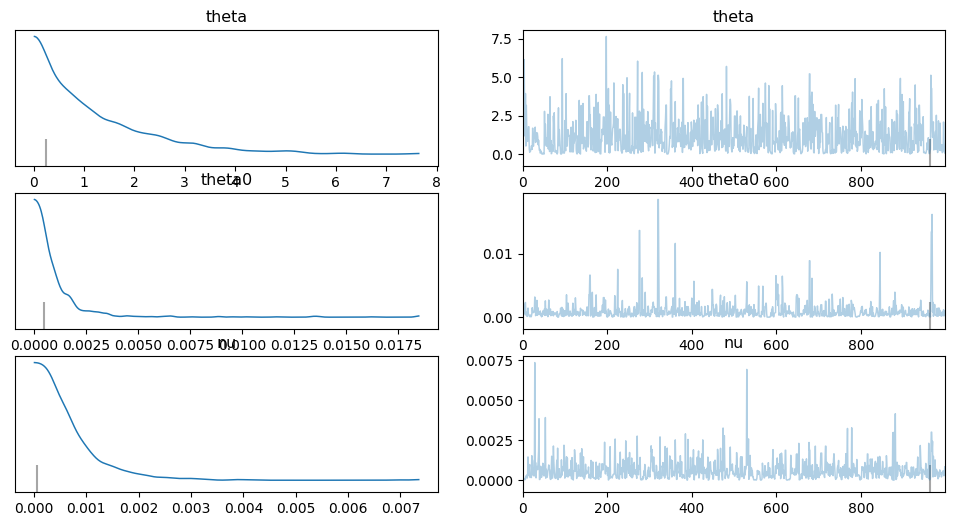

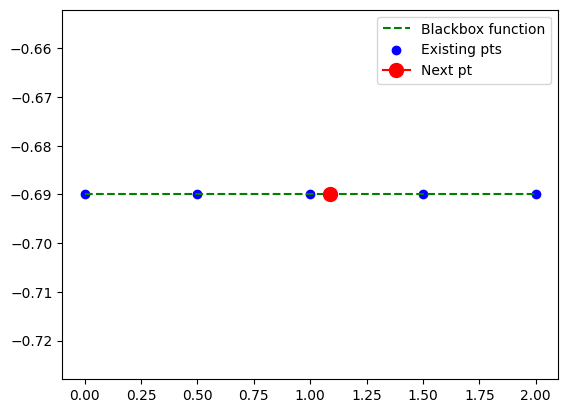

----Iteration1 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [1.70639268]


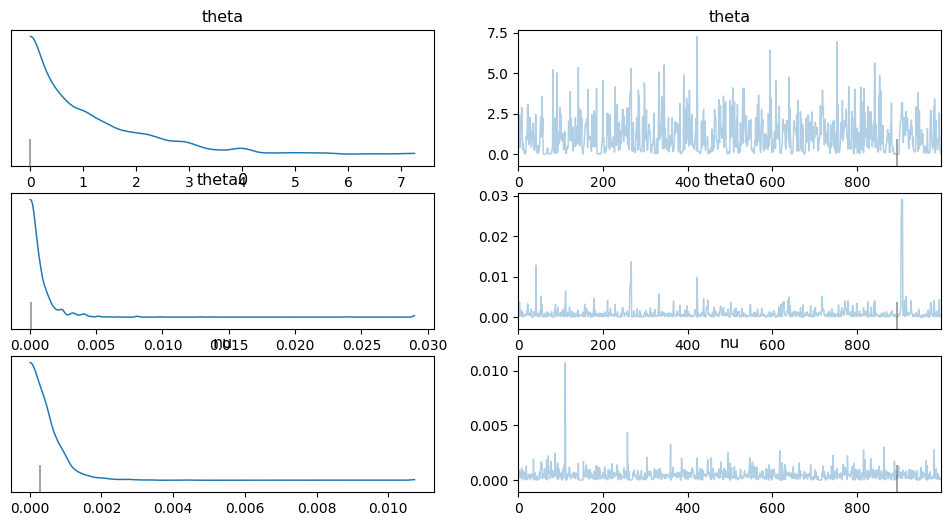

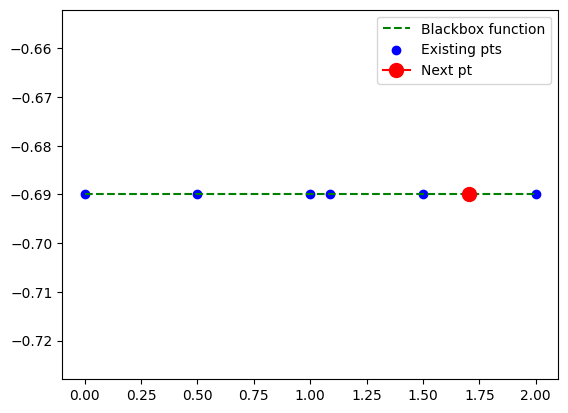

----Iteration2 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [1.24858014]


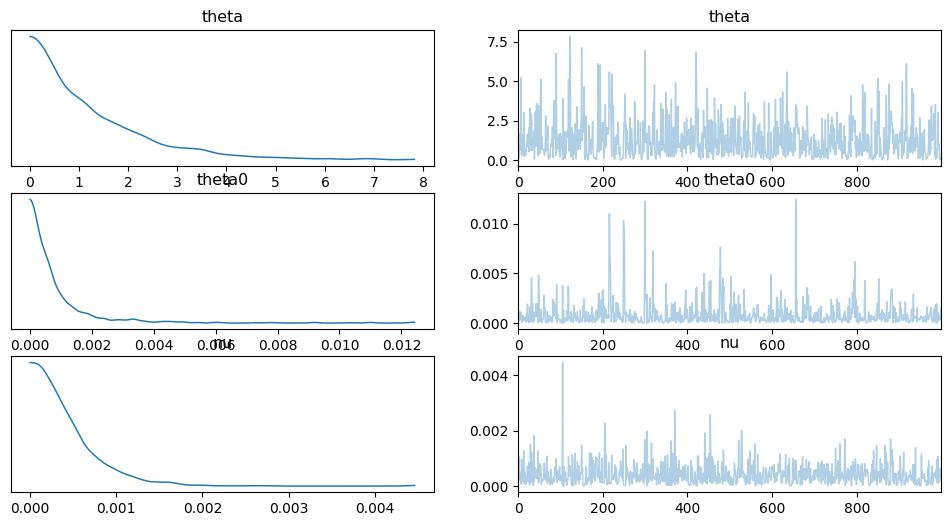

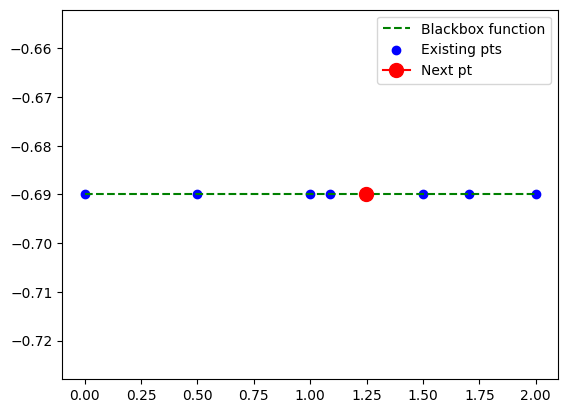

----Iteration3 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [0.89558071]


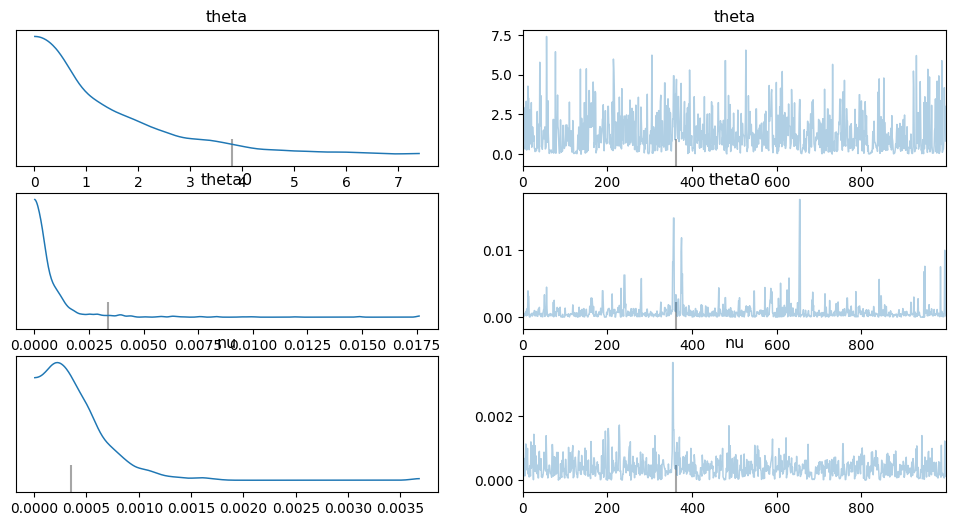

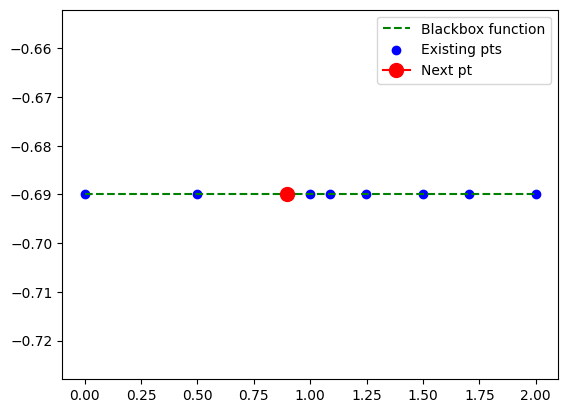

----Iteration4 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [0.97064376]


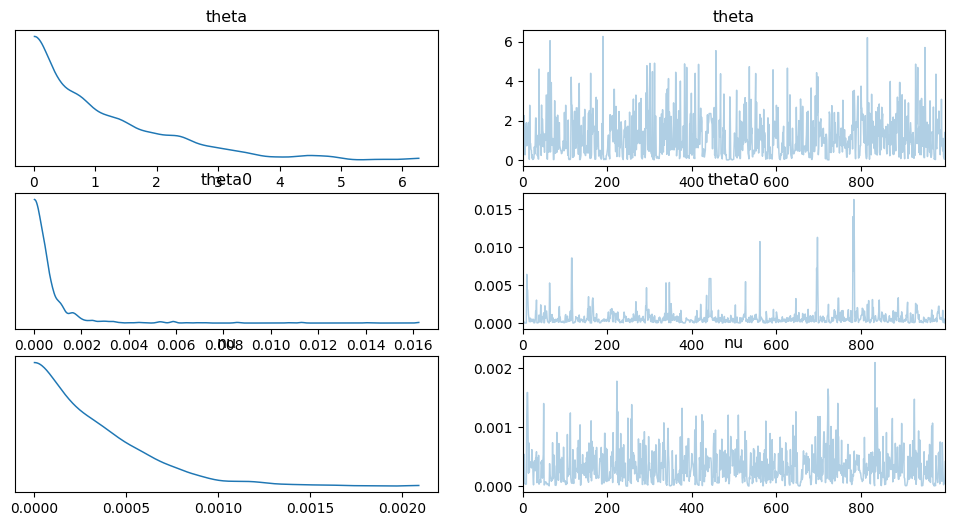

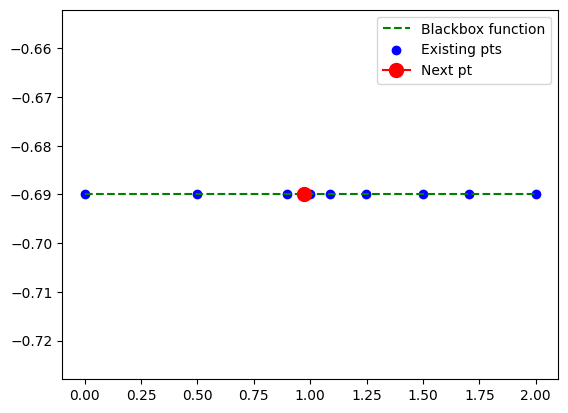

----Iteration5 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [1.77050162]


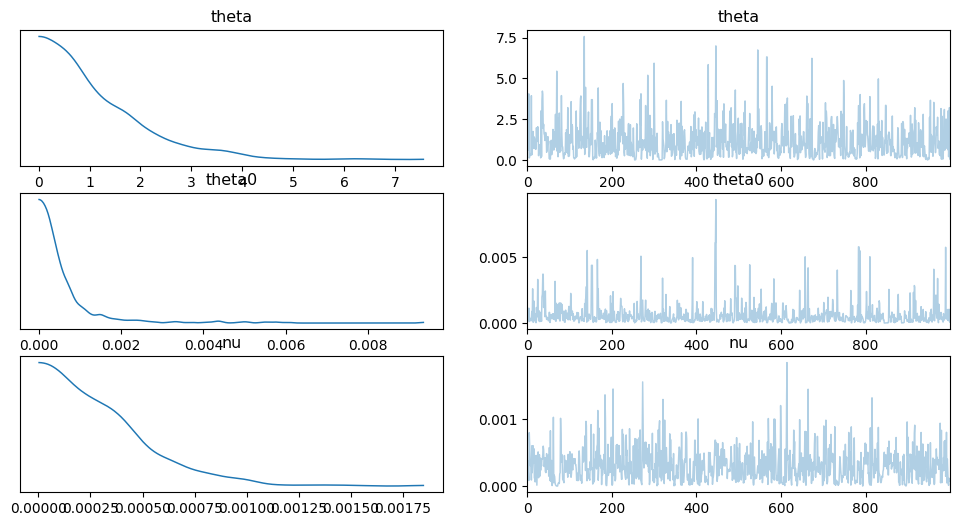

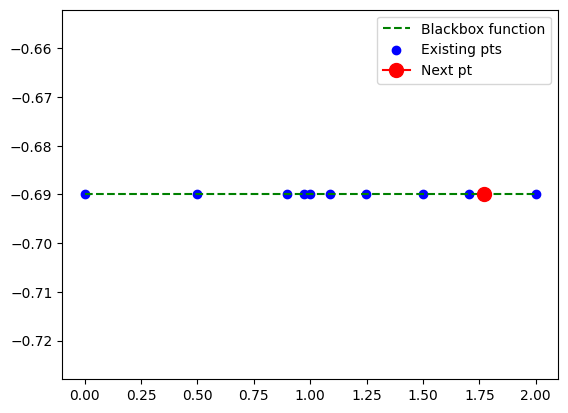

----Iteration6 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [1.7083782]


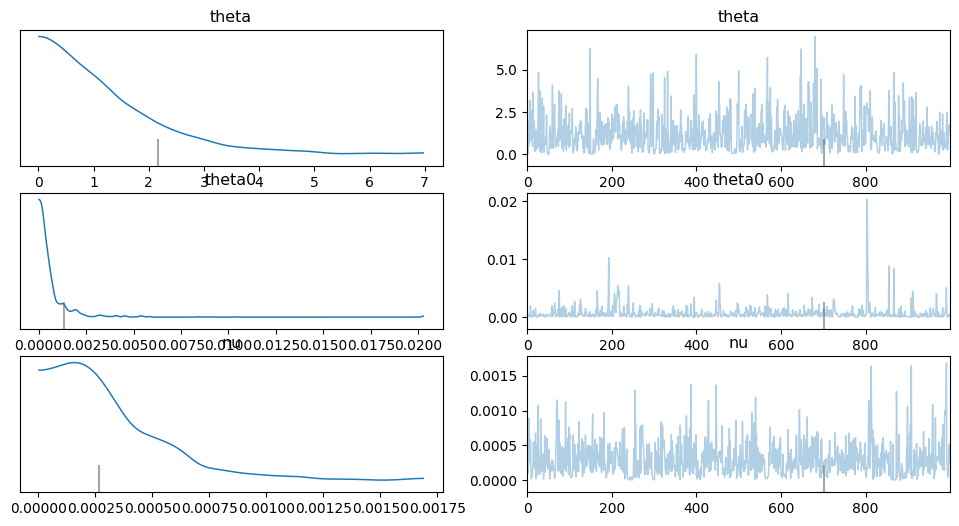

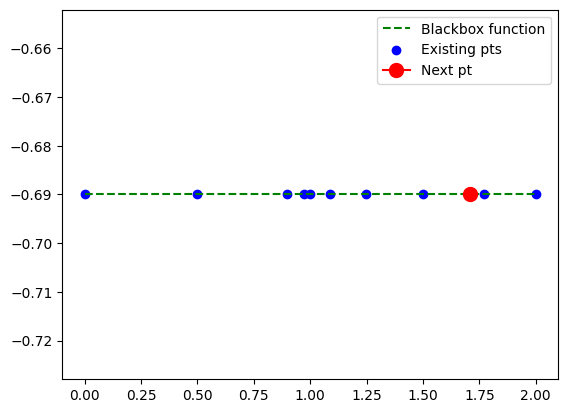

----Iteration7 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [0.61469144]


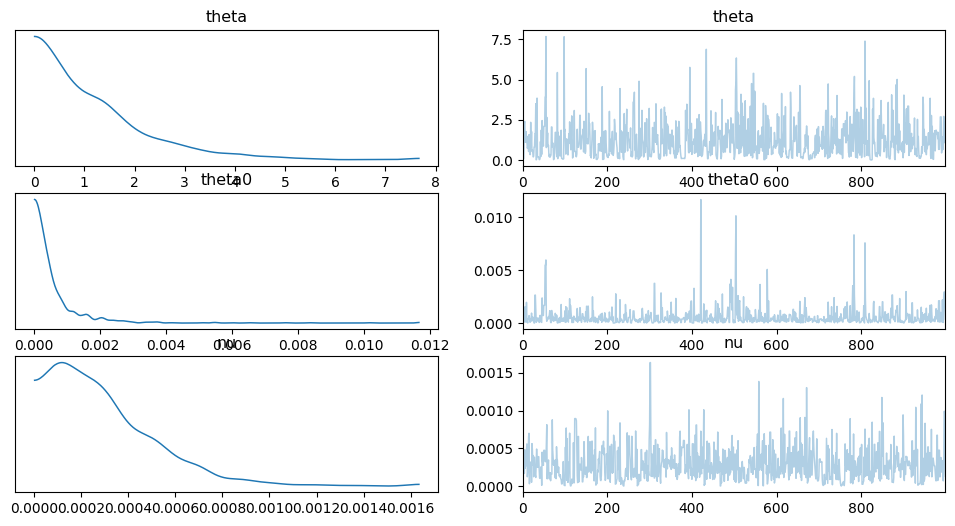

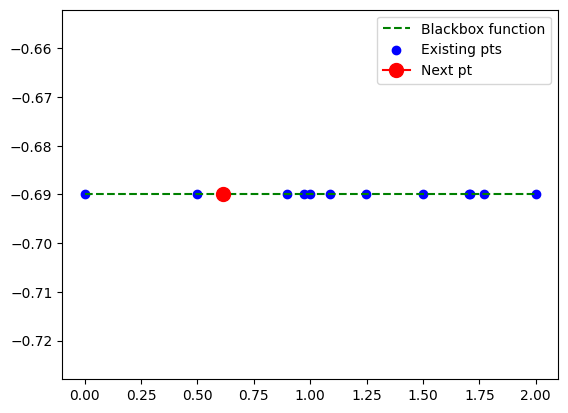

----Iteration8 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [0.98230922]


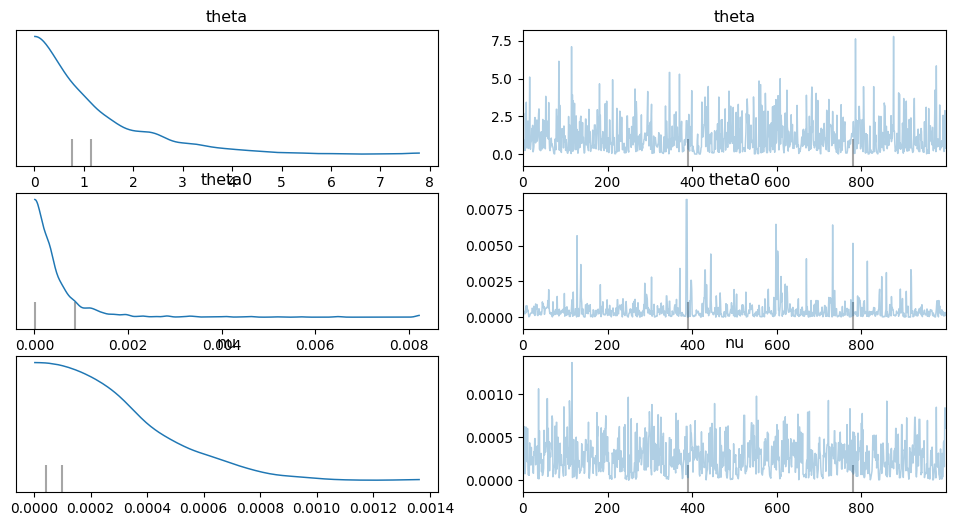

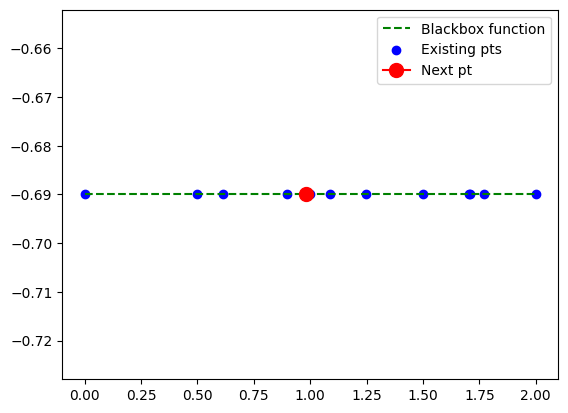

----Iteration9 started


/usr/local/lib/python3.10/dist-packages/pymc/gp/gp.py:54: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)


x_next = [1.50238045]


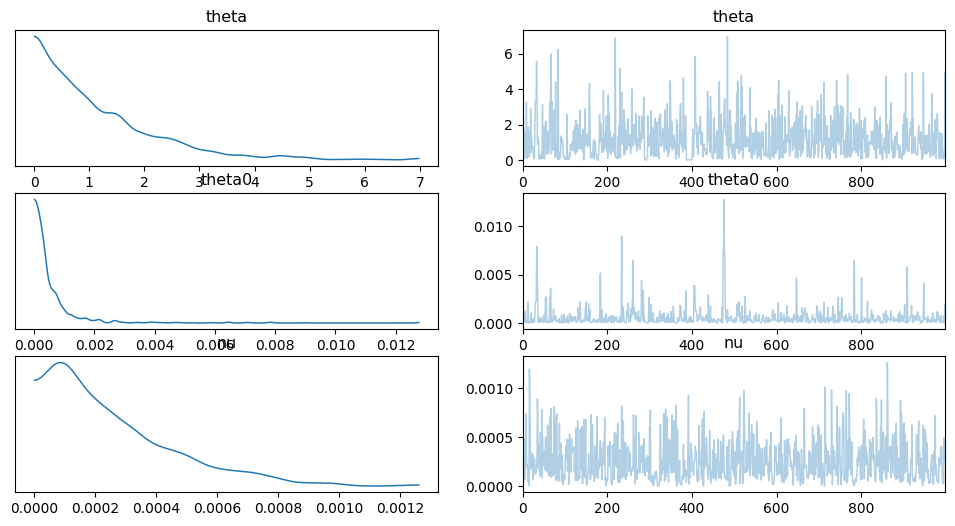

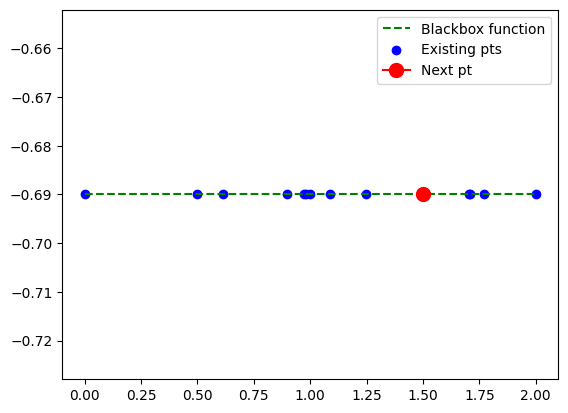

[0.]


In [27]:
from sklearn.datasets import make_blobs
from sklearn.linear_model import RidgeClassifier
import pandas as pd
#define dataset
# Read data from CSVs
male_train_data = pd.read_csv('male_train_data.csv', index_col='index')
female_train_data = pd.read_csv('female_train_data.csv', index_col='index')

# Normalize bmi and stature to bring both to same magnitude levels
# - To avoid numerical instability while using cvxpy
male_train_data['male_bmi'] = male_train_data['male_bmi'].div(10)
male_train_data['male_stature_mm'] = male_train_data['male_stature_mm'].div(1000)
female_train_data['female_bmi'] = female_train_data['female_bmi'].div(10)
female_train_data['female_stature_mm'] = female_train_data['female_stature_mm'].div(1000)

# Assign +1 to male sample and -1 to female
male_train_data['gender'] = 1
female_train_data['gender'] = -1

# X = [1 x1 x2]'; theta = [theta0 theta1 theta2]'
x1 = np.concatenate((female_train_data['female_bmi'], male_train_data['male_bmi']))
x2 = np.concatenate((female_train_data['female_stature_mm'], male_train_data['male_stature_mm']))
x0 = np.ones(len(x1))
X_train = np.column_stack((x0, x1, x2))
y_train = np.concatenate((female_train_data['gender'], male_train_data['gender']))

# Read data from CSVs
male_train_data = pd.read_csv('male_test_data.csv', index_col='index')
female_train_data = pd.read_csv('female_test_data.csv', index_col='index')

# Normalize bmi and stature to bring both to same magnitude levels
# - To avoid numerical instability while using cvxpy
male_train_data['male_bmi'] = male_train_data['male_bmi'].div(10)
male_train_data['male_stature_mm'] = male_train_data['male_stature_mm'].div(1000)
female_train_data['female_bmi'] = female_train_data['female_bmi'].div(10)
female_train_data['female_stature_mm'] = female_train_data['female_stature_mm'].div(1000)

# Assign +1 to male sample and -1 to female
male_train_data['gender'] = 1
female_train_data['gender'] = -1

# X = [1 x1 x2]'; theta = [theta0 theta1 theta2]'
x1 = np.concatenate((female_train_data['female_bmi'], male_train_data['male_bmi']))
x2 = np.concatenate((female_train_data['female_stature_mm'], male_train_data['male_stature_mm']))
x0 = np.ones(len(x1))
X_test = np.column_stack((x0, x1, x2))
y_test = np.concatenate((female_train_data['gender'], male_train_data['gender']))

def ridge_regression(alpha, X_train=X, y_train=y_train, X_test=X_test, y_test=y_test):
    N_samples = 1e3
    X, y = make_blobs(n_samples=int(N_samples), centers=2, n_features=5, cluster_std=20, random_state=100)
    X_train = X[0:int(N_samples*0.9), :]
    y_train = y[0:int(N_samples*0.9)]

    X_test = X[int(N_samples*0.9):, :]
    y_test = y[int(N_samples*0.9):]

    model = RidgeClassifier(alpha=alpha)
    model.fit(X_train, y_train)
    return -model.score(X_test,y_test)

g_range = [0, 2]
mid_points = 3
max_iter = 10
baye_1d_GP_OPT = bayes_optimizer(objective_func=ridge_regression,x_range=g_range,mid_points=mid_points, mode="MCMC")
best_result, best_val_mcmc_ei = baye_1d_GP_OPT.find_best(mode = "MCMC",acquisition = "EI",max_iter = max_iter)
print(best_result)